

<div style="display:block;width:100%;margin:auto;" direction=rtl align=center><br><br>
    <div  style="width:100%;margin:100;display:block;background-color:#fff0;"  display=block align=center>
        <table style="border-style:hidden;border-collapse:collapse;">             <tr>
                <td  style="border: none!important;">
                    <img width=130 align=right src="https://i.ibb.co/yXKQmtZ/logo1.png" style="margin:0;" />
                </td>
                <td style="text-align:center;border: none!important;">
                    <h1 align=center><font size=5 color="#025F5F"> <b>Deep Generative Models</b><br><br>Project 3 DDPM and DDIM implementation </i></font></h1>
                </td>
                <td style="border: none!important;">
                    <img width=170 align=left  src="https://i.ibb.co/wLjqFkw/logo2.png" style="margin:0;" />
                </td>
           </tr>
</div>
        </table>
    </div>

## Mohammad Taha Majlesi - 8100101504

Deep Generative Models course - Dr. Tavassoli pour - University of Tehran


# **In the Name of God**  
## **University of Tehran**  
### **School of Electrical and Computer Engineering**  

---


### **Course Title: Deep Generative Models**  
**Instructor:** Dr. Mostafa Tavassoli  
**Homework 3**  
**Submission Date:** December 2023  

---




In [1]:
!pip install pytorch_fid

In [ ]:
import os
import time
import numpy as np
import matplotlib.pyplot as plt
from typing import Tuple

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torchvision.utils import save_image

from tqdm import tqdm
from pytorch_fid import fid_score

In [ ]:
timesteps = 1000
beta1 = 1e-4
beta2 = 0.02

n_feat = 64
n_cfeat = 5
height = 16
save_dir = './samples/'

batch_size = 100
n_epoch = 40
lrate = 1e-3

device = torch.device("cuda:0" if torch.cuda.is_available() else torch.device('cpu'))
print(f'Using device: {device}')

## Setup and Configuration

This cell sets up the device for computation and defines utility functions for normalizing images and plotting samples. The device is automatically selected as CUDA if available, otherwise CPU. The `unorm` function normalizes images to [0,1] for visualization, and `plot_sample` displays a grid of generated images.

In [ ]:
class CustomDataset(Dataset):
    def __init__(self, _sprites, _slabels, transform, null_context=False):
        self.transform = transform
        self.null_context = null_context
        self.sprites = _sprites
        self.slabels = _slabels
        self.sprites_shape = self.sprites.shape
        self.slabel_shape = self.slabels.shape

    def __len__(self):
        return len(self.sprites)

    def __getitem__(self, idx):
        if self.transform:
            image = self.transform(self.sprites[idx])
            if self.null_context:
                label = torch.tensor(0).to(torch.int64)
            else:
                label = torch.tensor(self.slabels[idx]).to(torch.int64)
        return (image, label)

    def getshapes(self):
        return self.sprites_shape, self.slabel_shape

## Custom Dataset Class

This cell defines a custom PyTorch Dataset class for loading the sprites dataset. The dataset handles image and label loading, applies transformations, and supports null context for unconditional generation. It provides methods to get the shapes of the data for debugging.

In [5]:



class ResidualConvBlock(nn.Module):
    def __init__(
        self, in_channels: int, out_channels: int, is_res: bool = False
    ) -> None:
        super().__init__()

        self.same_channels = in_channels == out_channels

        self.is_res = is_res

        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, 1, 1),
            nn.BatchNorm2d(out_channels),
            nn.GELU(),
        )

        self.conv2 = nn.Sequential(
            nn.Conv2d(out_channels, out_channels, 3, 1, 1),
            nn.BatchNorm2d(out_channels),
            nn.GELU(),
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:

        if self.is_res:
            x1 = self.conv1(x)

            x2 = self.conv2(x1)

            if self.same_channels:
                out = x + x2
            else:
                shortcut = nn.Conv2d(x.shape[1], x2.shape[1], kernel_size=1, stride=1, padding=0).to(x.device)
                out = shortcut(x) + x2

            return out / 1.414

        else:
            x1 = self.conv1(x)
            x2 = self.conv2(x1)
            return x2

    def get_out_channels(self):
        return self.conv2[0].out_channels

    def set_out_channels(self, out_channels):
        self.conv1[0].out_channels = out_channels
        self.conv2[0].in_channels = out_channels
        self.conv2[0].out_channels = out_channels

## Residual Convolutional Block

This cell defines a residual convolutional block used in the U-Net architecture. It includes two convolutional layers with batch normalization and GELU activation, with an optional residual connection for improved gradient flow. The block supports both residual and non-residual modes.

In [ ]:
class UnetUp(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(UnetUp, self).__init__()

        layers = [
            nn.ConvTranspose2d(in_channels, out_channels, 2, 2),
            ResidualConvBlock(out_channels, out_channels),
            ResidualConvBlock(out_channels, out_channels),
        ]

        self.model = nn.Sequential(*layers)

    def forward(self, x, skip):
        x = torch.cat((x, skip), 1)

        x = self.model(x)
        return x

## U-Net Up Block

This cell defines the upsampling block for the U-Net decoder. It performs transposed convolution followed by two residual convolutional blocks to upsample and refine features, concatenating skip connections from the encoder.

In [7]:

class UnetDown(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(UnetDown, self).__init__()

        layers = [ResidualConvBlock(in_channels, out_channels), ResidualConvBlock(out_channels, out_channels), nn.MaxPool2d(2)]

        self.model = nn.Sequential(*layers)

    def forward(self, x):
        return self.model(x)

## U-Net Down Block

This cell defines the downsampling block for the U-Net encoder. It applies two residual convolutional blocks followed by max pooling to reduce spatial dimensions and extract hierarchical features.

In [ ]:

class EmbedFC(nn.Module):
    def __init__(self, input_dim, emb_dim):
        super(EmbedFC, self).__init__()

        self.input_dim = input_dim

        layers = [
            nn.Linear(input_dim, emb_dim),
            nn.GELU(),
            nn.Linear(emb_dim, emb_dim),
        ]

        self.model = nn.Sequential(*layers)

    def forward(self, x):
        x = x.view(-1, self.input_dim)
        return self.model(x)

## Embedding Fully Connected Layer

This cell defines an embedding layer for time and context conditioning. It uses linear layers with GELU activation to embed scalar time steps or context vectors into higher-dimensional spaces for conditioning the U-Net.

In [ ]:



class Unet(nn.Module):
    def __init__(self, in_channels, n_feat=64, n_cfeat=5, height=16):
        super(Unet, self).__init__()

        self.in_channels = in_channels
        self.n_feat = n_feat
        self.n_cfeat = n_cfeat
        self.h = height 

        self.init_conv = ResidualConvBlock(in_channels, n_feat, is_res=True)

        self.down1 = UnetDown(n_feat, n_feat)
        self.down2 = UnetDown(n_feat, 2 * n_feat)

        self.to_vec = nn.Sequential(nn.AvgPool2d((4)), nn.GELU())

        self.timeembed1 = EmbedFC(1, 2*n_feat)
        self.timeembed2 = EmbedFC(1, 1*n_feat)
        self.contextembed1 = EmbedFC(n_cfeat, 2*n_feat)
        self.contextembed2 = EmbedFC(n_cfeat, 1*n_feat)

        self.up0 = nn.Sequential(
            nn.ConvTranspose2d(2 * n_feat, 2 * n_feat, self.h//4, self.h//4),
            nn.GroupNorm(8, 2 * n_feat), 
            nn.ReLU(),
        )
        self.up1 = UnetUp(4 * n_feat, n_feat)
        self.up2 = UnetUp(2 * n_feat, n_feat)

        self.out = nn.Sequential(
            nn.Conv2d(2 * n_feat, n_feat, 3, 1, 1),
            nn.GroupNorm(8, n_feat),
            nn.ReLU(),
            nn.Conv2d(n_feat, self.in_channels, 3, 1, 1),
        )

    def forward(self, x, t, c=None):

        x = self.init_conv(x)
        down1 = self.down1(x)       
        down2 = self.down2(down1)  

        hiddenvec = self.to_vec(down2)

        if c is None:
            c = torch.zeros(x.shape[0], self.n_cfeat).to(x)

        t = t.unsqueeze(1)  
        cemb1 = self.contextembed1(c).view(-1, self.n_feat * 2, 1, 1)
        temb1 = self.timeembed1(t).view(-1, self.n_feat * 2, 1, 1)
        cemb2 = self.contextembed2(c).view(-1, self.n_feat, 1, 1)
        temb2 = self.timeembed2(t).view(-1, self.n_feat, 1, 1)

        up1 = self.up0(hiddenvec)
        up2 = self.up1(cemb1 * up1 + temb1, down2)
        up3 = self.up2(cemb2 * up2 + temb2, down1)
        out = self.out(torch.cat((up3, x), 1))
        return out


## U-Net Architecture

This cell defines the complete U-Net model for diffusion. It includes encoder and decoder paths with skip connections, time and context embeddings for conditional generation. The model predicts noise added to images at different diffusion timesteps.

In [ ]:
def compute_fid(real_images, generated_images, batch_size=50):
    real_dir = "./real_images/"
    generated_dir = "./generated_images/"
    os.makedirs(real_dir, exist_ok=True)
    os.makedirs(generated_dir, exist_ok=True)

    for folder in [real_dir, generated_dir]:
        for filename in os.listdir(folder):
            file_path = os.path.join(folder, filename)
            try:
                if os.path.isfile(file_path):
                    os.unlink(file_path)
            except Exception as e:
                print(f"Failed to delete {file_path}. Reason: {e}")

    for i in range(real_images.size(0)):
        save_image(real_images[i], os.path.join(real_dir, f"real_{i}.png"))

    for i in range(generated_images.size(0)):
        save_image(generated_images[i], os.path.join(generated_dir, f"gen_{i}.png"))

    fid = fid_score.calculate_fid_given_paths(
        [real_dir, generated_dir], batch_size=batch_size, device=device, dims=2048
    )
    return fid

## FID Computation Function

This cell defines a function to compute the Fréchet Inception Distance (FID) between real and generated images. It saves images to directories, uses pytorch-fid to calculate the metric, and returns the FID score for evaluating generation quality.

In [ ]:
def perturb_input(x0, t, alpha_bar):
    noise = torch.randn_like(x0).to(device)
    sqrt_alpha_bar = torch.sqrt(alpha_bar[t]).reshape(-1, 1, 1, 1)
    sqrt_one_minus_alpha_bar = torch.sqrt(1 - alpha_bar[t]).reshape(-1, 1, 1, 1)
    xt = sqrt_alpha_bar * x0 + sqrt_one_minus_alpha_bar * noise
    return xt, noise

## Forward Diffusion Process

This cell implements the forward diffusion process that adds noise to clean images according to the variance schedule. It takes clean images and timesteps, returning the noisy images and the added noise for training the denoising model.

In [ ]:
@torch.no_grad()
def sample_ddpm(
    nn_model, n_sample, timesteps, beta, alpha, alpha_bar, device, height=16
):
    nn_model.eval()
    samples = torch.randn(n_sample, 3, height, height).to(device)

    for t in tqdm(reversed(range(timesteps)), desc="DDPM Sampling"):
        t_batch = torch.full((n_sample,), t, dtype=torch.long, device=device)

        t_normalized = t_batch.float() / timesteps
        noise_pred = nn_model(samples, t_normalized)

        sqrt_alpha_t = torch.sqrt(alpha[t]).reshape(1, 1, 1, 1)
        sqrt_one_minus_alpha_bar_t = torch.sqrt(1 - alpha_bar[t]).reshape(1, 1, 1, 1)
        sqrt_recip_alpha_t = torch.sqrt(1.0 / alpha[t]).reshape(1, 1, 1, 1)
        beta_t = beta[t]
        sqrt_beta_t = torch.sqrt(beta[t]).reshape(1, 1, 1, 1)

        mean = sqrt_recip_alpha_t * (
            samples - (beta_t / sqrt_one_minus_alpha_bar_t) * noise_pred
        )

        if t > 0:
            noise = torch.randn_like(samples).to(device)
            sigma_t = sqrt_beta_t
            samples = mean + sigma_t * noise
        else:
            samples = mean

    return samples

## DDPM Sampling Function

This cell implements the reverse diffusion sampling for Denoising Diffusion Probabilistic Models (DDPM). It starts from pure noise and iteratively denoises using the trained model to generate new images, following the original DDPM algorithm.

In [ ]:
@torch.no_grad()
def sample_ddim(
    nn_model,
    n_sample,
    timesteps,
    beta,
    alpha,
    alpha_bar,
    device,
    height=16,
    eta=0.0,
    n_steps=50,
):
    nn_model.eval()
    samples = torch.randn(n_sample, 3, height, height).to(device)

    n = n_steps
    step_size = timesteps // n

    print(f"Starting DDIM sampling with {n} steps (step size: {step_size})")

    for i in tqdm(reversed(range(n)), desc="DDIM Sampling"):
        t = i * step_size
        t_prev = (i - 1) * step_size if i > 0 else 0

        t_batch = torch.full((n_sample,), t, dtype=torch.long, device=device)
        t_prev_batch = torch.full((n_sample,), t_prev, dtype=torch.long, device=device)

        t_normalized = t_batch.float() / timesteps
        noise_pred = nn_model(samples, t_normalized)

        alpha_t = alpha[t].reshape(1, 1, 1, 1)
        alpha_bar_t = alpha_bar[t].reshape(1, 1, 1, 1)
        alpha_bar_prev = alpha_bar[t_prev].reshape(1, 1, 1, 1)

        sqrt_alpha_bar_prev = torch.sqrt(alpha_bar_prev)
        sqrt_alpha_bar_t = torch.sqrt(alpha_bar_t)
        ratio = sqrt_alpha_bar_prev / sqrt_alpha_bar_t

        epsilon = 1e-5
        denom = torch.sqrt(1 - alpha_bar_t)
        denom = torch.where(
            denom < epsilon, torch.tensor(epsilon, device=device), denom
        )

        mean = ratio * samples - (beta[t].reshape(1, 1, 1, 1) / denom) * noise_pred

        if eta > 0.0 and t > 0:
            sigma_t = eta * torch.sqrt(beta[t]).reshape(1, 1, 1, 1)
            noise = torch.randn_like(samples).to(device)
            samples = mean + sigma_t * noise
            print(f"Step {i+1}/{n}: Added noise with sigma_t={sigma_t.item()}")
        else:
            samples = mean
            print(f"Step {i+1}/{n}: Deterministic step")

    print("DDIM sampling completed.")
    return samples

## DDIM Sampling Function

This cell implements Denoising Diffusion Implicit Models (DDIM) sampling, a faster variant of DDPM. It allows trading off between sample quality and speed by adjusting the number of sampling steps and the eta parameter for stochasticity.

In [ ]:
timesteps = 1000
beta1 = 1e-4
beta2 = 0.02

n_feat = 64
n_cfeat = 5
height = 16
save_dir = "./samples/"
os.makedirs(save_dir, exist_ok=True)

batch_size = 100
n_epoch = 40
lrate = 1e-3

transform = transforms.Compose(
    [transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))]
)

dataset_url = "https://huggingface.co/datasets/ashis-palai/sprites_image_dataset/resolve/a24918819843abc0d1bee75a239024415081a87d/"
dataset_files = {
    "sprites_1788_16x16.npy": dataset_url + "sprites_1788_16x16.npy",
    "sprite_labels_nc_1788_16x16.npy": dataset_url + "sprite_labels_nc_1788_16x16.npy",
}

for filename, url in dataset_files.items():
    if not os.path.exists(filename):
        print(f"Downloading {filename}...")
        os.system(f"wget -O {filename} '{url}'")
    else:
        print(f"{filename} already exists.")

sprites = np.load("sprites_1788_16x16.npy")
slabels = np.load("sprite_labels_nc_1788_16x16.npy")

print(f"sprite shape: {sprites.shape}")
print(f"labels shape: {slabels.shape}")

total_samples = sprites.shape[0]
train_size = int(0.8 * total_samples)
val_size = total_samples - train_size

train_sprites = sprites[:train_size]
train_slabels = slabels[:train_size]
val_sprites = sprites[train_size:]
val_slabels = slabels[train_size:]

print(f"Training set size: {train_sprites.shape[0]}")
print(f"Validation set size: {val_sprites.shape[0]}")

train_dataset = CustomDataset(
    train_sprites, train_slabels, transform, null_context=False
)
train_dataloader = DataLoader(
    train_dataset, batch_size=batch_size, shuffle=True, num_workers=2
)

val_dataset = CustomDataset(val_sprites, val_slabels, transform, null_context=False)
val_dataloader = DataLoader(
    val_dataset, batch_size=batch_size, shuffle=False, num_workers=2
)

nn_model = Unet(in_channels=3, n_feat=n_feat, n_cfeat=n_cfeat, height=height).to(device)

optimizer = torch.optim.Adam(nn_model.parameters(), lr=lrate)

sprite shape: (89400, 16, 16, 3)
labels shape: (89400, 5)
Training set size: 71520
Validation set size: 17880


## Hyperparameters and Dataset Preparation

This cell sets the hyperparameters for training, downloads the sprites dataset if needed, loads the data, applies transformations, and creates train/validation DataLoaders. It also initializes the U-Net model and optimizer.

In [ ]:
beta = torch.linspace(beta1, beta2, timesteps).to(device)
alpha = 1.0 - beta
alpha_bar = torch.cumprod(alpha, dim=0)

loss_history = []

save_dir_ddpm = os.path.join(save_dir, "ddpm_samples")
save_dir_ddim = os.path.join(save_dir, "ddim_samples")
os.makedirs(save_dir_ddpm, exist_ok=True)
os.makedirs(save_dir_ddim, exist_ok=True)

fid_history_ddpm = []
fid_history_ddim = []

## Diffusion Schedule Computation

This cell computes the diffusion schedule: beta (variance), alpha (1-beta), and alpha_bar (cumulative product) used in the forward and reverse diffusion processes.


Epoch 1/40


Training: 100%|██████████| 716/716 [00:27<00:00, 25.80it/s]


Average Loss: 0.077889


DDPM Sampling: 1000it [00:06, 155.94it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 12it [00:00, 114.67it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step


DDIM Sampling: 24it [00:00, 117.29it/s]

Step 477/500: Deterministic step


DDIM Sampling: 36it [00:00, 115.63it/s]

Step 476/500: Deterministic step
Step 475/500: Deterministic step
Step 474/500: Deterministic step
Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step


DDIM Sampling: 49it [00:00, 118.73it/s]

Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step


DDIM Sampling: 61it [00:00, 111.05it/s]

Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step


DDIM Sampling: 86it [00:00, 115.08it/s]

Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step


DDIM Sampling: 116it [00:00, 130.09it/s]

Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step


DDIM Sampling: 146it [00:01, 137.22it/s]

Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step


DDIM Sampling: 175it [00:01, 141.04it/s]

Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step


DDIM Sampling: 204it [00:01, 133.47it/s]

Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step


DDIM Sampling: 234it [00:01, 139.00it/s]

Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step


DDIM Sampling: 264it [00:02, 142.01it/s]

Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step


DDIM Sampling: 294it [00:02, 142.54it/s]

Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step


DDIM Sampling: 324it [00:02, 142.74it/s]

Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step


DDIM Sampling: 339it [00:02, 135.64it/s]

Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step


DDIM Sampling: 353it [00:02, 135.91it/s]

Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step


DDIM Sampling: 368it [00:02, 137.72it/s]

Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step


DDIM Sampling: 383it [00:02, 139.13it/s]

Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step


DDIM Sampling: 397it [00:02, 138.46it/s]

Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step


DDIM Sampling: 411it [00:03, 138.08it/s]

Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step


DDIM Sampling: 425it [00:03, 136.78it/s]

Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step


DDIM Sampling: 439it [00:03, 137.26it/s]

Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step


DDIM Sampling: 454it [00:03, 138.41it/s]

Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step


DDIM Sampling: 468it [00:03, 136.63it/s]

Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step


DDIM Sampling: 482it [00:03, 134.45it/s]

Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step


DDIM Sampling: 496it [00:03, 134.91it/s]

Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step


DDIM Sampling: 500it [00:03, 133.83it/s]


Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


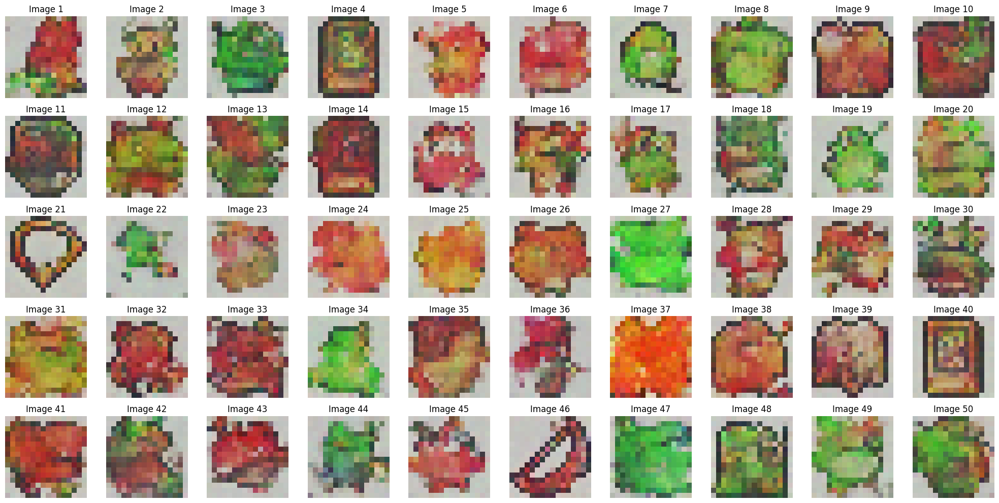

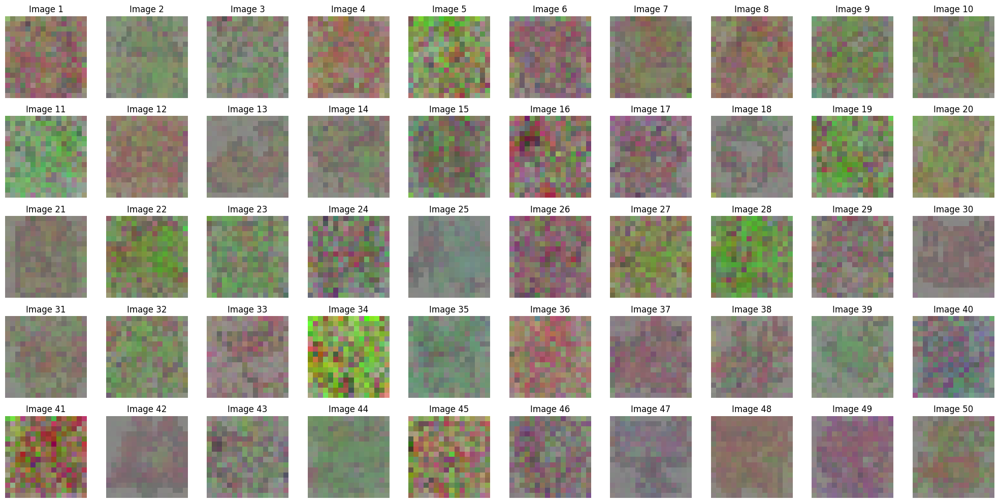

100%|██████████| 1/1 [00:00<00:00,  3.50it/s]


FID Score for DDPM at Epoch 1: 182.62967455676682


100%|██████████| 1/1 [00:00<00:00,  3.46it/s]


FID Score for DDIM at Epoch 1: 351.7561199204729

Epoch 2/40


Training: 100%|██████████| 716/716 [00:27<00:00, 26.27it/s]


Average Loss: 0.072908


DDPM Sampling: 1000it [00:06, 152.12it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 15it [00:00, 143.58it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step
Step 474/500: Deterministic step
Step 473/500: Deterministic step
Step 472/500: Deterministic step


DDIM Sampling: 45it [00:00, 141.51it/s]

Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step


DDIM Sampling: 75it [00:00, 141.95it/s]

Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step


DDIM Sampling: 104it [00:00, 137.14it/s]

Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step


DDIM Sampling: 133it [00:00, 137.13it/s]

Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step


DDIM Sampling: 161it [00:01, 137.37it/s]

Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step


DDIM Sampling: 190it [00:01, 140.34it/s]

Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step


DDIM Sampling: 218it [00:01, 124.27it/s]

Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step

DDIM Sampling: 231it [00:01, 116.84it/s]


Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step


DDIM Sampling: 256it [00:01, 116.48it/s]

Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step


DDIM Sampling: 282it [00:02, 119.82it/s]

Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step


DDIM Sampling: 309it [00:02, 123.95it/s]

Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step

DDIM Sampling: 337it [00:02, 128.27it/s]


Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step


DDIM Sampling: 363it [00:02, 124.16it/s]

Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step


DDIM Sampling: 388it [00:03, 117.61it/s]

Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step


DDIM Sampling: 413it [00:03, 118.19it/s]

Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step


DDIM Sampling: 437it [00:03, 116.06it/s]

Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step


DDIM Sampling: 462it [00:03, 118.23it/s]

Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step


DDIM Sampling: 486it [00:03, 108.95it/s]

Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step


DDIM Sampling: 500it [00:04, 123.89it/s]


Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


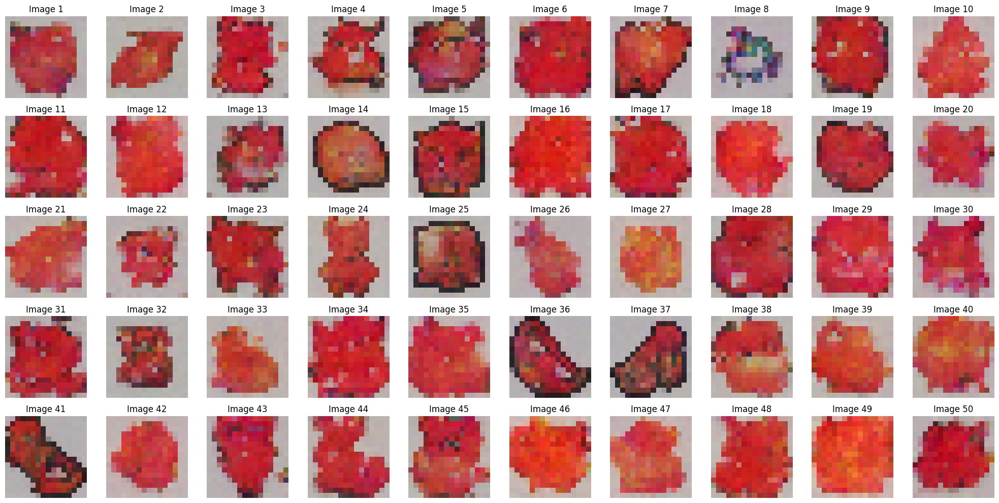

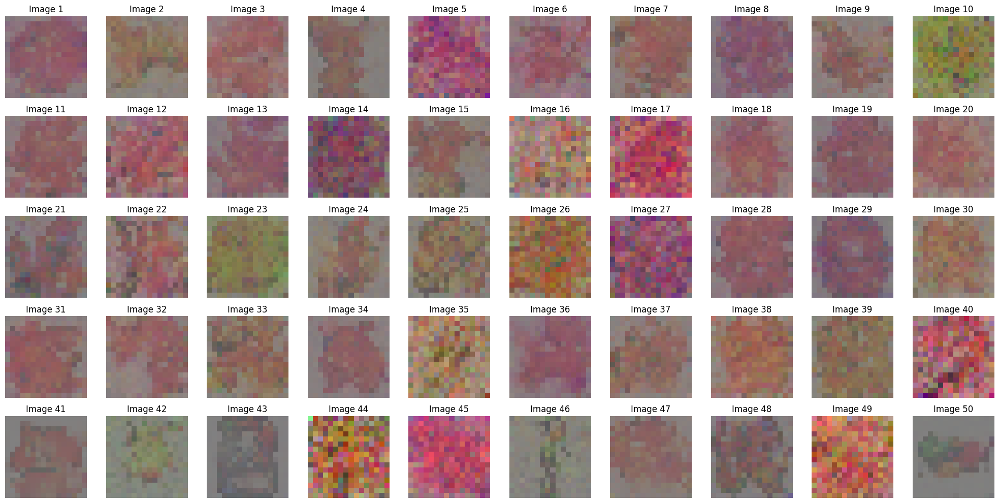

100%|██████████| 1/1 [00:00<00:00,  3.48it/s]


FID Score for DDPM at Epoch 2: 240.6580348072316


100%|██████████| 1/1 [00:00<00:00,  3.48it/s]


FID Score for DDIM at Epoch 2: 407.2824125748007

Epoch 3/40


Training: 100%|██████████| 716/716 [00:27<00:00, 25.80it/s]


Average Loss: 0.068716


DDPM Sampling: 1000it [00:06, 157.37it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 14it [00:00, 138.88it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step


DDIM Sampling: 28it [00:00, 132.86it/s]

Step 474/500: Deterministic step
Step 473/500: Deterministic step


DDIM Sampling: 42it [00:00, 135.84it/s]

Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step


DDIM Sampling: 56it [00:00, 135.88it/s]

Step 445/500: Deterministic step


DDIM Sampling: 70it [00:00, 135.73it/s]

Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step


DDIM Sampling: 84it [00:00, 136.41it/s]

Step 417/500: Deterministic step
Step 416/500: Deterministic step


DDIM Sampling: 98it [00:00, 137.46it/s]

Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step


DDIM Sampling: 113it [00:00, 138.69it/s]

Step 388/500: Deterministic step
Step 387/500: Deterministic step


DDIM Sampling: 127it [00:00, 134.79it/s]

Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step


DDIM Sampling: 141it [00:01, 135.74it/s]

Step 360/500: Deterministic step


DDIM Sampling: 155it [00:01, 135.55it/s]

Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step


DDIM Sampling: 183it [00:01, 134.11it/s]

Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step


DDIM Sampling: 213it [00:01, 136.44it/s]

Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step


DDIM Sampling: 242it [00:01, 138.34it/s]

Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step


DDIM Sampling: 270it [00:01, 134.90it/s]

Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step


DDIM Sampling: 298it [00:02, 133.99it/s]

Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step


DDIM Sampling: 327it [00:02, 136.21it/s]

Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step


DDIM Sampling: 356it [00:02, 138.56it/s]

Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step


DDIM Sampling: 385it [00:02, 139.80it/s]

Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step


DDIM Sampling: 413it [00:03, 135.46it/s]

Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step


DDIM Sampling: 441it [00:03, 134.25it/s]

Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step


DDIM Sampling: 470it [00:03, 136.79it/s]

Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step


DDIM Sampling: 500it [00:03, 136.11it/s]

Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


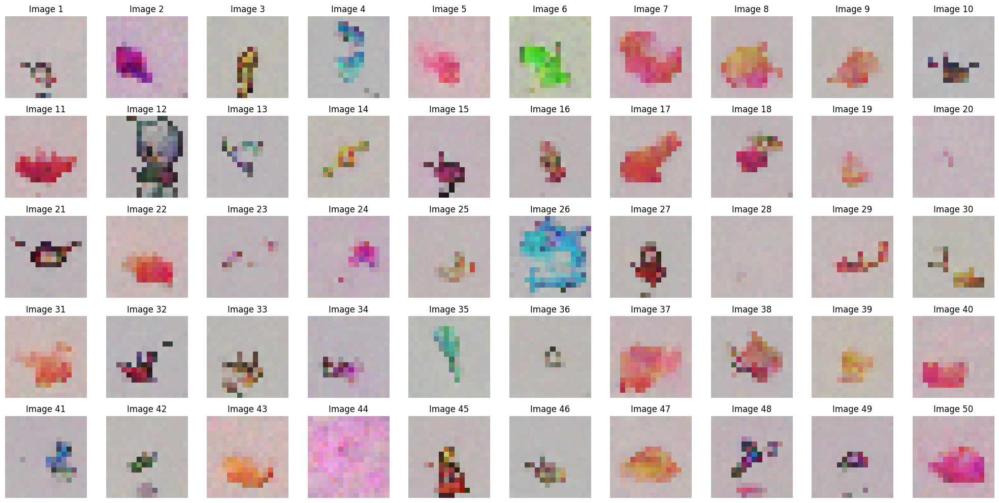

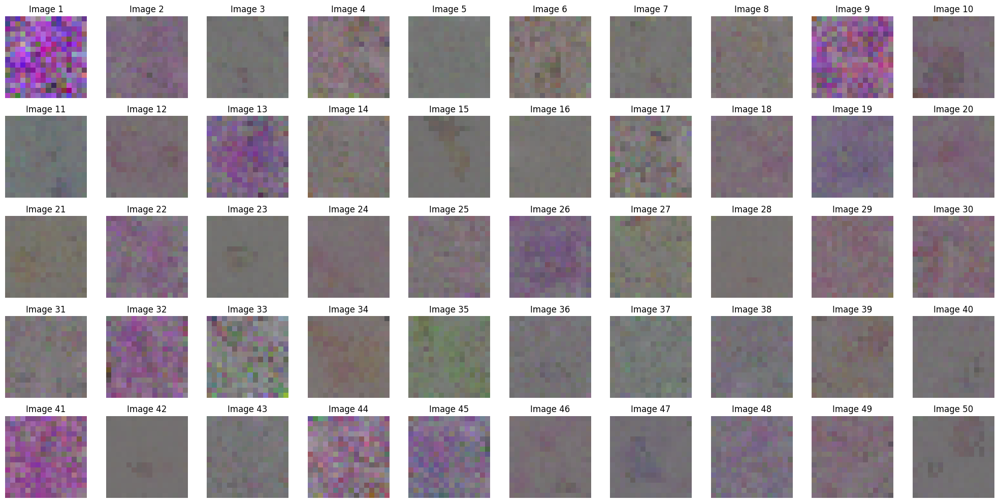

100%|██████████| 1/1 [00:00<00:00,  3.43it/s]


FID Score for DDPM at Epoch 3: 291.29619348536767


100%|██████████| 1/1 [00:00<00:00,  3.50it/s]


FID Score for DDIM at Epoch 3: 408.3795422722281

Epoch 4/40


Training: 100%|██████████| 716/716 [00:27<00:00, 25.63it/s]


Average Loss: 0.065715


DDPM Sampling: 1000it [00:06, 147.42it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 14it [00:00, 139.83it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step
Step 474/500: Deterministic step


DDIM Sampling: 28it [00:00, 137.81it/s]

Step 473/500: Deterministic step


DDIM Sampling: 42it [00:00, 136.62it/s]

Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step


DDIM Sampling: 70it [00:00, 135.64it/s]

Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step


DDIM Sampling: 84it [00:00, 136.36it/s]

Step 417/500: Deterministic step


DDIM Sampling: 98it [00:00, 135.91it/s]

Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step

DDIM Sampling: 128it [00:00, 137.26it/s]


Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step


DDIM Sampling: 156it [00:01, 134.32it/s]

Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step


DDIM Sampling: 184it [00:01, 133.53it/s]

Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step


DDIM Sampling: 213it [00:01, 136.88it/s]

Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step


DDIM Sampling: 243it [00:01, 139.39it/s]

Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step


DDIM Sampling: 271it [00:01, 137.45it/s]

Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step


DDIM Sampling: 300it [00:02, 139.51it/s]

Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step


DDIM Sampling: 328it [00:02, 137.11it/s]

Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step


DDIM Sampling: 357it [00:02, 138.20it/s]

Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step


DDIM Sampling: 385it [00:02, 137.65it/s]

Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step


DDIM Sampling: 413it [00:03, 135.92it/s]

Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step


DDIM Sampling: 441it [00:03, 136.83it/s]

Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step


DDIM Sampling: 470it [00:03, 135.13it/s]

Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step


DDIM Sampling: 500it [00:03, 136.36it/s]

Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


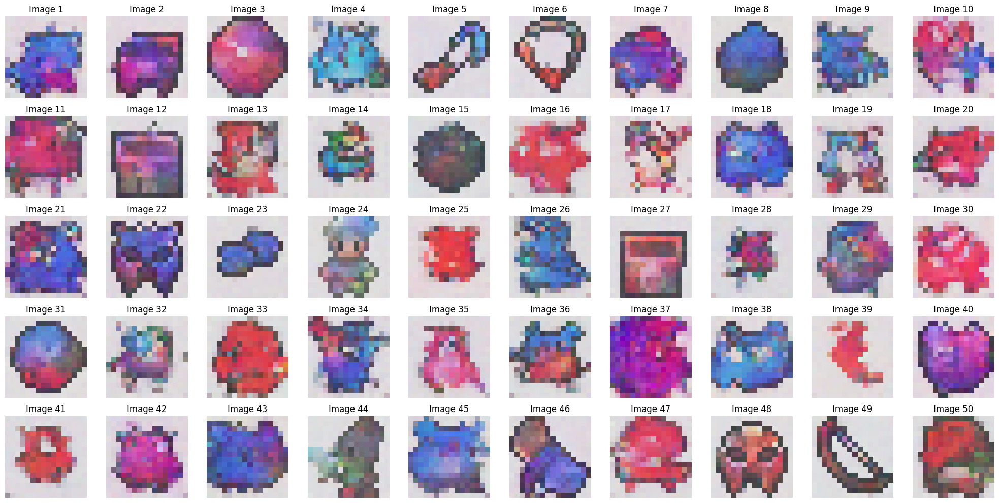

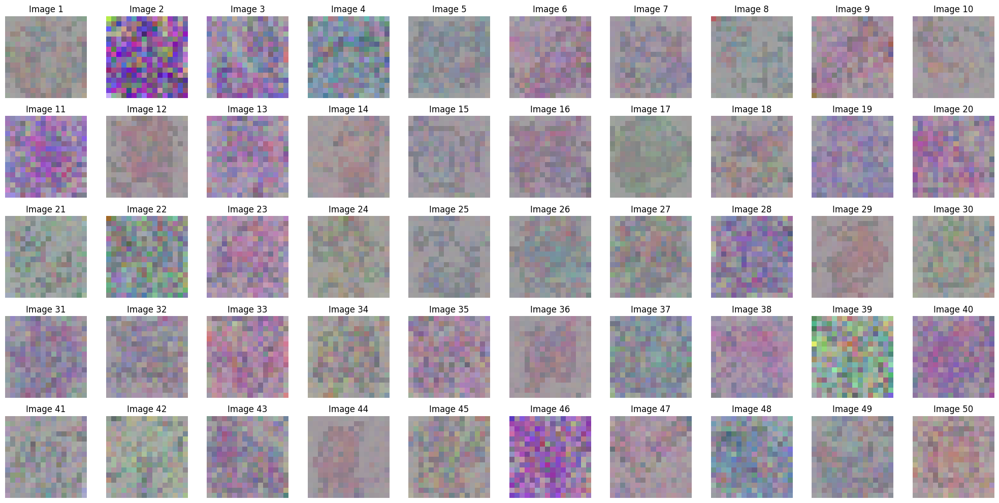

100%|██████████| 1/1 [00:00<00:00,  3.43it/s]


FID Score for DDPM at Epoch 4: 164.38633553417347


100%|██████████| 1/1 [00:00<00:00,  3.30it/s]


FID Score for DDIM at Epoch 4: 348.6420576776816

Epoch 5/40


Training: 100%|██████████| 716/716 [00:29<00:00, 24.32it/s]


Average Loss: 0.063137


DDPM Sampling: 1000it [00:06, 149.36it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 13it [00:00, 124.59it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step
Step 474/500: Deterministic step


DDIM Sampling: 42it [00:00, 134.20it/s]

Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step


DDIM Sampling: 70it [00:00, 135.77it/s]

Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step


DDIM Sampling: 84it [00:00, 135.93it/s]

Step 417/500: Deterministic step


DDIM Sampling: 98it [00:00, 136.69it/s]

Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step


DDIM Sampling: 112it [00:00, 137.23it/s]

Step 389/500: Deterministic step


DDIM Sampling: 126it [00:00, 133.85it/s]

Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step


DDIM Sampling: 154it [00:01, 132.06it/s]

Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step


DDIM Sampling: 183it [00:01, 136.23it/s]

Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step


DDIM Sampling: 212it [00:01, 137.65it/s]

Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step


DDIM Sampling: 241it [00:01, 140.11it/s]

Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step


DDIM Sampling: 270it [00:01, 136.67it/s]

Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step


DDIM Sampling: 299it [00:02, 136.44it/s]

Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step


DDIM Sampling: 328it [00:02, 136.75it/s]

Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step


DDIM Sampling: 356it [00:02, 137.09it/s]

Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step


DDIM Sampling: 385it [00:02, 138.64it/s]

Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step


DDIM Sampling: 413it [00:03, 133.14it/s]

Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step


DDIM Sampling: 442it [00:03, 132.02it/s]

Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step


DDIM Sampling: 472it [00:03, 136.55it/s]

Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step


DDIM Sampling: 500it [00:03, 135.42it/s]

Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


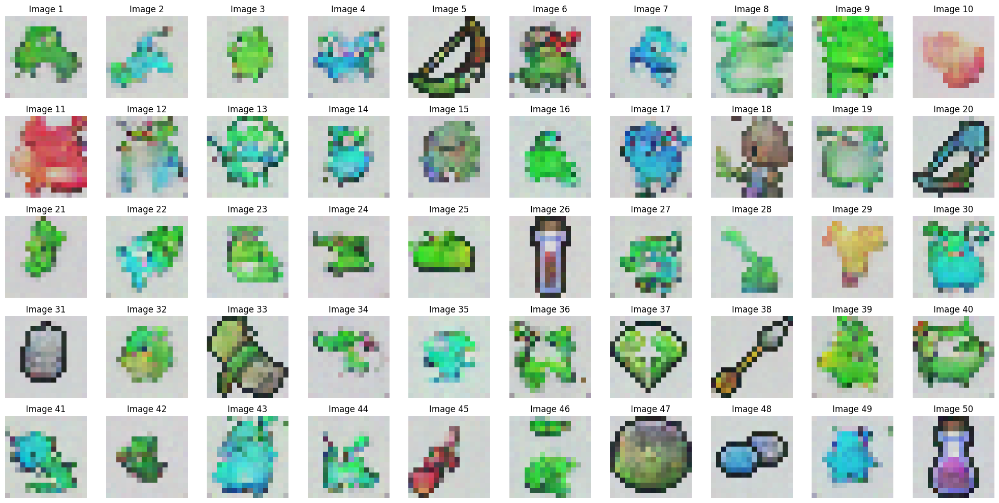

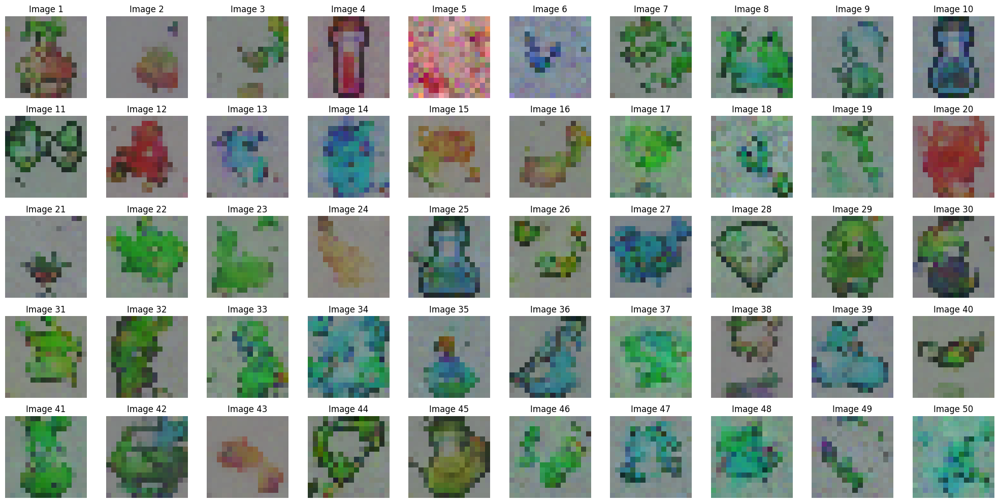

100%|██████████| 1/1 [00:00<00:00,  3.29it/s]


FID Score for DDPM at Epoch 5: 190.3007808300565


100%|██████████| 1/1 [00:00<00:00,  3.41it/s]


FID Score for DDIM at Epoch 5: 240.54095486046003

Epoch 6/40


Training: 100%|██████████| 716/716 [00:28<00:00, 25.07it/s]


Average Loss: 0.060134


DDPM Sampling: 1000it [00:06, 145.93it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 12it [00:00, 112.63it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step


DDIM Sampling: 40it [00:00, 125.55it/s]

Step 474/500: Deterministic step
Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step


DDIM Sampling: 68it [00:00, 131.65it/s]

Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step


DDIM Sampling: 95it [00:00, 128.77it/s]

Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step


DDIM Sampling: 108it [00:00, 128.38it/s]

Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step


DDIM Sampling: 121it [00:00, 128.66it/s]

Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step


DDIM Sampling: 134it [00:01, 128.60it/s]

Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step

DDIM Sampling: 147it [00:01, 123.05it/s]


Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step

DDIM Sampling: 174it [00:01, 124.64it/s]


Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step

DDIM Sampling: 201it [00:01, 129.40it/s]


Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step


DDIM Sampling: 228it [00:01, 129.43it/s]

Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step


DDIM Sampling: 257it [00:02, 134.08it/s]

Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step


DDIM Sampling: 285it [00:02, 132.13it/s]

Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step


DDIM Sampling: 314it [00:02, 132.73it/s]

Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step


DDIM Sampling: 342it [00:02, 134.31it/s]

Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step


DDIM Sampling: 371it [00:02, 137.37it/s]

Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step


DDIM Sampling: 400it [00:03, 138.25it/s]

Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step


DDIM Sampling: 428it [00:03, 134.56it/s]

Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step


DDIM Sampling: 456it [00:03, 134.78it/s]

Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step


DDIM Sampling: 485it [00:03, 136.94it/s]

Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step


DDIM Sampling: 500it [00:03, 131.43it/s]


Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


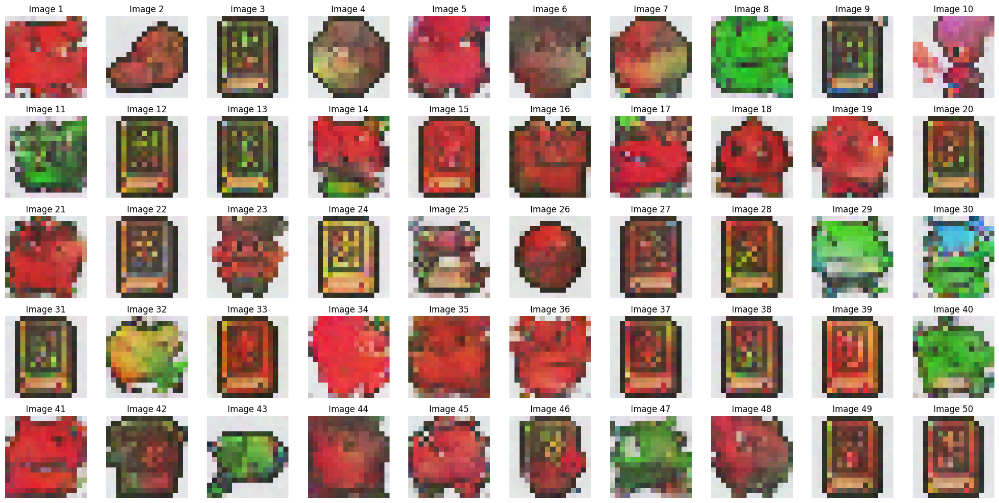

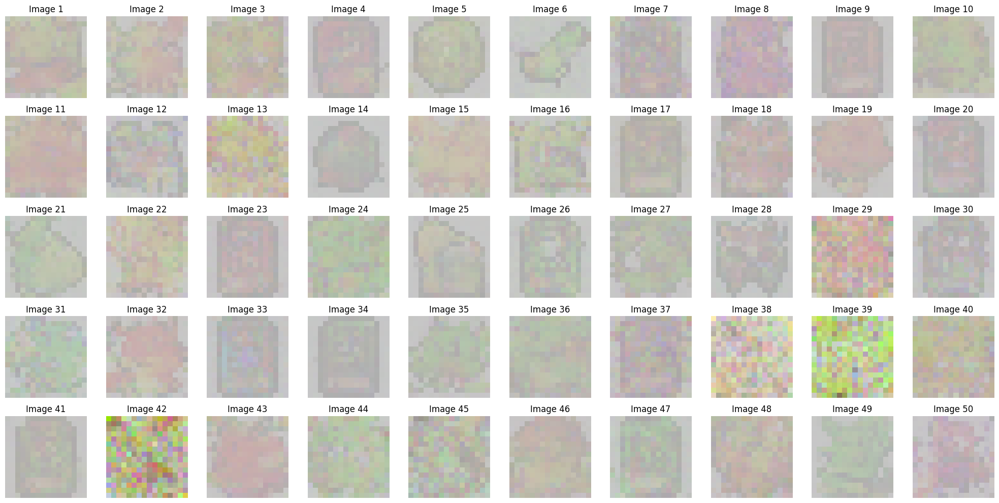

100%|██████████| 1/1 [00:00<00:00,  3.26it/s]


FID Score for DDPM at Epoch 6: 197.85648003395053


100%|██████████| 1/1 [00:00<00:00,  3.30it/s]


FID Score for DDIM at Epoch 6: 245.69150381840993

Epoch 7/40


Training: 100%|██████████| 716/716 [00:29<00:00, 24.56it/s]


Average Loss: 0.059163


DDPM Sampling: 1000it [00:06, 145.03it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 13it [00:00, 124.48it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step


DDIM Sampling: 26it [00:00, 126.84it/s]

Step 475/500: Deterministic step


DDIM Sampling: 40it [00:00, 129.93it/s]

Step 474/500: Deterministic step
Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step

DDIM Sampling: 69it [00:00, 128.34it/s]


Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step


DDIM Sampling: 96it [00:00, 128.81it/s]

Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step

DDIM Sampling: 123it [00:00, 131.94it/s]


Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step


DDIM Sampling: 151it [00:01, 132.45it/s]

Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step


DDIM Sampling: 180it [00:01, 136.54it/s]

Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step


DDIM Sampling: 208it [00:01, 128.00it/s]

Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step


DDIM Sampling: 236it [00:01, 131.60it/s]

Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step

DDIM Sampling: 265it [00:02, 131.95it/s]


Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step


DDIM Sampling: 293it [00:02, 133.20it/s]

Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step


DDIM Sampling: 322it [00:02, 135.31it/s]

Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step


DDIM Sampling: 351it [00:02, 132.99it/s]

Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step


DDIM Sampling: 379it [00:02, 133.95it/s]

Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step


DDIM Sampling: 407it [00:03, 135.60it/s]

Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step

DDIM Sampling: 435it [00:03, 135.24it/s]


Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step


DDIM Sampling: 463it [00:03, 135.36it/s]

Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step


DDIM Sampling: 477it [00:03, 127.63it/s]

Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step


DDIM Sampling: 500it [00:03, 131.63it/s]


Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


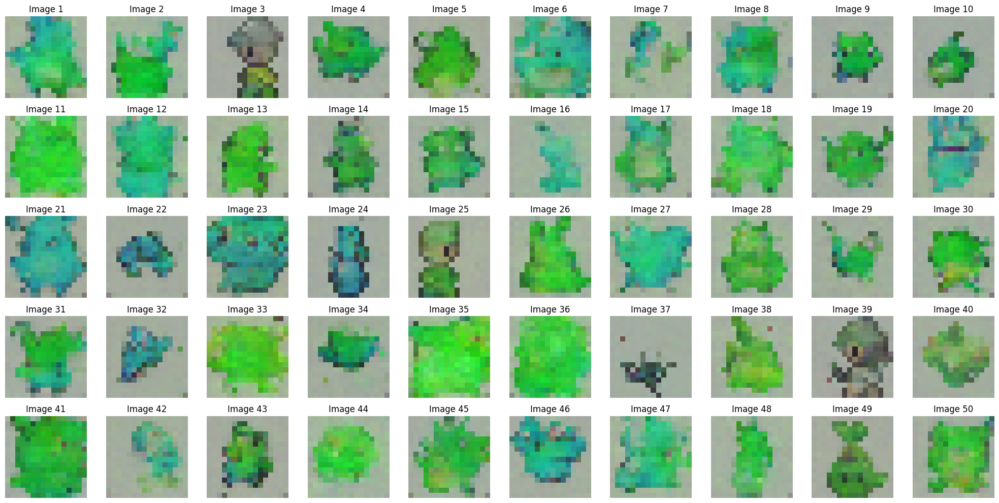

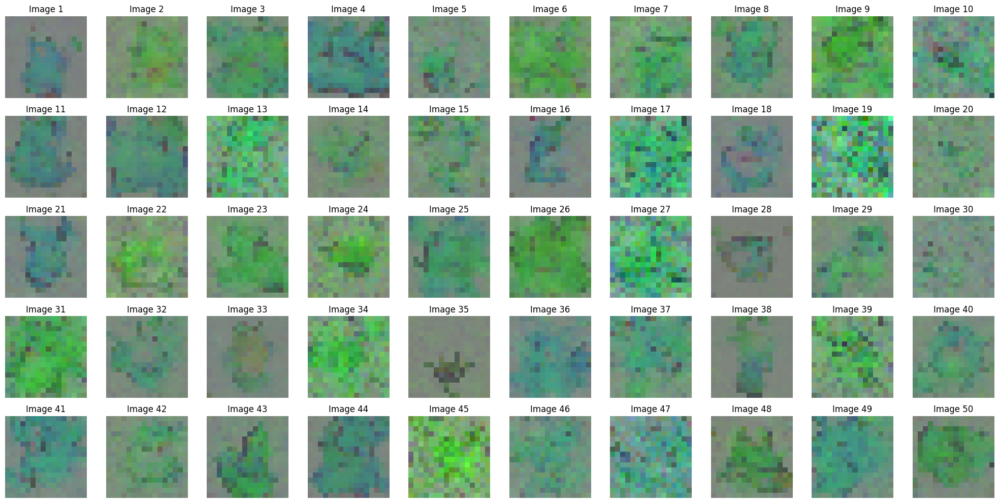

100%|██████████| 1/1 [00:00<00:00,  2.78it/s]


FID Score for DDPM at Epoch 7: 251.21648641036273


100%|██████████| 1/1 [00:00<00:00,  3.20it/s]


FID Score for DDIM at Epoch 7: 433.57925160043555

Epoch 8/40


Training: 100%|██████████| 716/716 [00:29<00:00, 24.46it/s]


Average Loss: 0.056616


DDPM Sampling: 1000it [00:06, 152.80it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 10it [00:00, 99.49it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step


DDIM Sampling: 21it [00:00, 104.24it/s]

Step 480/500: Deterministic step


DDIM Sampling: 34it [00:00, 115.31it/s]

Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step
Step 474/500: Deterministic step
Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step

DDIM Sampling: 47it [00:00, 116.96it/s]


Step 454/500: Deterministic step


DDIM Sampling: 60it [00:00, 119.72it/s]

Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step


DDIM Sampling: 73it [00:00, 121.71it/s]

Step 429/500: Deterministic step
Step 428/500: Deterministic step


DDIM Sampling: 86it [00:00, 115.34it/s]

Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step


DDIM Sampling: 112it [00:00, 121.58it/s]

Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step


DDIM Sampling: 139it [00:01, 124.15it/s]

Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step


DDIM Sampling: 164it [00:01, 115.62it/s]

Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step


DDIM Sampling: 176it [00:01, 110.99it/s]

Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step


DDIM Sampling: 188it [00:01, 108.12it/s]

Step 313/500: Deterministic step
Step 312/500: Deterministic step


DDIM Sampling: 199it [00:01, 100.41it/s]

Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step

DDIM Sampling: 222it [00:01, 104.71it/s]


Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step


DDIM Sampling: 244it [00:02, 101.77it/s]

Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step


DDIM Sampling: 266it [00:02, 103.14it/s]

Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step


DDIM Sampling: 287it [00:02, 98.01it/s]

Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step

DDIM Sampling: 297it [00:02, 95.17it/s]


Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step

DDIM Sampling: 307it [00:02, 95.76it/s]


Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step


DDIM Sampling: 319it [00:02, 99.87it/s]

Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step


DDIM Sampling: 330it [00:03, 100.31it/s]

Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step


DDIM Sampling: 341it [00:03, 101.91it/s]

Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step


DDIM Sampling: 355it [00:03, 110.91it/s]

Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step


DDIM Sampling: 369it [00:03, 118.34it/s]

Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step


DDIM Sampling: 383it [00:03, 122.40it/s]

Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step


DDIM Sampling: 397it [00:03, 126.23it/s]

Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step


DDIM Sampling: 410it [00:03, 125.49it/s]

Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step


DDIM Sampling: 423it [00:03, 126.13it/s]

Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step


DDIM Sampling: 436it [00:03, 127.17it/s]

Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step


DDIM Sampling: 450it [00:04, 129.40it/s]

Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step


DDIM Sampling: 464it [00:04, 130.81it/s]

Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step


DDIM Sampling: 478it [00:04, 131.68it/s]

Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step


DDIM Sampling: 492it [00:04, 132.42it/s]

Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step


DDIM Sampling: 500it [00:04, 114.00it/s]


Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


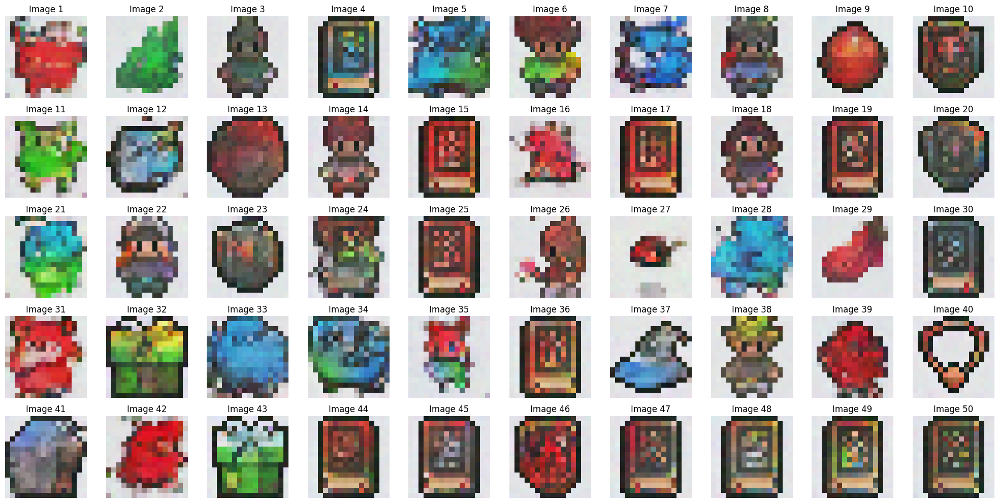

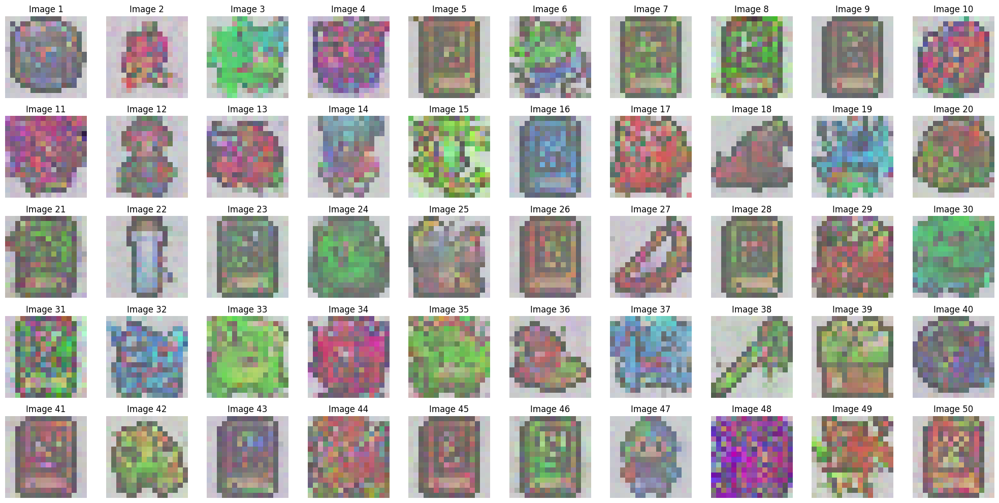

100%|██████████| 1/1 [00:00<00:00,  3.18it/s]


FID Score for DDPM at Epoch 8: 142.458536727171


100%|██████████| 1/1 [00:00<00:00,  3.00it/s]


FID Score for DDIM at Epoch 8: 194.20453875845465

Epoch 9/40


Training: 100%|██████████| 716/716 [00:29<00:00, 24.51it/s]


Average Loss: 0.055062


DDPM Sampling: 1000it [00:06, 154.83it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 13it [00:00, 122.08it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step


DDIM Sampling: 40it [00:00, 127.58it/s]

Step 475/500: Deterministic step
Step 474/500: Deterministic step
Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step


DDIM Sampling: 68it [00:00, 131.42it/s]

Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step


DDIM Sampling: 96it [00:00, 133.45it/s]

Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step


DDIM Sampling: 124it [00:00, 135.09it/s]

Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step


DDIM Sampling: 152it [00:01, 126.94it/s]

Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step


DDIM Sampling: 179it [00:01, 128.43it/s]

Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step


DDIM Sampling: 208it [00:01, 133.74it/s]

Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step


DDIM Sampling: 237it [00:01, 136.12it/s]

Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step


DDIM Sampling: 265it [00:02, 133.62it/s]

Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step


DDIM Sampling: 279it [00:02, 116.44it/s]

Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step


DDIM Sampling: 304it [00:02, 112.48it/s]

Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step


DDIM Sampling: 329it [00:02, 116.91it/s]

Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step


DDIM Sampling: 355it [00:02, 121.06it/s]

Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step


DDIM Sampling: 381it [00:03, 122.63it/s]

Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step


DDIM Sampling: 408it [00:03, 120.22it/s]

Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step


DDIM Sampling: 435it [00:03, 119.78it/s]

Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step


DDIM Sampling: 463it [00:03, 126.52it/s]

Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step


DDIM Sampling: 489it [00:03, 124.40it/s]

Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step


DDIM Sampling: 500it [00:04, 124.91it/s]


Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


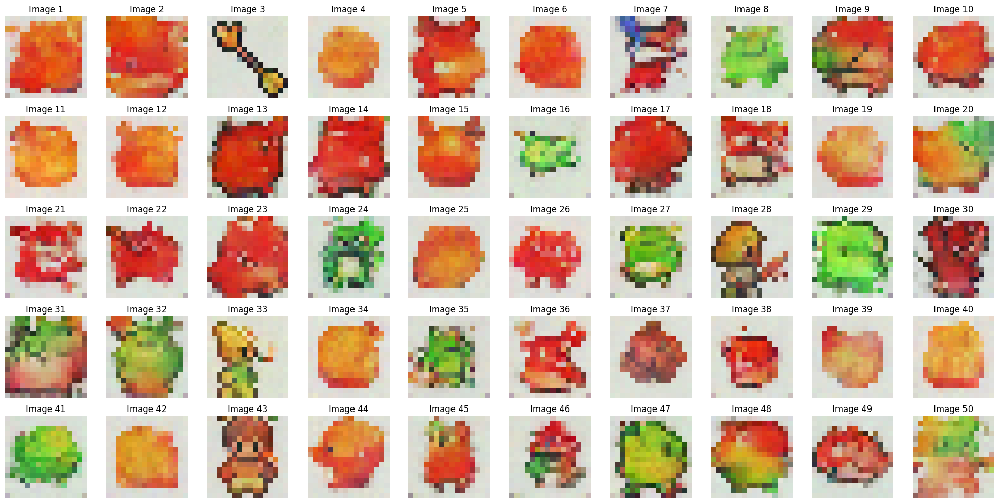

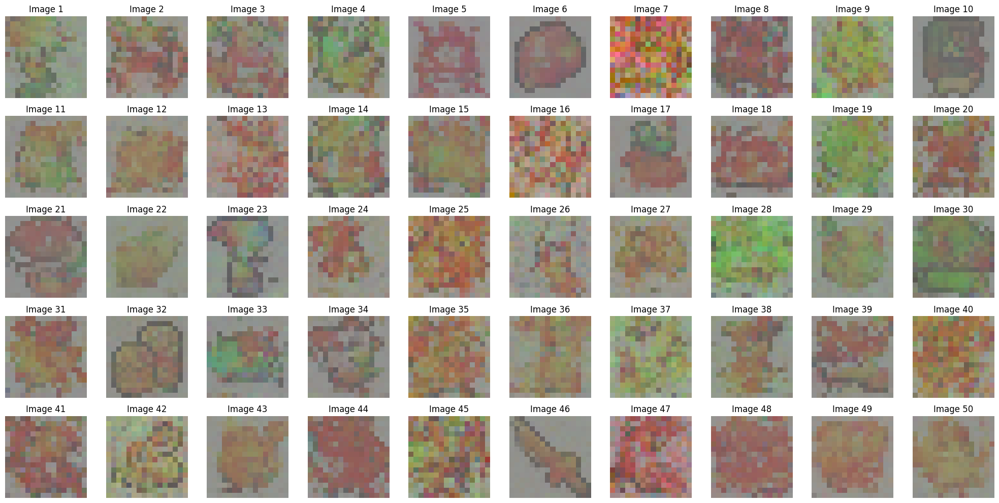

100%|██████████| 1/1 [00:00<00:00,  3.04it/s]


FID Score for DDPM at Epoch 9: 217.039407617361


100%|██████████| 1/1 [00:00<00:00,  3.04it/s]


FID Score for DDIM at Epoch 9: 316.2858187102514

Epoch 10/40


Training: 100%|██████████| 716/716 [00:30<00:00, 23.71it/s]


Average Loss: 0.054771


DDPM Sampling: 1000it [00:06, 153.66it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 13it [00:00, 129.84it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step


DDIM Sampling: 27it [00:00, 133.25it/s]

Step 475/500: Deterministic step
Step 474/500: Deterministic step


DDIM Sampling: 41it [00:00, 122.77it/s]

Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step


DDIM Sampling: 69it [00:00, 128.76it/s]

Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step


DDIM Sampling: 96it [00:00, 131.54it/s]

Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step


DDIM Sampling: 124it [00:00, 132.43it/s]

Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step


DDIM Sampling: 152it [00:01, 128.89it/s]

Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step


DDIM Sampling: 178it [00:01, 126.62it/s]

Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step


DDIM Sampling: 205it [00:01, 129.18it/s]

Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step


DDIM Sampling: 232it [00:01, 131.53it/s]

Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step


DDIM Sampling: 260it [00:02, 129.96it/s]

Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step


DDIM Sampling: 289it [00:02, 132.00it/s]

Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step


DDIM Sampling: 317it [00:02, 129.99it/s]

Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step


DDIM Sampling: 331it [00:02, 127.71it/s]

Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step


DDIM Sampling: 345it [00:02, 129.59it/s]

Step 156/500: Deterministic step


DDIM Sampling: 358it [00:02, 129.13it/s]

Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step


DDIM Sampling: 372it [00:02, 132.25it/s]

Step 129/500: Deterministic step


DDIM Sampling: 386it [00:02, 128.68it/s]

Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step


DDIM Sampling: 413it [00:03, 129.68it/s]

Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step

DDIM Sampling: 441it [00:03, 127.50it/s]


Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step


DDIM Sampling: 468it [00:03, 127.29it/s]

Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step


DDIM Sampling: 493it [00:03, 109.50it/s]

Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step


DDIM Sampling: 500it [00:03, 125.42it/s]


Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


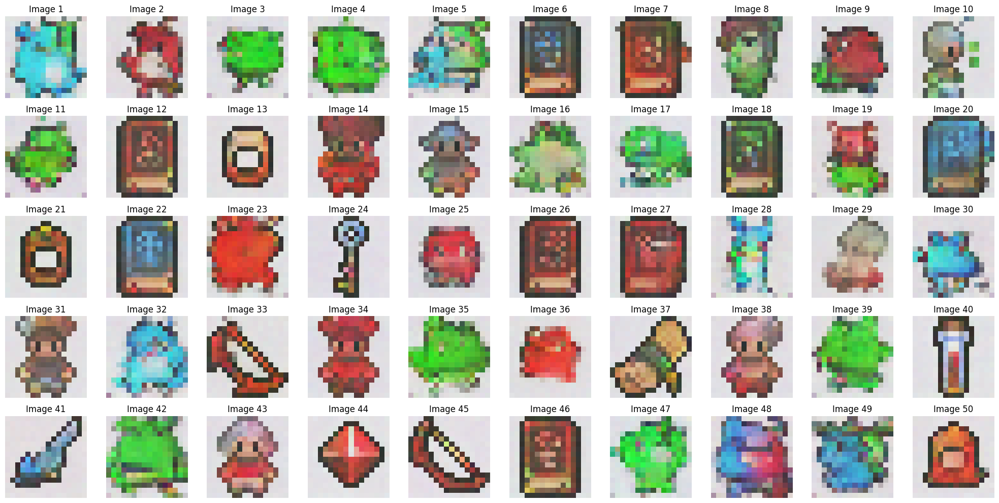

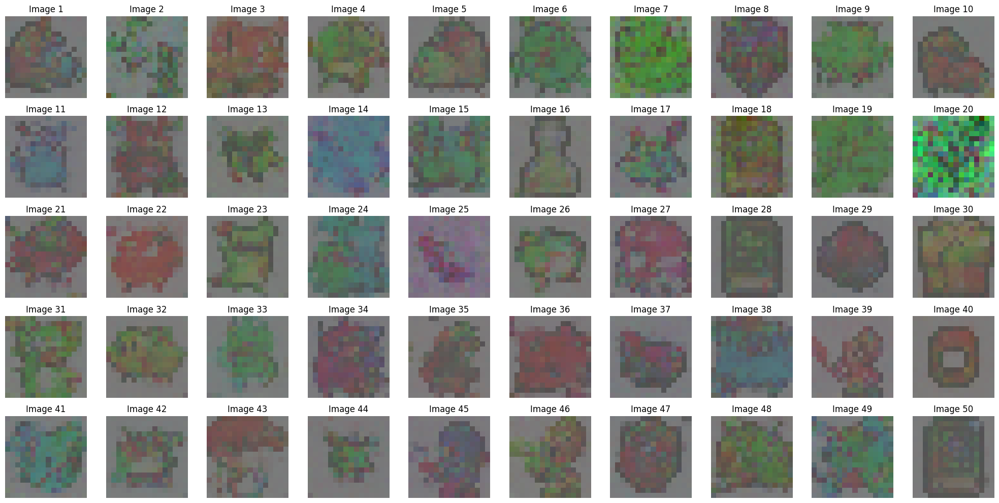

100%|██████████| 1/1 [00:00<00:00,  3.06it/s]


FID Score for DDPM at Epoch 10: 139.64121155967075


100%|██████████| 1/1 [00:00<00:00,  3.13it/s]


FID Score for DDIM at Epoch 10: 199.80793335814963

Epoch 11/40


Training: 100%|██████████| 716/716 [00:30<00:00, 23.67it/s]


Average Loss: 0.052895


DDPM Sampling: 1000it [00:06, 148.22it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 13it [00:00, 129.36it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step


DDIM Sampling: 26it [00:00, 129.48it/s]

Step 475/500: Deterministic step


DDIM Sampling: 39it [00:00, 128.71it/s]

Step 474/500: Deterministic step
Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step


DDIM Sampling: 52it [00:00, 126.52it/s]

Step 449/500: Deterministic step


DDIM Sampling: 66it [00:00, 128.91it/s]

Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step


DDIM Sampling: 94it [00:00, 129.55it/s]

Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step


DDIM Sampling: 122it [00:00, 130.67it/s]

Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step


DDIM Sampling: 149it [00:01, 127.83it/s]

Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step


DDIM Sampling: 176it [00:01, 128.96it/s]

Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step


DDIM Sampling: 203it [00:01, 131.05it/s]

Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step


DDIM Sampling: 231it [00:01, 133.19it/s]

Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step


DDIM Sampling: 259it [00:01, 131.88it/s]

Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step


DDIM Sampling: 287it [00:02, 131.57it/s]

Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step


DDIM Sampling: 315it [00:02, 130.30it/s]

Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step


DDIM Sampling: 344it [00:02, 133.90it/s]

Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step


DDIM Sampling: 372it [00:02, 134.87it/s]

Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step


DDIM Sampling: 400it [00:03, 133.20it/s]

Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step


DDIM Sampling: 429it [00:03, 132.94it/s]

Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step


DDIM Sampling: 457it [00:03, 132.14it/s]

Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step


DDIM Sampling: 485it [00:03, 133.62it/s]

Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step


DDIM Sampling: 500it [00:03, 131.05it/s]


Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


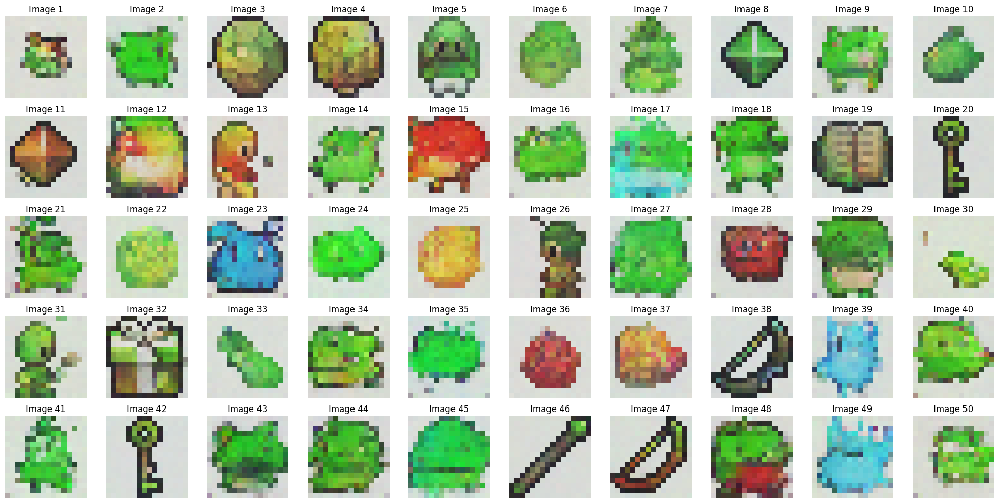

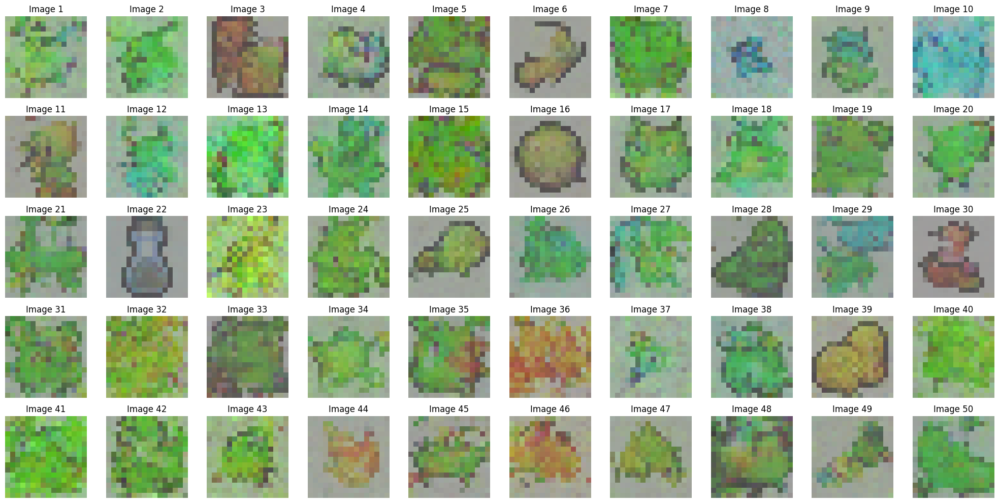

100%|██████████| 1/1 [00:00<00:00,  3.00it/s]


FID Score for DDPM at Epoch 11: 167.84650196513726


100%|██████████| 1/1 [00:00<00:00,  3.18it/s]


FID Score for DDIM at Epoch 11: 291.4239398789727

Epoch 12/40


Training: 100%|██████████| 716/716 [00:30<00:00, 23.47it/s]


Average Loss: 0.050995


DDPM Sampling: 1000it [00:07, 142.82it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 14it [00:00, 130.86it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step


DDIM Sampling: 42it [00:00, 128.53it/s]

Step 474/500: Deterministic step
Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step


DDIM Sampling: 68it [00:00, 120.50it/s]

Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step


DDIM Sampling: 95it [00:00, 125.60it/s]

Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step


DDIM Sampling: 122it [00:00, 128.08it/s]

Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step


DDIM Sampling: 149it [00:01, 129.28it/s]

Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step


DDIM Sampling: 175it [00:01, 127.17it/s]

Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step

DDIM Sampling: 202it [00:01, 125.60it/s]


Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step


DDIM Sampling: 229it [00:01, 126.68it/s]

Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step


DDIM Sampling: 256it [00:02, 130.68it/s]

Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step


DDIM Sampling: 270it [00:02, 127.93it/s]

Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step


DDIM Sampling: 284it [00:02, 129.47it/s]

Step 217/500: Deterministic step


DDIM Sampling: 297it [00:02, 126.36it/s]

Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step


DDIM Sampling: 323it [00:02, 122.19it/s]

Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step


DDIM Sampling: 351it [00:02, 126.51it/s]

Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step


DDIM Sampling: 379it [00:02, 130.27it/s]

Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step


DDIM Sampling: 407it [00:03, 131.25it/s]

Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step


DDIM Sampling: 434it [00:03, 128.35it/s]

Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step


DDIM Sampling: 460it [00:03, 125.60it/s]

Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step


DDIM Sampling: 487it [00:03, 129.21it/s]

Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step


DDIM Sampling: 500it [00:03, 126.86it/s]


Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


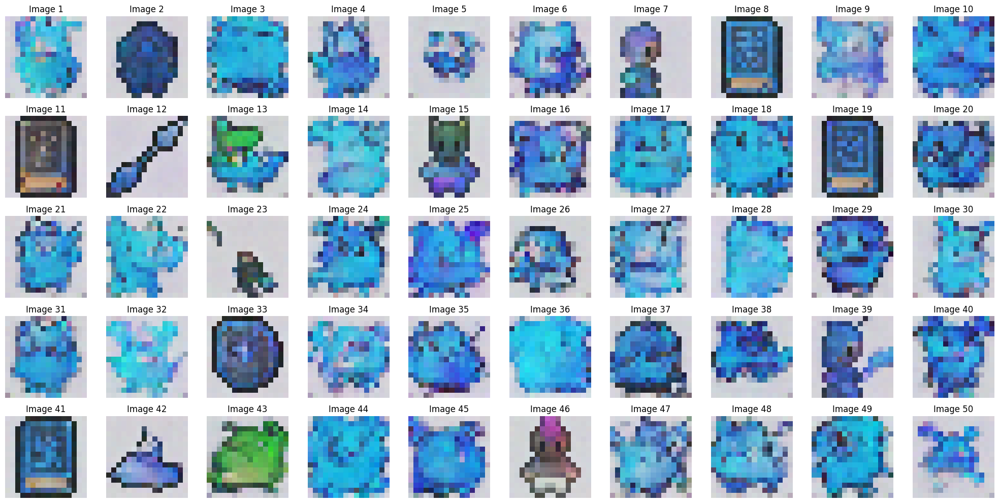

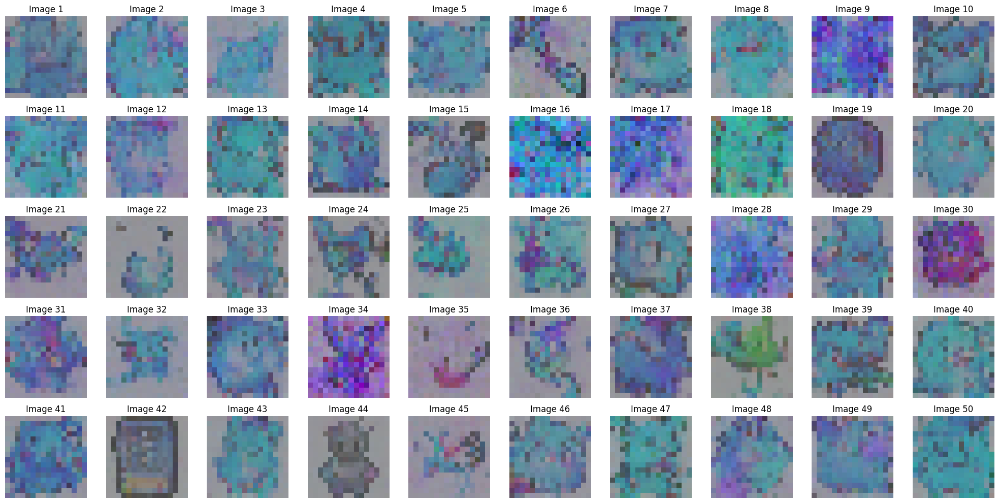

100%|██████████| 1/1 [00:00<00:00,  3.11it/s]


FID Score for DDPM at Epoch 12: 199.11241422732022


100%|██████████| 1/1 [00:00<00:00,  3.04it/s]


FID Score for DDIM at Epoch 12: 287.2517760903651

Epoch 13/40


Training: 100%|██████████| 716/716 [00:30<00:00, 23.39it/s]


Average Loss: 0.050450


DDPM Sampling: 1000it [00:07, 140.63it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 13it [00:00, 128.51it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step

DDIM Sampling: 26it [00:00, 125.56it/s]


Step 475/500: Deterministic step


DDIM Sampling: 39it [00:00, 127.32it/s]

Step 474/500: Deterministic step
Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step


DDIM Sampling: 52it [00:00, 123.47it/s]

Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step


DDIM Sampling: 65it [00:00, 125.45it/s]

Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step


DDIM Sampling: 78it [00:00, 124.93it/s]

Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step


DDIM Sampling: 91it [00:00, 126.16it/s]

Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step

DDIM Sampling: 104it [00:00, 126.99it/s]


Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step


DDIM Sampling: 117it [00:00, 121.84it/s]

Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step


DDIM Sampling: 130it [00:01, 123.47it/s]

Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step


DDIM Sampling: 143it [00:01, 122.33it/s]

Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step


DDIM Sampling: 170it [00:01, 119.05it/s]

Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step


DDIM Sampling: 197it [00:01, 124.43it/s]

Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step


DDIM Sampling: 224it [00:01, 126.22it/s]

Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step

DDIM Sampling: 250it [00:02, 122.95it/s]


Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step


DDIM Sampling: 263it [00:02, 120.19it/s]

Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step


DDIM Sampling: 277it [00:02, 123.83it/s]

Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step


DDIM Sampling: 290it [00:02, 118.77it/s]

Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step


DDIM Sampling: 303it [00:02, 121.08it/s]

Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step


DDIM Sampling: 317it [00:02, 124.28it/s]

Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step


DDIM Sampling: 331it [00:02, 126.97it/s]

Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step


DDIM Sampling: 344it [00:02, 126.29it/s]

Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step


DDIM Sampling: 358it [00:02, 128.59it/s]

Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step

DDIM Sampling: 371it [00:03, 122.81it/s]


Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step


DDIM Sampling: 398it [00:03, 125.22it/s]

Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step


DDIM Sampling: 424it [00:03, 123.50it/s]

Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step


DDIM Sampling: 451it [00:03, 126.23it/s]

Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step


DDIM Sampling: 478it [00:03, 128.85it/s]

Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step


DDIM Sampling: 500it [00:04, 123.94it/s]


Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


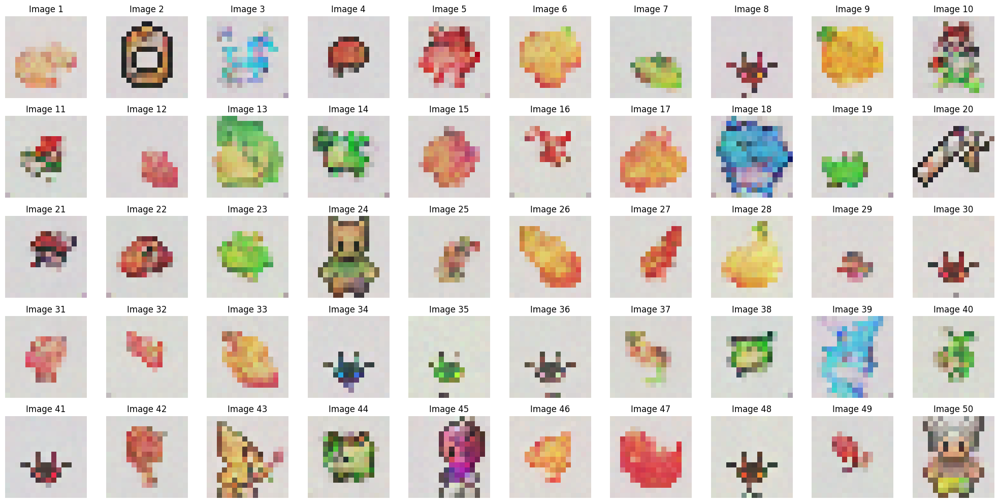

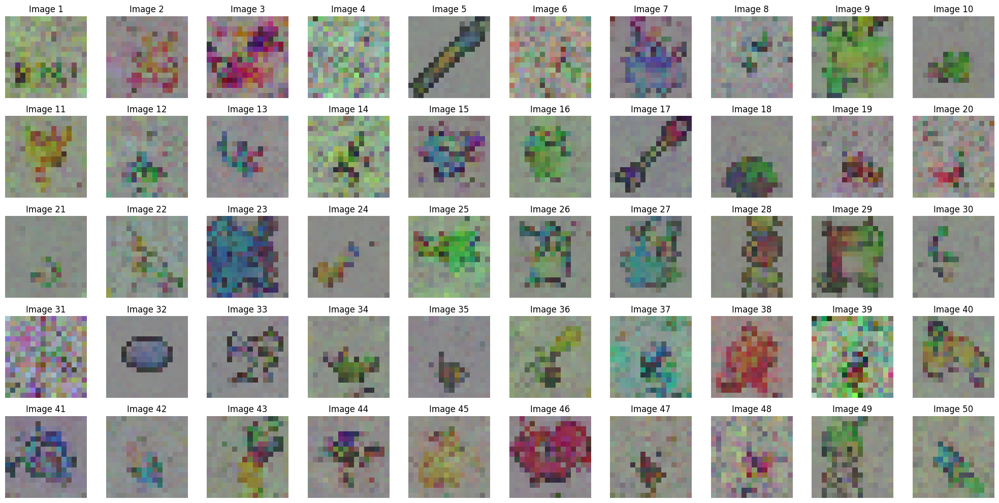

100%|██████████| 1/1 [00:00<00:00,  3.05it/s]


FID Score for DDPM at Epoch 13: 200.3225797272733


100%|██████████| 1/1 [00:00<00:00,  3.02it/s]


FID Score for DDIM at Epoch 13: 323.6316277320026

Epoch 14/40


Training: 100%|██████████| 716/716 [00:30<00:00, 23.23it/s]


Average Loss: 0.049207


DDPM Sampling: 1000it [00:07, 138.17it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 12it [00:00, 115.56it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step


DDIM Sampling: 35it [00:00, 97.91it/s] 

Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step
Step 474/500: Deterministic step
Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step


DDIM Sampling: 60it [00:00, 112.68it/s]

Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step


DDIM Sampling: 85it [00:00, 118.97it/s]

Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step


DDIM Sampling: 111it [00:00, 120.39it/s]

Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step

DDIM Sampling: 138it [00:01, 123.40it/s]


Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step


DDIM Sampling: 164it [00:01, 124.60it/s]

Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step


DDIM Sampling: 191it [00:01, 126.39it/s]

Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step


DDIM Sampling: 218it [00:01, 125.47it/s]

Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step


DDIM Sampling: 245it [00:02, 126.41it/s]

Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step


DDIM Sampling: 271it [00:02, 127.53it/s]

Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step


DDIM Sampling: 297it [00:02, 126.45it/s]

Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step


DDIM Sampling: 310it [00:02, 125.21it/s]

Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step


DDIM Sampling: 323it [00:02, 123.96it/s]

Step 177/500: Deterministic step
Step 176/500: Deterministic step


DDIM Sampling: 336it [00:02, 119.37it/s]

Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step


DDIM Sampling: 348it [00:02, 117.88it/s]

Step 154/500: Deterministic step
Step 153/500: Deterministic step


DDIM Sampling: 360it [00:02, 117.07it/s]

Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step


DDIM Sampling: 373it [00:03, 119.72it/s]

Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step


DDIM Sampling: 386it [00:03, 122.32it/s]

Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step


DDIM Sampling: 400it [00:03, 125.03it/s]

Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step


DDIM Sampling: 413it [00:03, 125.71it/s]

Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step


DDIM Sampling: 426it [00:03, 125.28it/s]

Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step


DDIM Sampling: 440it [00:03, 126.61it/s]

Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step

DDIM Sampling: 466it [00:03, 123.67it/s]


Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step


DDIM Sampling: 492it [00:04, 120.26it/s]

Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step


DDIM Sampling: 500it [00:04, 121.49it/s]

Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


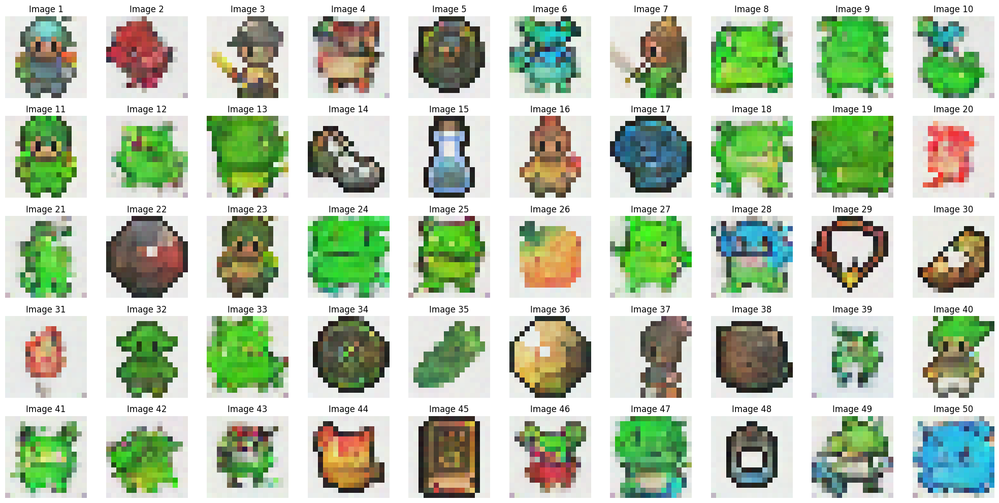

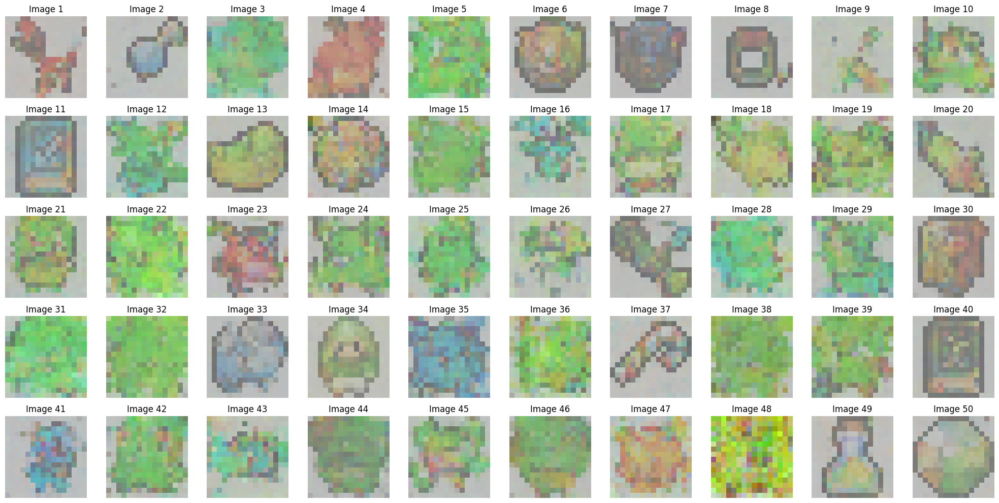

100%|██████████| 1/1 [00:00<00:00,  3.07it/s]


FID Score for DDPM at Epoch 14: 153.16537899988015


100%|██████████| 1/1 [00:00<00:00,  3.10it/s]


FID Score for DDIM at Epoch 14: 226.82504918583757

Epoch 15/40


Training: 100%|██████████| 716/716 [00:31<00:00, 22.70it/s]


Average Loss: 0.048027


DDPM Sampling: 1000it [00:06, 148.48it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 14it [00:00, 134.32it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step


DDIM Sampling: 41it [00:00, 121.69it/s]

Step 474/500: Deterministic step
Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step


DDIM Sampling: 67it [00:00, 112.52it/s]

Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step


DDIM Sampling: 90it [00:00, 103.23it/s]

Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step


DDIM Sampling: 101it [00:00, 98.12it/s]

Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step


DDIM Sampling: 122it [00:01, 97.51it/s]

Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step


DDIM Sampling: 142it [00:01, 96.86it/s]

Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step


DDIM Sampling: 163it [00:01, 96.31it/s]

Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step


DDIM Sampling: 185it [00:01, 100.44it/s]

Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step


DDIM Sampling: 207it [00:02, 104.30it/s]

Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step


DDIM Sampling: 230it [00:02, 103.75it/s]

Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step


DDIM Sampling: 252it [00:02, 103.65it/s]

Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step


DDIM Sampling: 274it [00:02, 105.51it/s]

Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step


DDIM Sampling: 296it [00:02, 105.66it/s]

Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step


DDIM Sampling: 307it [00:02, 100.93it/s]

Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step


DDIM Sampling: 318it [00:03, 93.45it/s] 

Step 184/500: Deterministic step
Step 183/500: Deterministic step


DDIM Sampling: 331it [00:03, 103.08it/s]

Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step


DDIM Sampling: 344it [00:03, 109.65it/s]

Step 157/500: Deterministic step


DDIM Sampling: 358it [00:03, 116.14it/s]

Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step

DDIM Sampling: 371it [00:03, 118.72it/s]


Step 130/500: Deterministic step


DDIM Sampling: 384it [00:03, 121.65it/s]

Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step


DDIM Sampling: 410it [00:03, 117.95it/s]

Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step


DDIM Sampling: 434it [00:04, 112.36it/s]

Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step


DDIM Sampling: 460it [00:04, 118.37it/s]

Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step


DDIM Sampling: 486it [00:04, 123.34it/s]

Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step

DDIM Sampling: 500it [00:04, 108.30it/s]



Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


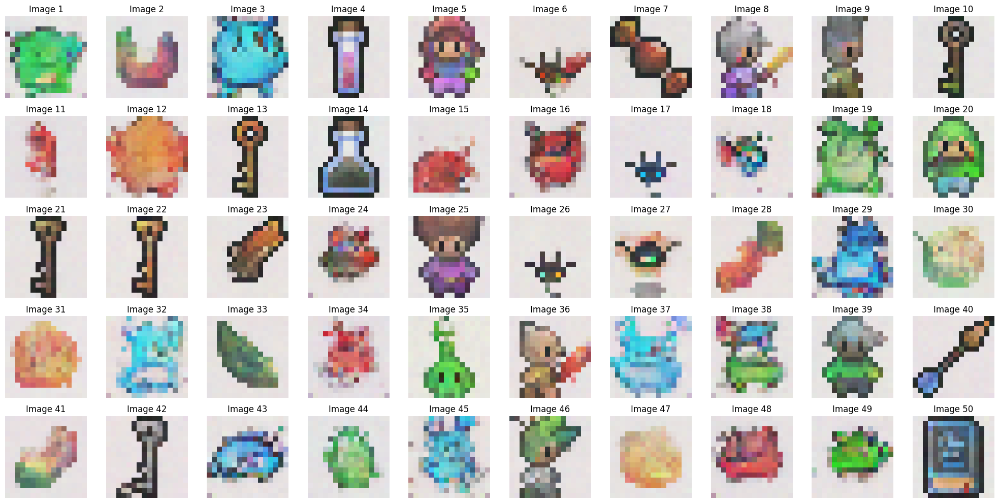

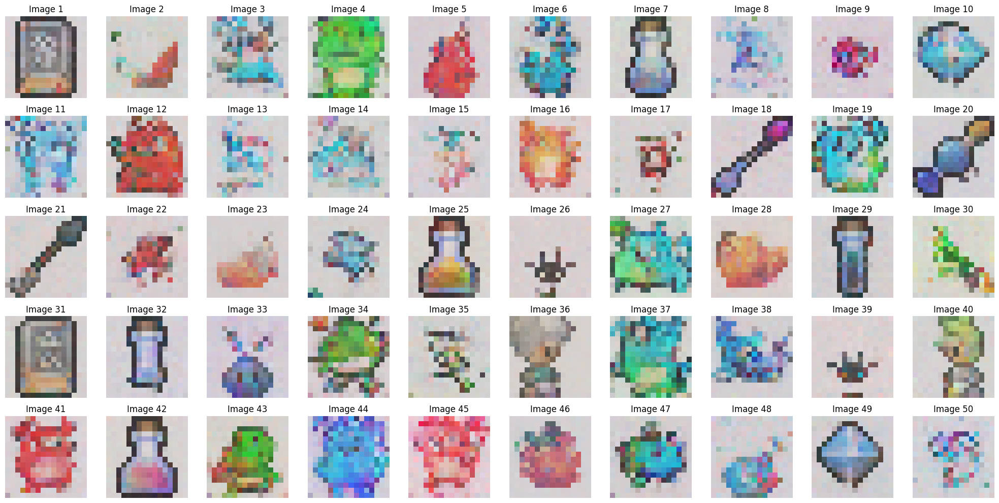

100%|██████████| 1/1 [00:00<00:00,  3.13it/s]


FID Score for DDPM at Epoch 15: 156.57701345474067


100%|██████████| 1/1 [00:00<00:00,  3.01it/s]


FID Score for DDIM at Epoch 15: 201.06970015365877

Epoch 16/40


Training: 100%|██████████| 716/716 [00:31<00:00, 22.75it/s]


Average Loss: 0.047206


DDPM Sampling: 1000it [00:06, 152.52it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 12it [00:00, 119.01it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step

DDIM Sampling: 37it [00:00, 117.33it/s]


Step 475/500: Deterministic step
Step 474/500: Deterministic step
Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step


DDIM Sampling: 61it [00:00, 113.19it/s]

Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step

DDIM Sampling: 85it [00:00, 114.66it/s]


Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step

DDIM Sampling: 109it [00:00, 111.01it/s]


Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step


DDIM Sampling: 134it [00:01, 112.94it/s]

Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step


DDIM Sampling: 160it [00:01, 118.06it/s]

Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step

DDIM Sampling: 187it [00:01, 123.88it/s]


Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step


DDIM Sampling: 213it [00:01, 126.01it/s]

Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step


DDIM Sampling: 239it [00:02, 121.17it/s]

Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step


DDIM Sampling: 265it [00:02, 117.66it/s]

Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step


DDIM Sampling: 291it [00:02, 123.22it/s]

Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step


DDIM Sampling: 318it [00:02, 127.68it/s]

Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step


DDIM Sampling: 345it [00:02, 128.86it/s]

Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step


DDIM Sampling: 358it [00:02, 123.70it/s]

Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step


DDIM Sampling: 384it [00:03, 110.86it/s]

Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step


DDIM Sampling: 409it [00:03, 112.26it/s]

Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step


DDIM Sampling: 421it [00:03, 109.13it/s]

Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step


DDIM Sampling: 444it [00:03, 101.04it/s]

Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step


DDIM Sampling: 465it [00:04, 95.91it/s]

Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step

DDIM Sampling: 485it [00:04, 93.01it/s]


Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step


DDIM Sampling: 500it [00:04, 113.12it/s]


Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


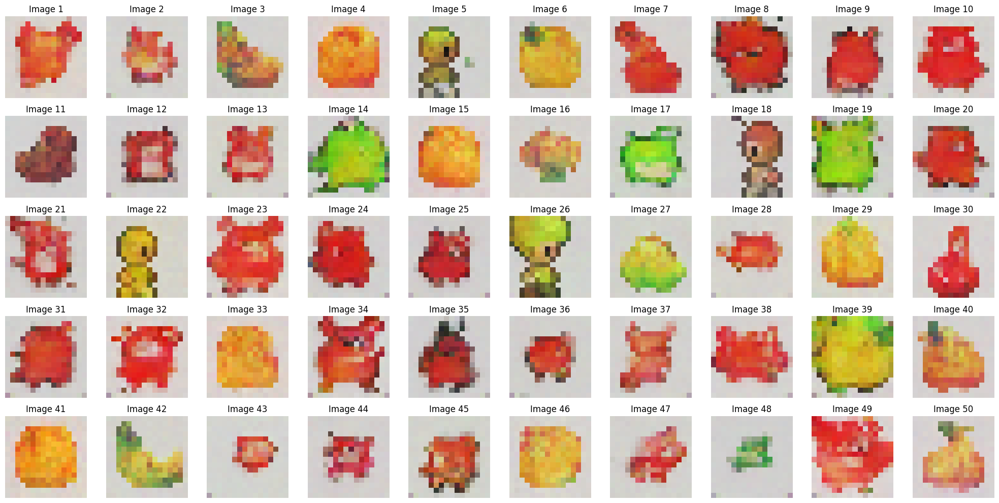

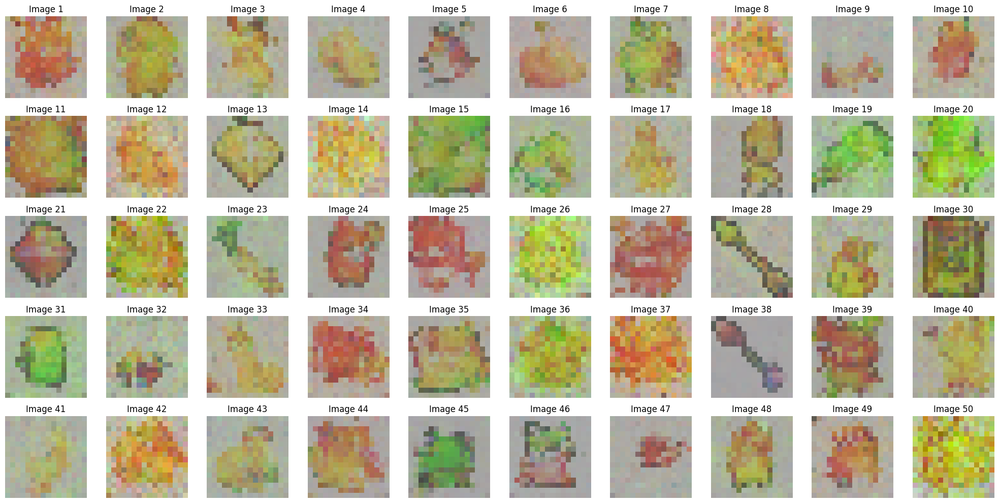

100%|██████████| 1/1 [00:00<00:00,  3.02it/s]


FID Score for DDPM at Epoch 16: 202.34178574731897


100%|██████████| 1/1 [00:00<00:00,  3.09it/s]


FID Score for DDIM at Epoch 16: 350.6473576480978

Epoch 17/40


Training: 100%|██████████| 716/716 [00:32<00:00, 22.28it/s]


Average Loss: 0.046806


DDPM Sampling: 1000it [00:06, 151.19it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 14it [00:00, 135.51it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step
Step 474/500: Deterministic step


DDIM Sampling: 41it [00:00, 128.44it/s]

Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step


DDIM Sampling: 68it [00:00, 123.83it/s]

Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step


DDIM Sampling: 95it [00:00, 126.96it/s]

Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step


DDIM Sampling: 123it [00:00, 129.66it/s]

Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step


DDIM Sampling: 150it [00:01, 129.91it/s]

Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step

DDIM Sampling: 177it [00:01, 126.73it/s]


Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step


DDIM Sampling: 204it [00:01, 126.97it/s]

Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step


DDIM Sampling: 231it [00:01, 129.35it/s]

Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step


DDIM Sampling: 258it [00:02, 123.49it/s]

Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step


DDIM Sampling: 271it [00:02, 120.06it/s]

Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step


DDIM Sampling: 296it [00:02, 113.96it/s]

Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step

DDIM Sampling: 321it [00:02, 114.37it/s]


Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step


DDIM Sampling: 347it [00:02, 121.11it/s]

Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step


DDIM Sampling: 374it [00:03, 123.87it/s]

Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step


DDIM Sampling: 401it [00:03, 127.50it/s]

Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step


DDIM Sampling: 427it [00:03, 125.33it/s]

Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step


DDIM Sampling: 453it [00:03, 119.21it/s]

Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step


DDIM Sampling: 480it [00:03, 124.90it/s]

Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step


DDIM Sampling: 500it [00:04, 123.85it/s]


Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


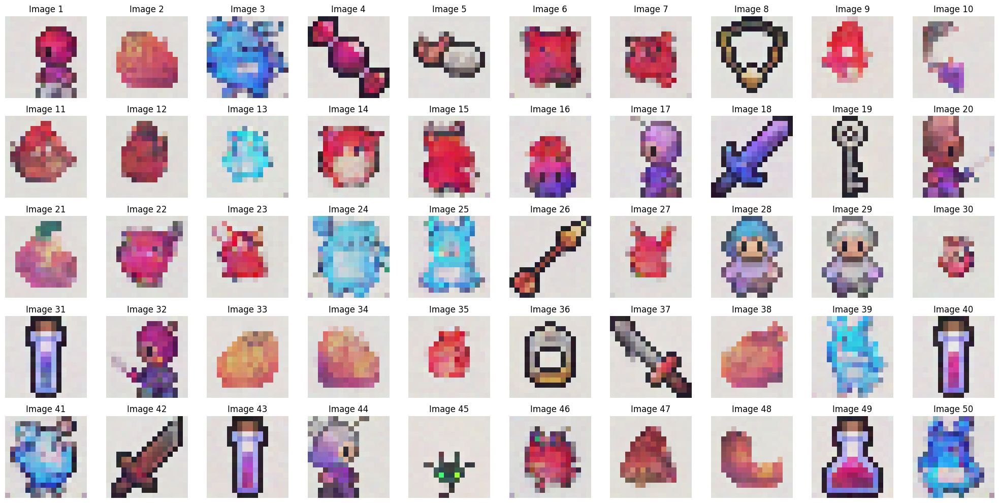

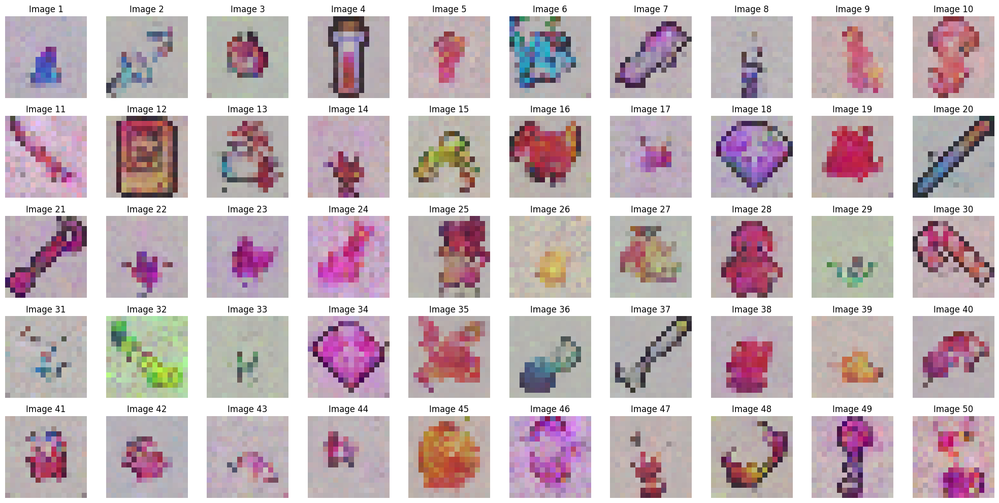

100%|██████████| 1/1 [00:00<00:00,  3.13it/s]


FID Score for DDPM at Epoch 17: 160.77569924030354


100%|██████████| 1/1 [00:00<00:00,  3.15it/s]


FID Score for DDIM at Epoch 17: 232.56491901499948

Epoch 18/40


Training: 100%|██████████| 716/716 [00:32<00:00, 21.86it/s]


Average Loss: 0.046162


DDPM Sampling: 1000it [00:06, 148.81it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 14it [00:00, 133.70it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step
Step 474/500: Deterministic step


DDIM Sampling: 42it [00:00, 130.96it/s]

Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step


DDIM Sampling: 70it [00:00, 129.41it/s]

Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step


DDIM Sampling: 97it [00:00, 127.09it/s]

Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step


DDIM Sampling: 123it [00:00, 121.37it/s]

Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step


DDIM Sampling: 149it [00:01, 123.93it/s]

Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step


DDIM Sampling: 176it [00:01, 126.37it/s]

Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step


DDIM Sampling: 202it [00:01, 127.70it/s]

Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step


DDIM Sampling: 215it [00:01, 122.38it/s]

Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step


DDIM Sampling: 228it [00:01, 116.46it/s]

Step 274/500: Deterministic step
Step 273/500: Deterministic step


DDIM Sampling: 241it [00:01, 117.92it/s]

Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step


DDIM Sampling: 254it [00:02, 119.18it/s]

Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step


DDIM Sampling: 267it [00:02, 121.33it/s]

Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step

DDIM Sampling: 280it [00:02, 120.83it/s]


Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step


DDIM Sampling: 294it [00:02, 123.74it/s]

Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step


DDIM Sampling: 307it [00:02, 125.37it/s]

Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step


DDIM Sampling: 320it [00:02, 126.12it/s]

Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step


DDIM Sampling: 333it [00:02, 125.88it/s]

Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step


DDIM Sampling: 346it [00:02, 121.16it/s]

Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step

DDIM Sampling: 372it [00:03, 117.02it/s]


Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step


DDIM Sampling: 399it [00:03, 122.48it/s]

Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step


DDIM Sampling: 425it [00:03, 119.57it/s]

Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step


DDIM Sampling: 438it [00:03, 113.34it/s]

Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step


DDIM Sampling: 451it [00:03, 114.88it/s]

Step 50/500: Deterministic step
Step 49/500: Deterministic step

DDIM Sampling: 463it [00:03, 109.12it/s]


Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step

DDIM Sampling: 486it [00:04, 106.23it/s]


Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step


DDIM Sampling: 500it [00:04, 119.70it/s]


Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


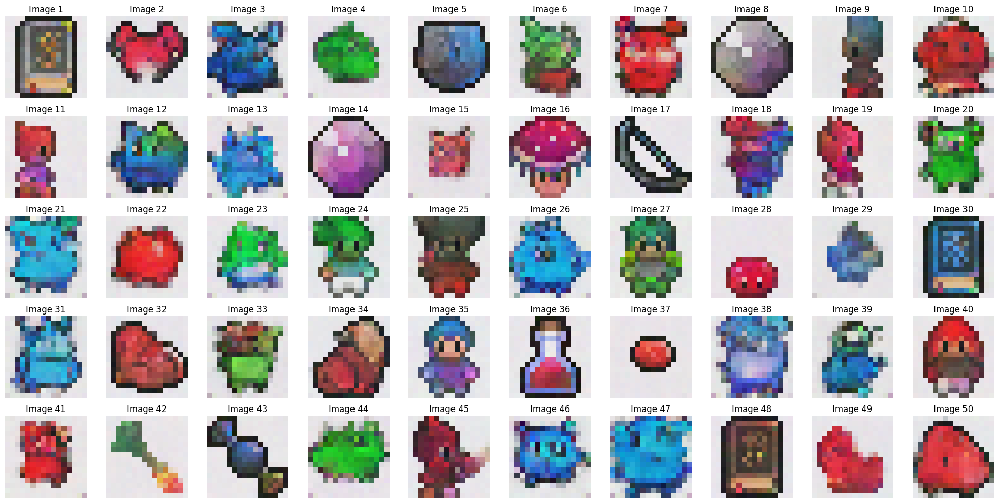

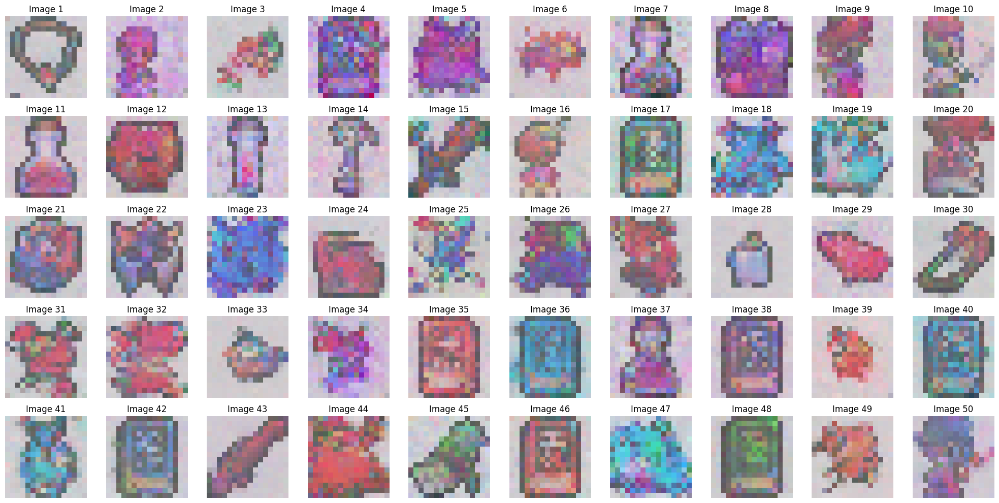

100%|██████████| 1/1 [00:00<00:00,  2.93it/s]


FID Score for DDPM at Epoch 18: 146.94971509856435


100%|██████████| 1/1 [00:00<00:00,  3.09it/s]


FID Score for DDIM at Epoch 18: 194.8338304155959

Epoch 19/40


Training: 100%|██████████| 716/716 [00:32<00:00, 21.83it/s]


Average Loss: 0.045113


DDPM Sampling: 1000it [00:07, 137.91it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 14it [00:00, 132.95it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step
Step 474/500: Deterministic step


DDIM Sampling: 42it [00:00, 130.21it/s]

Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step


DDIM Sampling: 70it [00:00, 126.36it/s]

Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step


DDIM Sampling: 96it [00:00, 124.80it/s]

Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step


DDIM Sampling: 122it [00:00, 124.81it/s]

Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step


DDIM Sampling: 149it [00:01, 126.71it/s]

Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step


DDIM Sampling: 175it [00:01, 118.83it/s]

Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step


DDIM Sampling: 202it [00:01, 124.00it/s]

Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step

DDIM Sampling: 228it [00:01, 124.23it/s]


Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step


DDIM Sampling: 254it [00:02, 124.58it/s]

Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step

DDIM Sampling: 280it [00:02, 124.65it/s]


Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step


DDIM Sampling: 293it [00:02, 126.15it/s]

Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step


DDIM Sampling: 306it [00:02, 123.50it/s]

Step 194/500: Deterministic step


DDIM Sampling: 319it [00:02, 119.95it/s]

Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step


DDIM Sampling: 332it [00:02, 122.73it/s]

Step 169/500: Deterministic step


DDIM Sampling: 345it [00:02, 122.76it/s]

Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step


DDIM Sampling: 358it [00:02, 124.35it/s]

Step 143/500: Deterministic step


DDIM Sampling: 371it [00:02, 124.67it/s]

Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step


DDIM Sampling: 384it [00:03, 123.92it/s]

Step 117/500: Deterministic step


DDIM Sampling: 397it [00:03, 125.20it/s]

Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step


DDIM Sampling: 410it [00:03, 126.07it/s]

Step 91/500: Deterministic step


DDIM Sampling: 424it [00:03, 127.68it/s]

Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step


DDIM Sampling: 450it [00:03, 123.51it/s]

Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step


DDIM Sampling: 477it [00:03, 123.07it/s]

Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step


DDIM Sampling: 500it [00:04, 123.87it/s]


Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


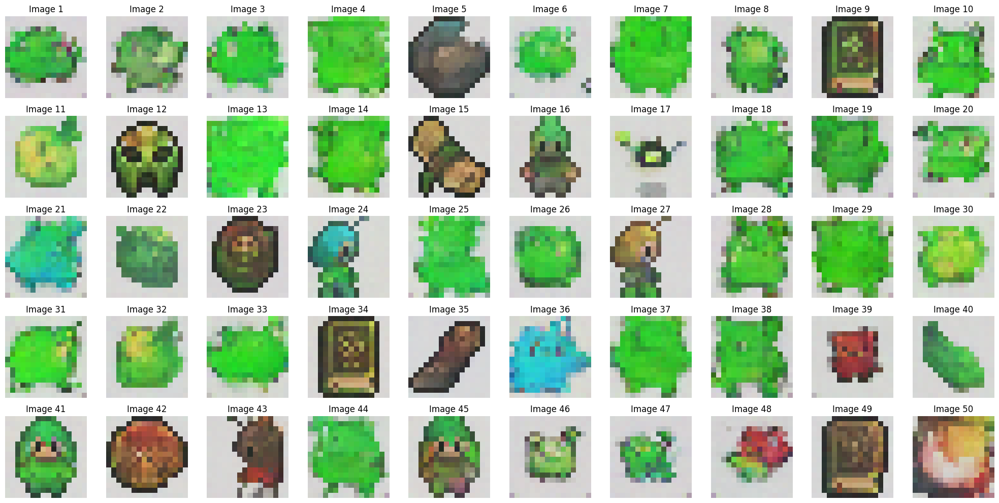

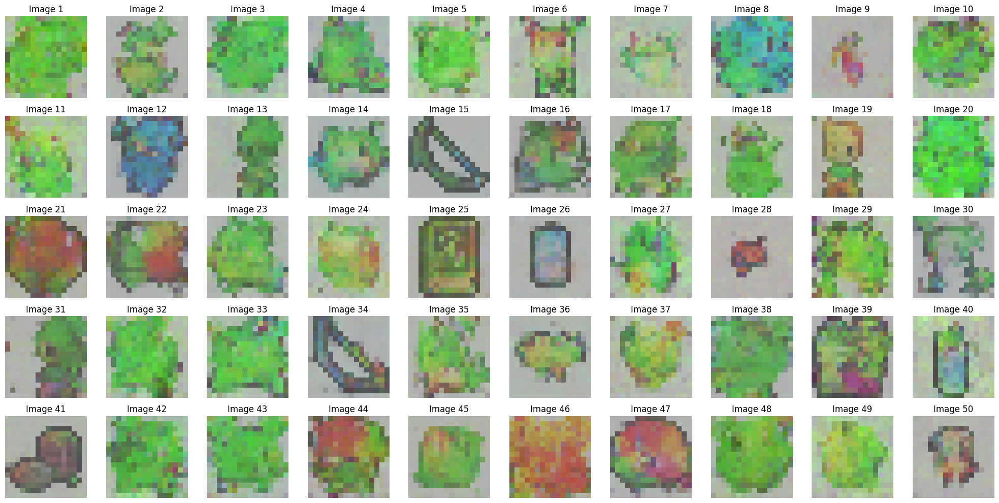

100%|██████████| 1/1 [00:00<00:00,  3.02it/s]


FID Score for DDPM at Epoch 19: 190.8137219240003


100%|██████████| 1/1 [00:00<00:00,  3.19it/s]


FID Score for DDIM at Epoch 19: 235.2089287890081

Epoch 20/40


Training: 100%|██████████| 716/716 [00:32<00:00, 21.83it/s]


Average Loss: 0.044341


DDPM Sampling: 1000it [00:07, 134.32it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 12it [00:00, 118.26it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step

DDIM Sampling: 37it [00:00, 119.84it/s]


Step 476/500: Deterministic step
Step 475/500: Deterministic step
Step 474/500: Deterministic step
Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step


DDIM Sampling: 63it [00:00, 116.09it/s]

Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step


DDIM Sampling: 90it [00:00, 123.03it/s]

Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step


DDIM Sampling: 116it [00:00, 123.63it/s]

Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step


DDIM Sampling: 143it [00:01, 124.21it/s]

Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step


DDIM Sampling: 170it [00:01, 124.58it/s]

Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step


DDIM Sampling: 183it [00:01, 114.63it/s]

Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step


DDIM Sampling: 197it [00:01, 119.18it/s]

Step 304/500: Deterministic step


DDIM Sampling: 210it [00:01, 121.37it/s]

Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step

DDIM Sampling: 223it [00:01, 121.25it/s]


Step 278/500: Deterministic step


DDIM Sampling: 236it [00:01, 122.94it/s]

Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step


DDIM Sampling: 249it [00:02, 124.54it/s]

Step 253/500: Deterministic step
Step 252/500: Deterministic step


DDIM Sampling: 262it [00:02, 125.46it/s]

Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step


DDIM Sampling: 288it [00:02, 122.39it/s]

Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step


DDIM Sampling: 314it [00:02, 120.01it/s]

Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step


DDIM Sampling: 340it [00:02, 123.00it/s]

Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step


DDIM Sampling: 366it [00:03, 125.41it/s]

Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step


DDIM Sampling: 393it [00:03, 125.57it/s]

Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step


DDIM Sampling: 419it [00:03, 123.24it/s]

Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step


DDIM Sampling: 446it [00:03, 125.46it/s]

Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step


DDIM Sampling: 473it [00:03, 127.08it/s]

Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step


DDIM Sampling: 500it [00:04, 122.59it/s]

Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


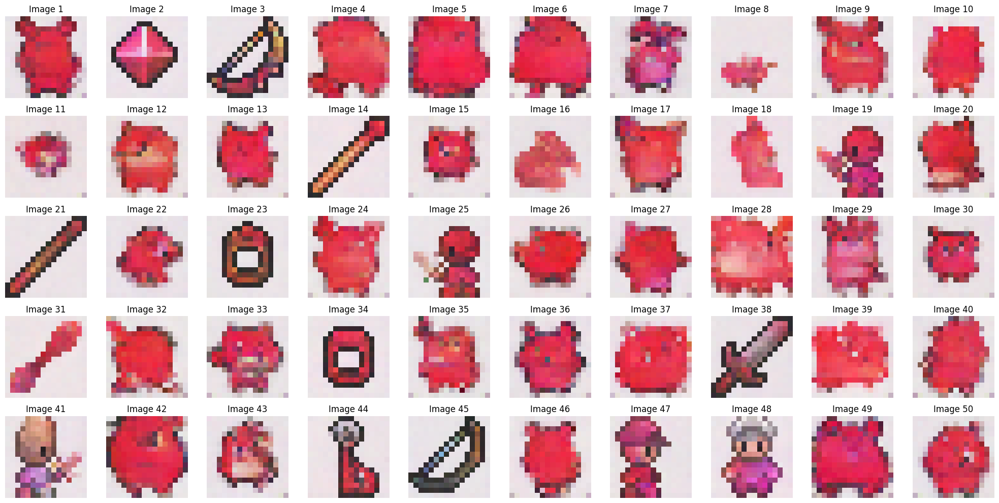

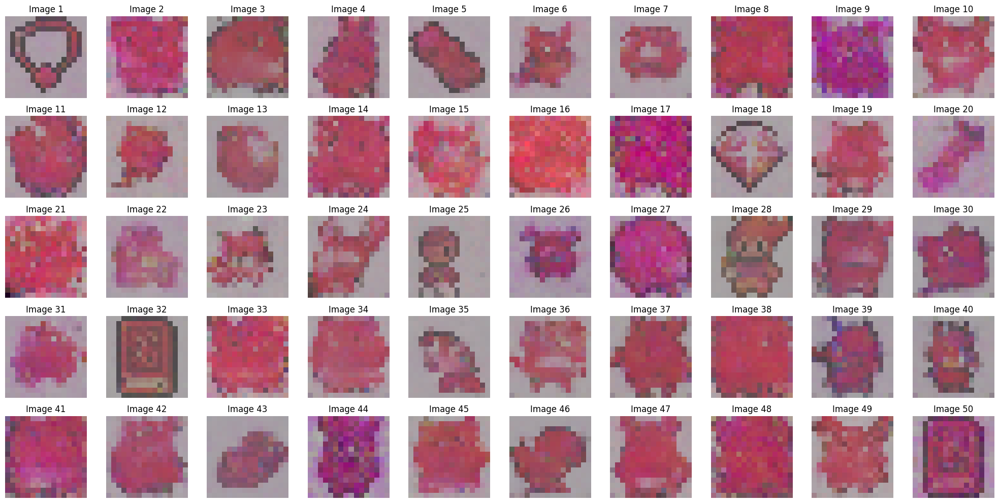

100%|██████████| 1/1 [00:00<00:00,  3.16it/s]


FID Score for DDPM at Epoch 20: 181.836362202849


100%|██████████| 1/1 [00:00<00:00,  2.99it/s]


FID Score for DDIM at Epoch 20: 249.94384147202564

Epoch 21/40


Training: 100%|██████████| 716/716 [00:32<00:00, 21.76it/s]


Average Loss: 0.043513


DDPM Sampling: 1000it [00:07, 135.93it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 13it [00:00, 125.88it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step


DDIM Sampling: 41it [00:00, 129.49it/s]

Step 474/500: Deterministic step
Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step


DDIM Sampling: 68it [00:00, 129.54it/s]

Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step


DDIM Sampling: 95it [00:00, 129.26it/s]

Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step


DDIM Sampling: 121it [00:00, 126.58it/s]

Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step


DDIM Sampling: 147it [00:01, 125.94it/s]

Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step


DDIM Sampling: 175it [00:01, 129.01it/s]

Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step


DDIM Sampling: 202it [00:01, 129.34it/s]

Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step


DDIM Sampling: 229it [00:01, 129.78it/s]

Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step


DDIM Sampling: 256it [00:02, 125.42it/s]

Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step


DDIM Sampling: 283it [00:02, 125.87it/s]

Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step


DDIM Sampling: 309it [00:02, 127.19it/s]

Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step


DDIM Sampling: 335it [00:02, 126.29it/s]

Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step


DDIM Sampling: 361it [00:02, 125.59it/s]

Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step


DDIM Sampling: 388it [00:03, 123.14it/s]

Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step


DDIM Sampling: 415it [00:03, 126.37it/s]

Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step


DDIM Sampling: 442it [00:03, 128.25it/s]

Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step


DDIM Sampling: 469it [00:03, 128.21it/s]

Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step


DDIM Sampling: 496it [00:03, 129.11it/s]

Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step


DDIM Sampling: 500it [00:03, 127.23it/s]


Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


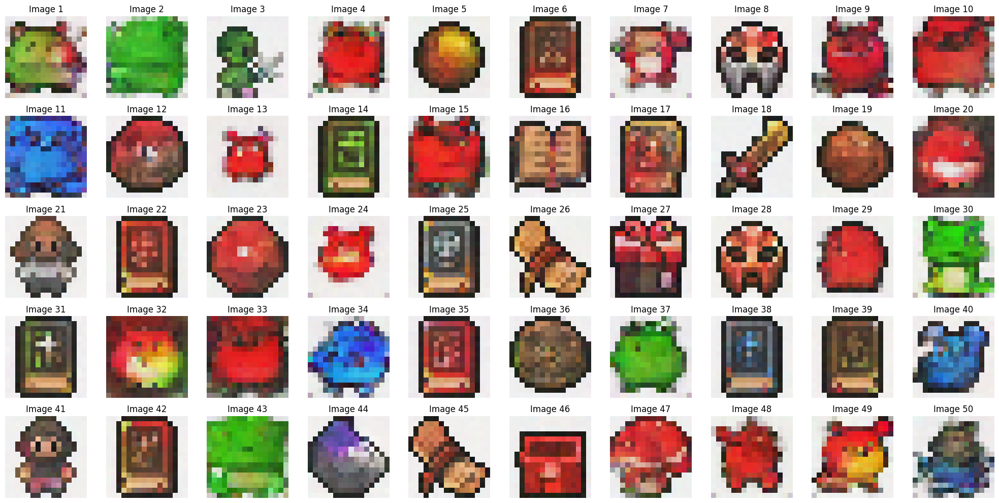

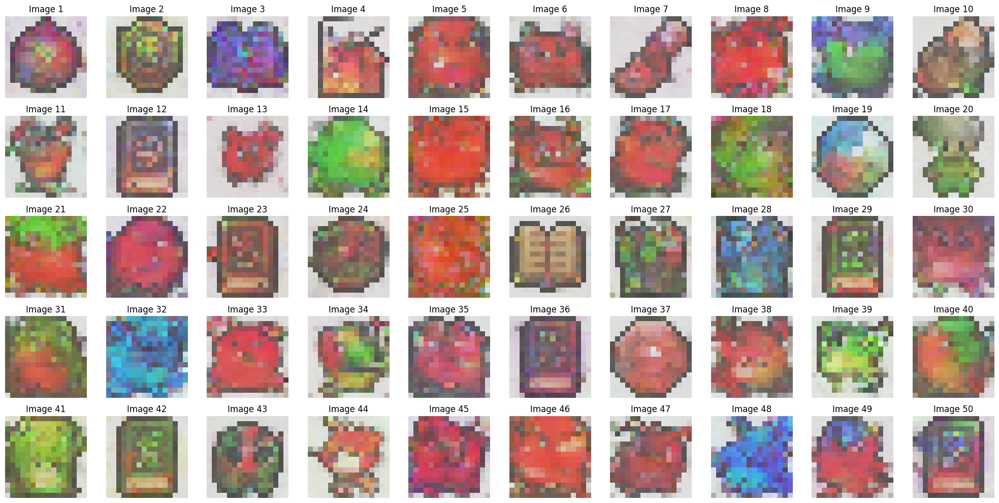

100%|██████████| 1/1 [00:00<00:00,  3.03it/s]


FID Score for DDPM at Epoch 21: 169.2675171159603


100%|██████████| 1/1 [00:00<00:00,  3.13it/s]


FID Score for DDIM at Epoch 21: 197.0414733546826

Epoch 22/40


Training: 100%|██████████| 716/716 [00:33<00:00, 21.66it/s]


Average Loss: 0.043502


DDPM Sampling: 1000it [00:07, 131.05it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 13it [00:00, 120.91it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step


DDIM Sampling: 38it [00:00, 102.38it/s]

Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step
Step 474/500: Deterministic step
Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step


DDIM Sampling: 61it [00:00, 105.77it/s]

Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step


DDIM Sampling: 85it [00:00, 111.12it/s]

Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step


DDIM Sampling: 111it [00:00, 117.20it/s]

Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step


DDIM Sampling: 137it [00:01, 121.48it/s]

Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step

DDIM Sampling: 163it [00:01, 118.93it/s]


Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step

DDIM Sampling: 189it [00:01, 123.36it/s]


Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step


DDIM Sampling: 216it [00:01, 126.63it/s]

Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step


DDIM Sampling: 243it [00:02, 128.54it/s]

Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step


DDIM Sampling: 257it [00:02, 129.23it/s]

Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step


DDIM Sampling: 285it [00:02, 131.21it/s]

Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step


DDIM Sampling: 313it [00:02, 127.32it/s]

Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step


DDIM Sampling: 340it [00:02, 129.09it/s]

Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step


DDIM Sampling: 368it [00:03, 130.71it/s]

Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step


DDIM Sampling: 396it [00:03, 129.88it/s]

Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step

DDIM Sampling: 422it [00:03, 127.33it/s]


Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step


DDIM Sampling: 449it [00:03, 127.70it/s]

Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step


DDIM Sampling: 475it [00:03, 127.14it/s]

Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step


DDIM Sampling: 500it [00:04, 123.29it/s]


Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


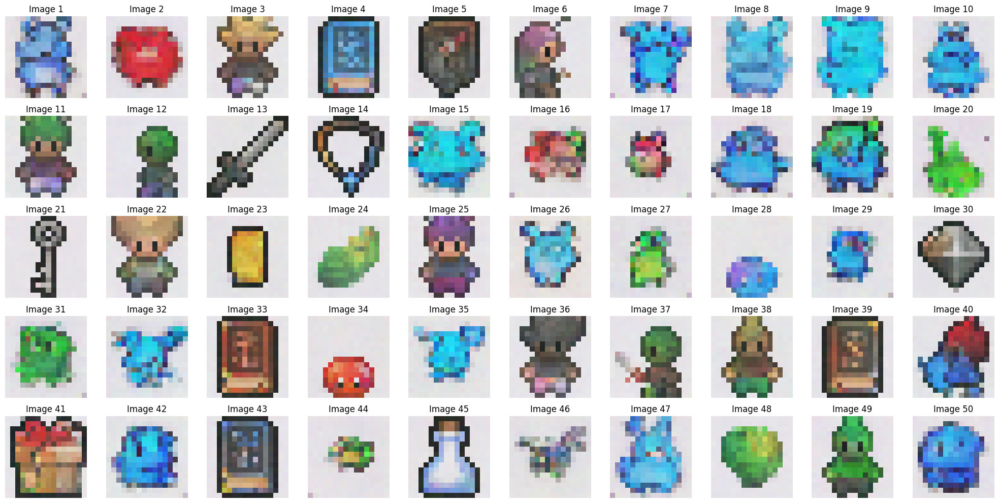

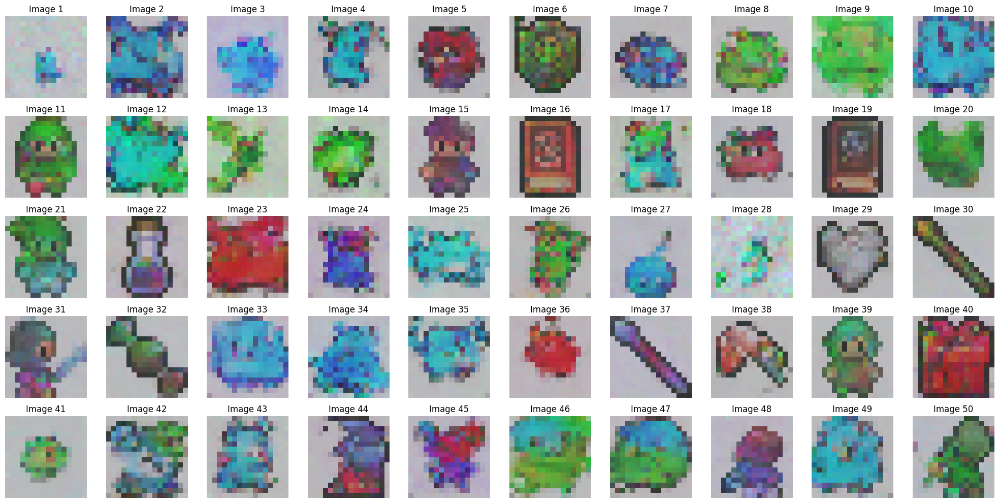

100%|██████████| 1/1 [00:00<00:00,  2.41it/s]


FID Score for DDPM at Epoch 22: 142.89486666895885


100%|██████████| 1/1 [00:00<00:00,  3.05it/s]


FID Score for DDIM at Epoch 22: 170.90185052960794

Epoch 23/40


Training: 100%|██████████| 716/716 [00:33<00:00, 21.11it/s]


Average Loss: 0.042753


DDPM Sampling: 1000it [00:07, 133.98it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 10it [00:00, 95.63it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step


DDIM Sampling: 31it [00:00, 95.95it/s]

Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step
Step 474/500: Deterministic step
Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step


DDIM Sampling: 56it [00:00, 110.68it/s]

Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step


DDIM Sampling: 82it [00:00, 117.05it/s]

Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step


DDIM Sampling: 108it [00:00, 121.94it/s]

Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step


DDIM Sampling: 134it [00:01, 116.04it/s]

Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step


DDIM Sampling: 161it [00:01, 123.15it/s]

Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step


DDIM Sampling: 188it [00:01, 126.97it/s]

Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step


DDIM Sampling: 215it [00:01, 128.48it/s]

Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step


DDIM Sampling: 241it [00:02, 124.40it/s]

Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step


DDIM Sampling: 254it [00:02, 111.38it/s]

Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step

DDIM Sampling: 267it [00:02, 115.59it/s]


Step 234/500: Deterministic step


DDIM Sampling: 281it [00:02, 120.14it/s]

Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step


DDIM Sampling: 294it [00:02, 122.44it/s]

Step 208/500: Deterministic step
Step 207/500: Deterministic step


DDIM Sampling: 307it [00:02, 123.61it/s]

Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step


DDIM Sampling: 320it [00:02, 123.22it/s]

Step 182/500: Deterministic step
Step 181/500: Deterministic step


DDIM Sampling: 334it [00:02, 125.99it/s]

Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step


DDIM Sampling: 347it [00:02, 126.52it/s]

Step 155/500: Deterministic step
Step 154/500: Deterministic step


DDIM Sampling: 360it [00:02, 127.33it/s]

Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step


DDIM Sampling: 373it [00:03, 125.90it/s]

Step 129/500: Deterministic step
Step 128/500: Deterministic step


DDIM Sampling: 386it [00:03, 120.54it/s]

Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step

DDIM Sampling: 412it [00:03, 122.78it/s]


Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step


DDIM Sampling: 439it [00:03, 127.00it/s]

Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step


DDIM Sampling: 467it [00:03, 129.51it/s]

Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step

DDIM Sampling: 500it [00:04, 121.60it/s]


Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


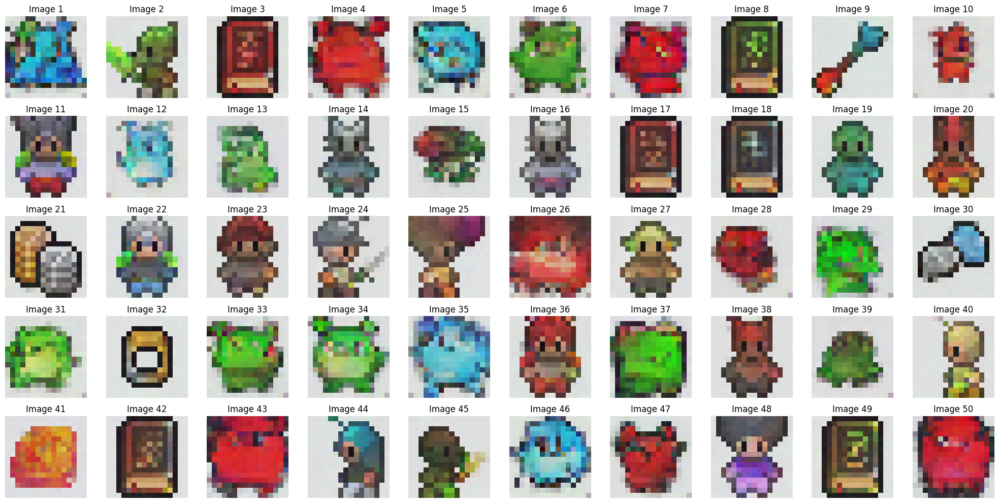

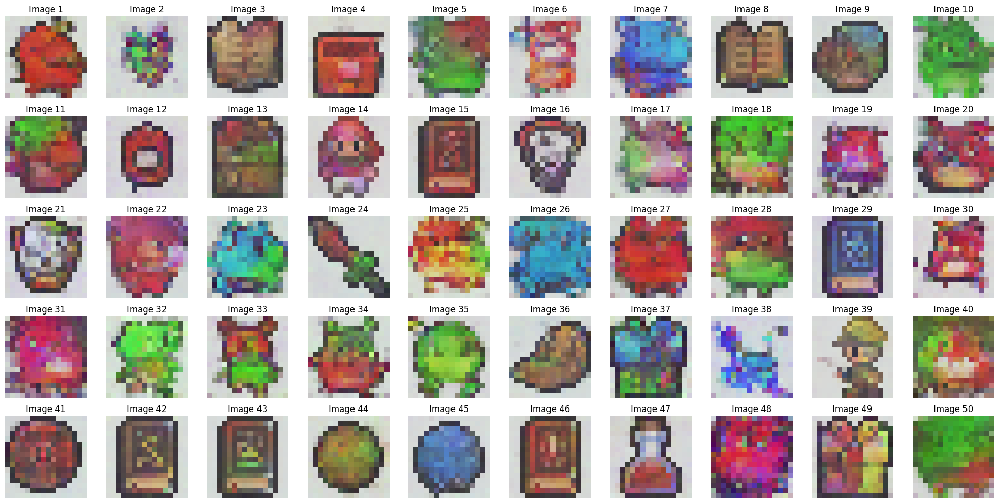

100%|██████████| 1/1 [00:00<00:00,  2.78it/s]


FID Score for DDPM at Epoch 23: 125.95931464288199


100%|██████████| 1/1 [00:00<00:00,  3.22it/s]


FID Score for DDIM at Epoch 23: 168.36797147750212

Epoch 24/40


Training: 100%|██████████| 716/716 [00:33<00:00, 21.15it/s]


Average Loss: 0.042137


DDPM Sampling: 1000it [00:07, 139.48it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 12it [00:00, 110.11it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step


DDIM Sampling: 38it [00:00, 113.67it/s]

Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step
Step 474/500: Deterministic step
Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step


DDIM Sampling: 61it [00:00, 98.45it/s] 

Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step


DDIM Sampling: 82it [00:00, 100.07it/s]

Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step


DDIM Sampling: 93it [00:00, 98.60it/s] 

Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step


DDIM Sampling: 105it [00:01, 103.94it/s]

Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step


DDIM Sampling: 117it [00:01, 107.74it/s]

Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step


DDIM Sampling: 129it [00:01, 109.81it/s]

Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step


DDIM Sampling: 141it [00:01, 112.28it/s]

Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step


DDIM Sampling: 153it [00:01, 111.56it/s]

Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step


DDIM Sampling: 165it [00:01, 105.91it/s]

Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step


DDIM Sampling: 189it [00:01, 108.44it/s]

Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step


DDIM Sampling: 214it [00:01, 113.83it/s]

Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step


DDIM Sampling: 241it [00:02, 121.42it/s]

Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step


DDIM Sampling: 268it [00:02, 125.15it/s]

Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step

DDIM Sampling: 294it [00:02, 124.52it/s]


Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step


DDIM Sampling: 320it [00:02, 122.01it/s]

Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step


DDIM Sampling: 346it [00:03, 121.75it/s]

Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step


DDIM Sampling: 373it [00:03, 125.45it/s]

Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step


DDIM Sampling: 400it [00:03, 127.77it/s]

Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step

DDIM Sampling: 427it [00:03, 128.63it/s]


Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step


DDIM Sampling: 440it [00:03, 125.42it/s]

Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step


DDIM Sampling: 454it [00:03, 126.60it/s]

Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step


DDIM Sampling: 467it [00:04, 127.03it/s]

Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step


DDIM Sampling: 480it [00:04, 122.72it/s]

Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step


DDIM Sampling: 500it [00:04, 117.01it/s]

Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


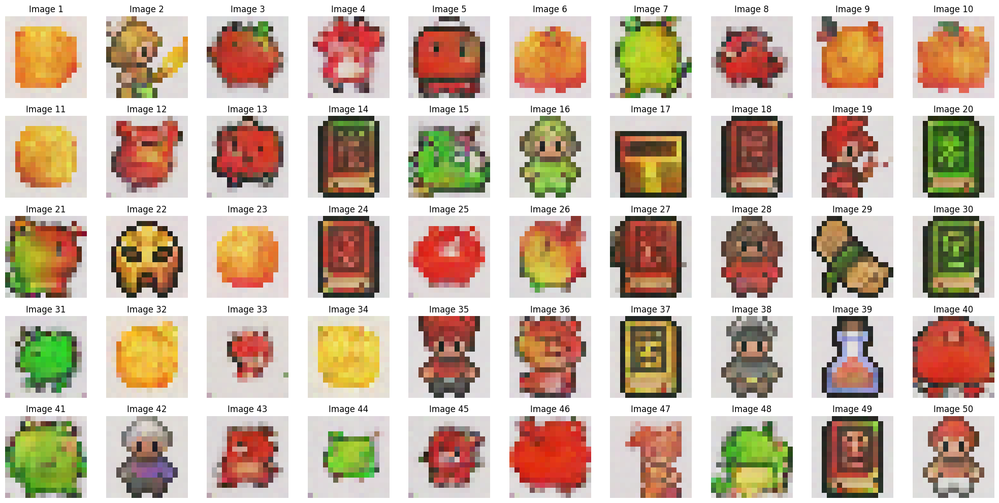

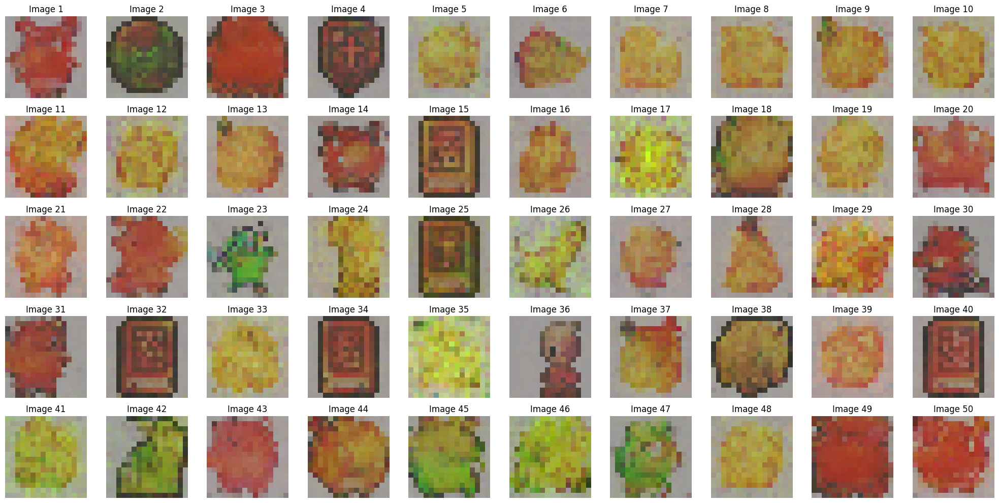

100%|██████████| 1/1 [00:00<00:00,  2.92it/s]


FID Score for DDPM at Epoch 24: 169.91718855589326


100%|██████████| 1/1 [00:00<00:00,  3.17it/s]


FID Score for DDIM at Epoch 24: 268.08695200146826

Epoch 25/40


Training: 100%|██████████| 716/716 [00:34<00:00, 20.86it/s]


Average Loss: 0.041140


DDPM Sampling: 1000it [00:07, 141.37it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 12it [00:00, 115.95it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step


DDIM Sampling: 36it [00:00, 112.53it/s]

Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step
Step 474/500: Deterministic step
Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step


DDIM Sampling: 59it [00:00, 106.60it/s]

Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step


DDIM Sampling: 81it [00:00, 100.05it/s]

Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step


DDIM Sampling: 102it [00:01, 94.50it/s]

Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step

DDIM Sampling: 124it [00:01, 100.63it/s]


Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step


DDIM Sampling: 149it [00:01, 110.95it/s]

Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step


DDIM Sampling: 162it [00:01, 115.03it/s]

Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step


DDIM Sampling: 175it [00:01, 115.76it/s]

Step 326/500: Deterministic step


DDIM Sampling: 187it [00:01, 114.63it/s]

Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step


DDIM Sampling: 212it [00:01, 111.09it/s]

Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step


DDIM Sampling: 239it [00:02, 120.04it/s]

Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step


DDIM Sampling: 266it [00:02, 123.25it/s]

Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step


DDIM Sampling: 293it [00:02, 127.16it/s]

Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step


DDIM Sampling: 320it [00:02, 127.67it/s]

Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step


DDIM Sampling: 346it [00:03, 125.63it/s]

Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step


DDIM Sampling: 373it [00:03, 127.85it/s]

Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step


DDIM Sampling: 399it [00:03, 128.02it/s]

Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step


DDIM Sampling: 426it [00:03, 129.10it/s]

Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step


DDIM Sampling: 452it [00:03, 128.67it/s]

Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step


DDIM Sampling: 465it [00:03, 122.90it/s]

Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step


DDIM Sampling: 478it [00:04, 123.28it/s]

Step 23/500: Deterministic step


DDIM Sampling: 500it [00:04, 117.53it/s]

Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


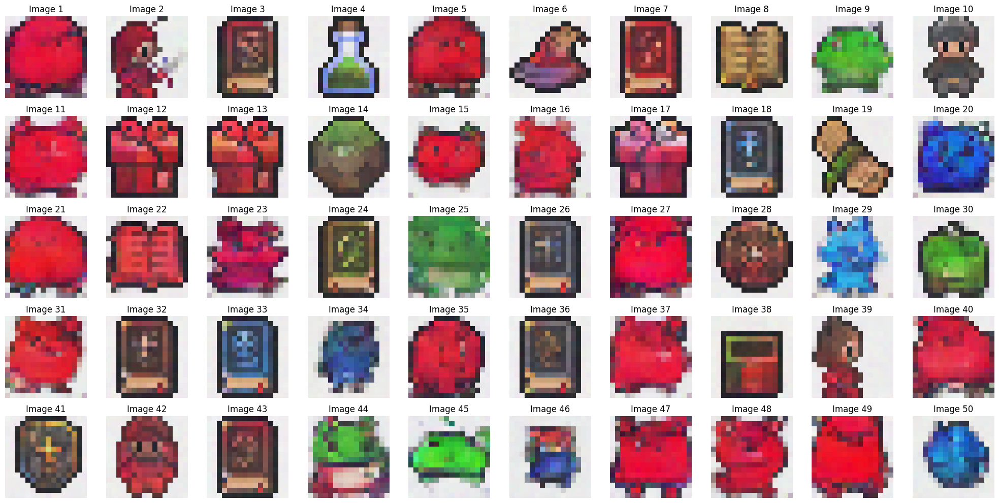

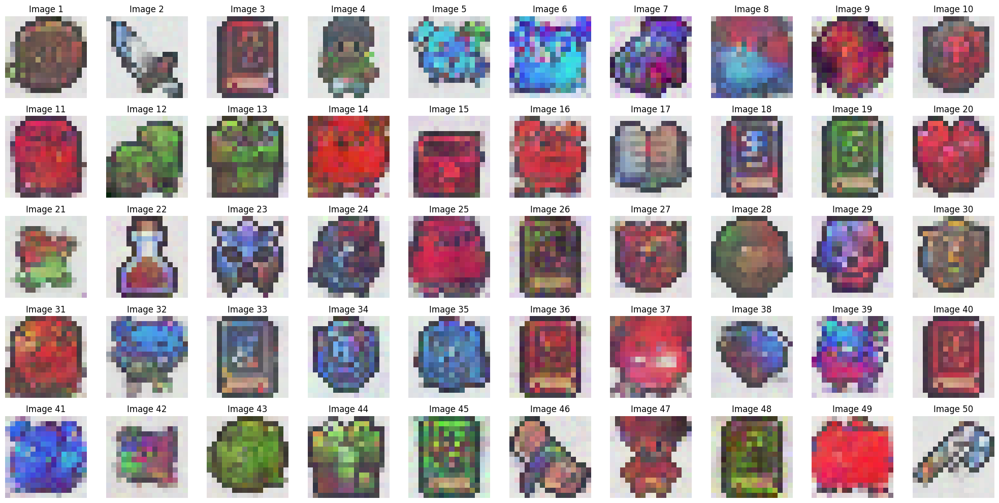

100%|██████████| 1/1 [00:00<00:00,  2.42it/s]


FID Score for DDPM at Epoch 25: 177.93774416658692


100%|██████████| 1/1 [00:00<00:00,  3.21it/s]


FID Score for DDIM at Epoch 25: 169.42066211540117

Epoch 26/40


Training: 100%|██████████| 716/716 [00:34<00:00, 20.92it/s]


Average Loss: 0.040898


DDPM Sampling: 1000it [00:07, 142.43it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 11it [00:00, 108.15it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step


DDIM Sampling: 22it [00:00, 106.17it/s]

Step 479/500: Deterministic step


DDIM Sampling: 33it [00:00, 100.17it/s]

Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step
Step 474/500: Deterministic step
Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step


DDIM Sampling: 58it [00:00, 110.18it/s]

Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step


DDIM Sampling: 81it [00:00, 103.21it/s]

Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step


DDIM Sampling: 103it [00:00, 101.73it/s]

Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step


DDIM Sampling: 125it [00:01, 99.25it/s] 

Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step


DDIM Sampling: 145it [00:01, 97.72it/s]

Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step


DDIM Sampling: 156it [00:01, 100.02it/s]

Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step


DDIM Sampling: 167it [00:01, 98.28it/s] 

Step 334/500: Deterministic step


DDIM Sampling: 177it [00:01, 95.92it/s]

Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step


DDIM Sampling: 198it [00:01, 96.12it/s]

Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step


DDIM Sampling: 224it [00:02, 110.83it/s]

Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step


DDIM Sampling: 250it [00:02, 117.70it/s]

Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step


DDIM Sampling: 275it [00:02, 115.67it/s]

Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step


DDIM Sampling: 300it [00:02, 120.43it/s]

Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step


DDIM Sampling: 326it [00:03, 124.21it/s]

Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step

DDIM Sampling: 352it [00:03, 125.89it/s]


Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step


DDIM Sampling: 379it [00:03, 125.73it/s]

Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step


DDIM Sampling: 404it [00:03, 118.41it/s]

Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step


DDIM Sampling: 430it [00:03, 123.58it/s]

Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step


DDIM Sampling: 457it [00:04, 126.22it/s]

Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step


DDIM Sampling: 483it [00:04, 126.21it/s]

Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step


DDIM Sampling: 500it [00:04, 112.83it/s]


Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


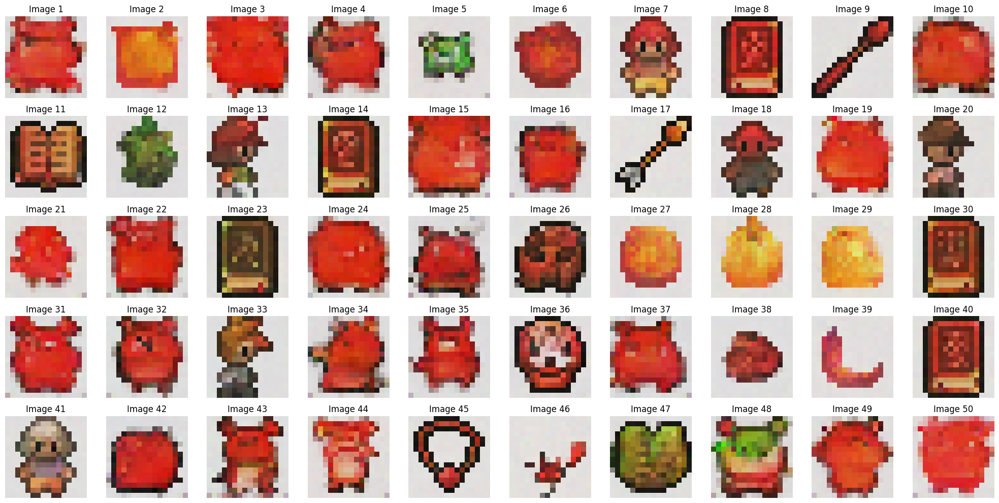

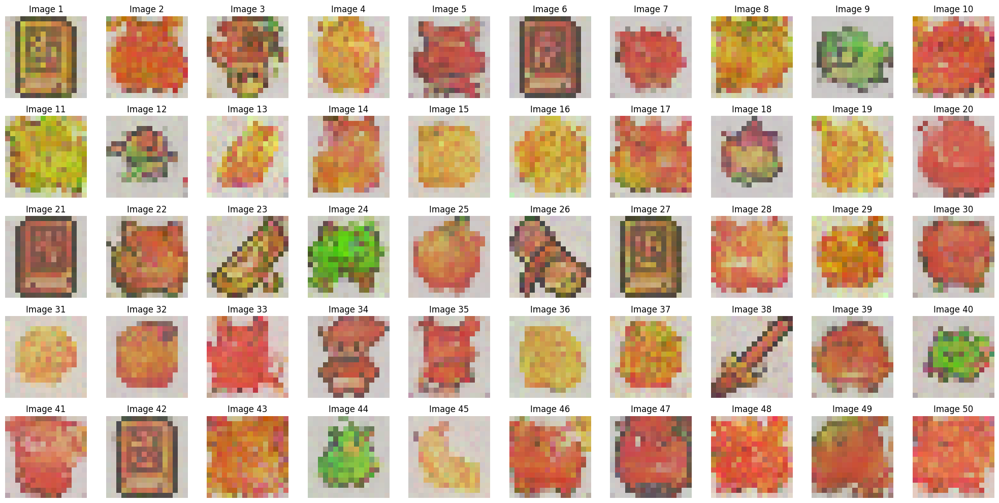

100%|██████████| 1/1 [00:00<00:00,  2.56it/s]


FID Score for DDPM at Epoch 26: 185.51409567028463


100%|██████████| 1/1 [00:00<00:00,  3.01it/s]


FID Score for DDIM at Epoch 26: 266.36160175857907

Epoch 27/40


Training: 100%|██████████| 716/716 [00:34<00:00, 20.88it/s]


Average Loss: 0.041141


DDPM Sampling: 1000it [00:07, 135.24it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 12it [00:00, 117.71it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step

DDIM Sampling: 38it [00:00, 120.97it/s]


Step 475/500: Deterministic step
Step 474/500: Deterministic step
Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step

DDIM Sampling: 64it [00:00, 116.15it/s]


Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step


DDIM Sampling: 89it [00:00, 108.18it/s]

Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step

DDIM Sampling: 114it [00:01, 114.41it/s]


Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step


DDIM Sampling: 126it [00:01, 114.14it/s]

Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step

DDIM Sampling: 138it [00:01, 113.61it/s]

DDIM Sampling: 150it [00:01, 112.75it/s]

Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step


DDIM Sampling: 163it [00:01, 117.30it/s]

Step 339/500: Deterministic step
Step 338/500: Deterministic step


DDIM Sampling: 176it [00:01, 119.16it/s]

Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step


DDIM Sampling: 189it [00:01, 121.08it/s]

Step 313/500: Deterministic step
Step 312/500: Deterministic step


DDIM Sampling: 202it [00:01, 123.36it/s]

Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step


DDIM Sampling: 215it [00:01, 125.13it/s]

Step 286/500: Deterministic step
Step 285/500: Deterministic step


DDIM Sampling: 228it [00:01, 121.22it/s]

Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step


DDIM Sampling: 256it [00:02, 126.79it/s]

Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step


DDIM Sampling: 283it [00:02, 128.36it/s]

Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step


DDIM Sampling: 309it [00:02, 127.22it/s]

Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step


DDIM Sampling: 336it [00:02, 128.02it/s]

Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step


DDIM Sampling: 362it [00:03, 123.29it/s]

Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step


DDIM Sampling: 389it [00:03, 126.80it/s]

Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step


DDIM Sampling: 415it [00:03, 125.71it/s]

Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step


DDIM Sampling: 441it [00:03, 124.34it/s]

Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step

DDIM Sampling: 468it [00:03, 126.62it/s]


Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step


DDIM Sampling: 494it [00:04, 122.84it/s]

Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step


DDIM Sampling: 500it [00:04, 121.38it/s]


Step 1/500: Deterministic step
DDIM sampling completed.


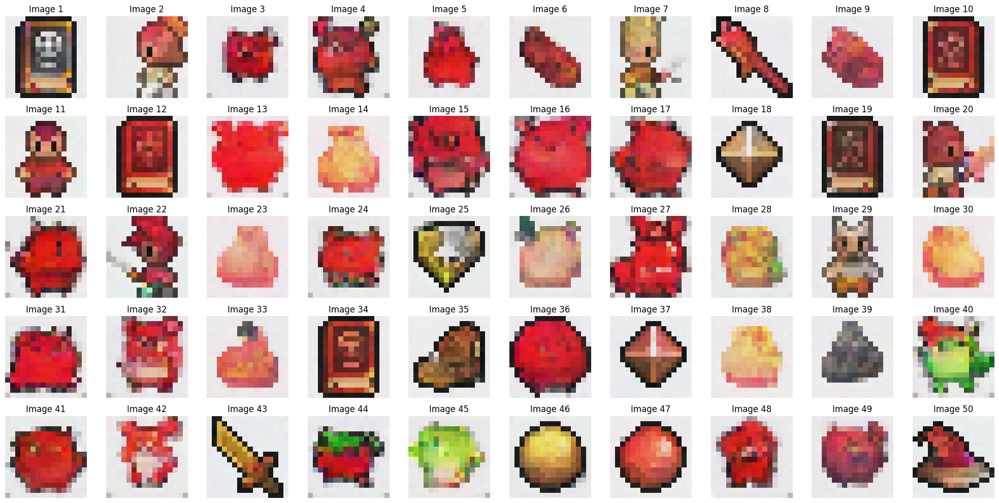

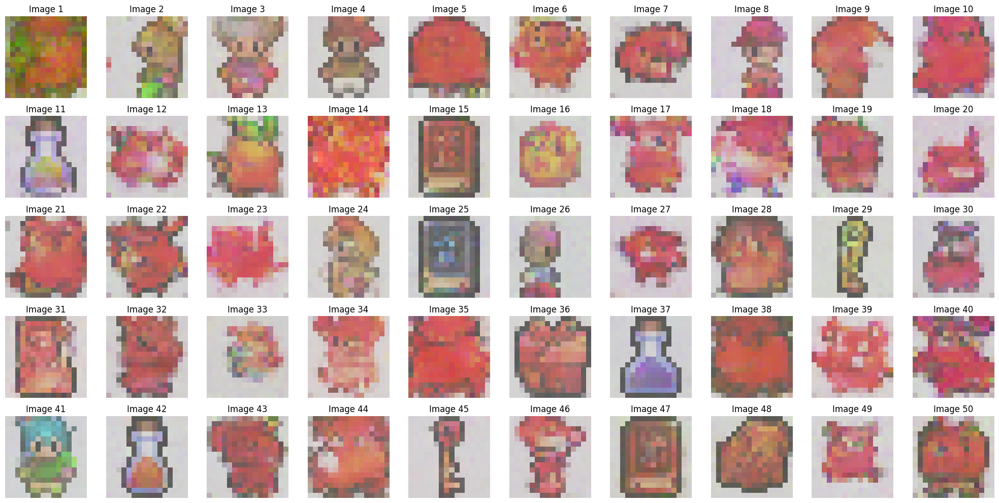

100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


FID Score for DDPM at Epoch 27: 178.02121037990554


100%|██████████| 1/1 [00:00<00:00,  3.16it/s]


FID Score for DDIM at Epoch 27: 197.77169945379467

Epoch 28/40


Training: 100%|██████████| 716/716 [00:35<00:00, 20.09it/s]


Average Loss: 0.039292


DDPM Sampling: 1000it [00:07, 138.32it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 14it [00:00, 130.64it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step


DDIM Sampling: 41it [00:00, 116.88it/s]

Step 476/500: Deterministic step
Step 475/500: Deterministic step
Step 474/500: Deterministic step
Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step


DDIM Sampling: 68it [00:00, 124.74it/s]

Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step


DDIM Sampling: 95it [00:00, 127.73it/s]

Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step


DDIM Sampling: 121it [00:00, 127.56it/s]

Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step


DDIM Sampling: 148it [00:01, 123.95it/s]

Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step


DDIM Sampling: 175it [00:01, 125.35it/s]

Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step

DDIM Sampling: 201it [00:01, 127.07it/s]


Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step


DDIM Sampling: 214it [00:01, 126.05it/s]

Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step


DDIM Sampling: 228it [00:01, 127.35it/s]

Step 273/500: Deterministic step


DDIM Sampling: 241it [00:01, 127.65it/s]

Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step


DDIM Sampling: 254it [00:02, 125.81it/s]

Step 247/500: Deterministic step


DDIM Sampling: 267it [00:02, 126.19it/s]

Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step

DDIM Sampling: 281it [00:02, 127.44it/s]


Step 220/500: Deterministic step


DDIM Sampling: 294it [00:02, 122.42it/s]

Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step


DDIM Sampling: 321it [00:02, 126.11it/s]

Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step


DDIM Sampling: 347it [00:02, 127.56it/s]

Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step

DDIM Sampling: 373it [00:02, 127.75it/s]


Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step

DDIM Sampling: 400it [00:03, 123.92it/s]


Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step


DDIM Sampling: 426it [00:03, 120.93it/s]

Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step

DDIM Sampling: 453it [00:03, 124.88it/s]


Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step


DDIM Sampling: 479it [00:03, 126.29it/s]

Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step


DDIM Sampling: 500it [00:04, 123.92it/s]


Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


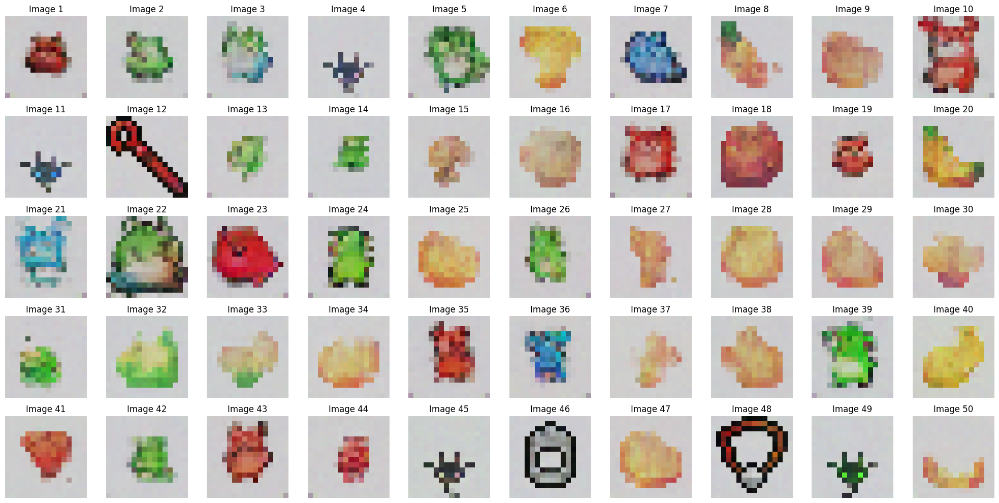

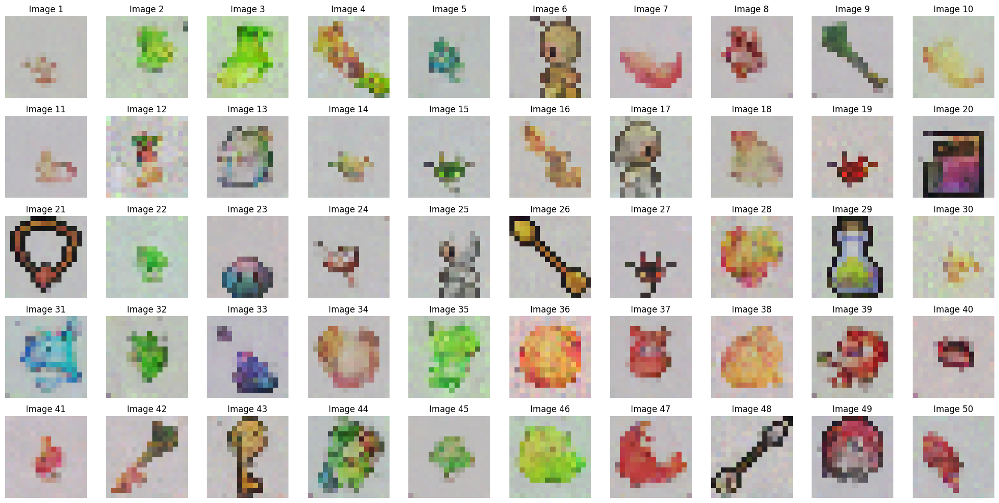

100%|██████████| 1/1 [00:00<00:00,  3.12it/s]


FID Score for DDPM at Epoch 28: 195.23250260041385


100%|██████████| 1/1 [00:00<00:00,  2.91it/s]


FID Score for DDIM at Epoch 28: 208.8946921028794

Epoch 29/40


Training: 100%|██████████| 716/716 [00:35<00:00, 19.94it/s]


Average Loss: 0.038813


DDPM Sampling: 1000it [00:06, 142.89it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 13it [00:00, 129.04it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step


DDIM Sampling: 27it [00:00, 130.44it/s]

Step 475/500: Deterministic step
Step 474/500: Deterministic step


DDIM Sampling: 41it [00:00, 127.41it/s]

Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step


DDIM Sampling: 67it [00:00, 116.61it/s]

Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step


DDIM Sampling: 94it [00:00, 124.12it/s]

Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step


DDIM Sampling: 121it [00:00, 127.29it/s]

Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step


DDIM Sampling: 147it [00:01, 127.96it/s]

Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step


DDIM Sampling: 174it [00:01, 127.47it/s]

Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step


DDIM Sampling: 200it [00:01, 115.73it/s]

Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step


DDIM Sampling: 226it [00:01, 121.65it/s]

Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step


DDIM Sampling: 253it [00:02, 125.74it/s]

Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step


DDIM Sampling: 280it [00:02, 127.66it/s]

Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step


DDIM Sampling: 293it [00:02, 125.94it/s]

Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step


DDIM Sampling: 307it [00:02, 125.35it/s]

Step 194/500: Deterministic step


DDIM Sampling: 320it [00:02, 118.02it/s]

Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step


DDIM Sampling: 346it [00:02, 121.36it/s]

Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step

DDIM Sampling: 373it [00:03, 125.57it/s]


Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step


DDIM Sampling: 400it [00:03, 123.62it/s]

Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step


DDIM Sampling: 426it [00:03, 121.65it/s]

Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step

DDIM Sampling: 439it [00:03, 114.48it/s]


Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step

DDIM Sampling: 462it [00:03, 105.12it/s]


Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step


DDIM Sampling: 484it [00:04, 100.49it/s]

Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step


DDIM Sampling: 500it [00:04, 118.50it/s]


Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


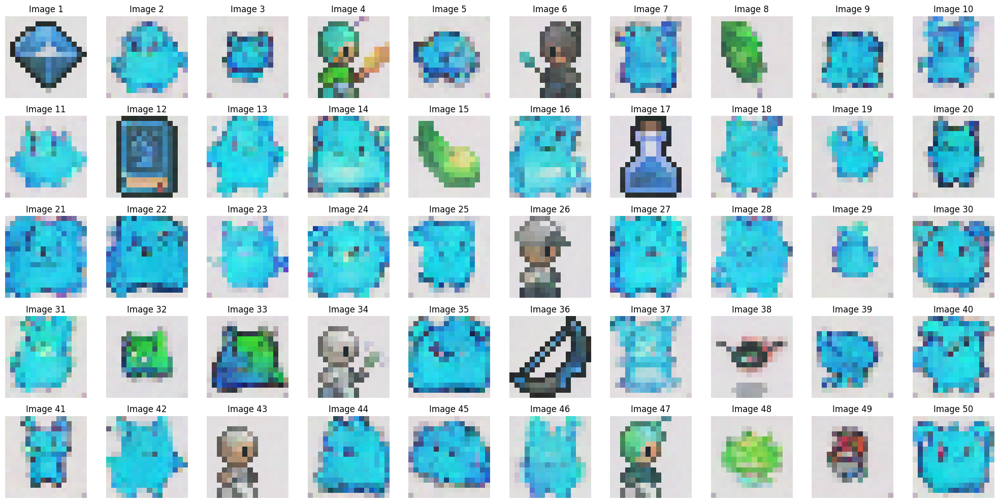

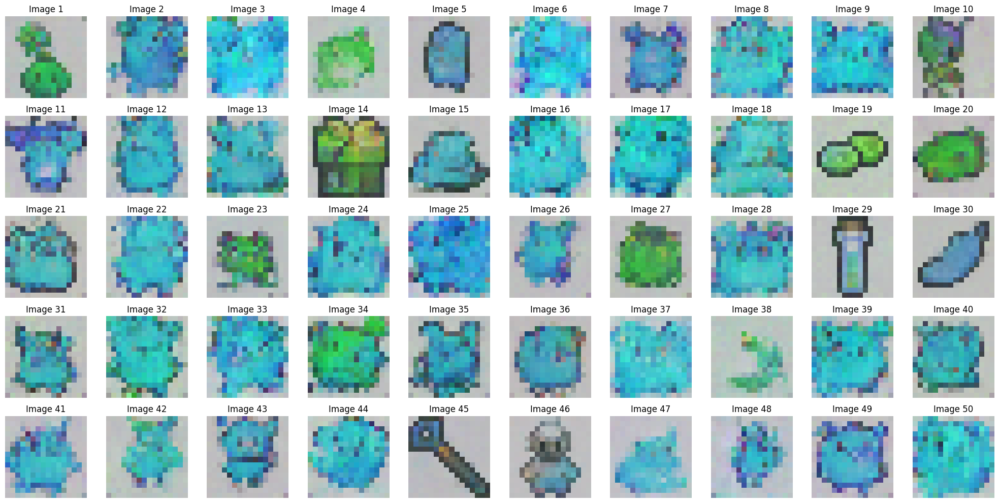

100%|██████████| 1/1 [00:00<00:00,  3.03it/s]


FID Score for DDPM at Epoch 29: 184.97902582809724


100%|██████████| 1/1 [00:00<00:00,  2.58it/s]


FID Score for DDIM at Epoch 29: 232.13062549956652

Epoch 30/40


Training: 100%|██████████| 716/716 [00:34<00:00, 20.59it/s]


Average Loss: 0.039233


DDPM Sampling: 1000it [00:06, 143.49it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 9it [00:00, 83.14it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step


DDIM Sampling: 32it [00:00, 105.85it/s]

Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step
Step 474/500: Deterministic step
Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step

DDIM Sampling: 56it [00:00, 113.20it/s]


Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step


DDIM Sampling: 81it [00:00, 114.76it/s]

Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step


DDIM Sampling: 108it [00:00, 122.04it/s]

Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step


DDIM Sampling: 135it [00:01, 123.36it/s]

Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step


DDIM Sampling: 163it [00:01, 127.46it/s]

Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step


DDIM Sampling: 189it [00:01, 111.98it/s]

Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step


DDIM Sampling: 201it [00:01, 105.47it/s]

Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step


DDIM Sampling: 223it [00:02, 100.04it/s]

Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step


DDIM Sampling: 245it [00:02, 102.39it/s]

Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step


DDIM Sampling: 267it [00:02, 101.36it/s]

Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step


DDIM Sampling: 289it [00:02, 97.46it/s] 

Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step


DDIM Sampling: 311it [00:02, 99.88it/s]

Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step


DDIM Sampling: 336it [00:03, 109.63it/s]

Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step


DDIM Sampling: 361it [00:03, 114.99it/s]

Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step


DDIM Sampling: 373it [00:03, 116.01it/s]

Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step


DDIM Sampling: 396it [00:03, 102.55it/s]

Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step


DDIM Sampling: 420it [00:03, 109.24it/s]

Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step


DDIM Sampling: 446it [00:04, 118.02it/s]

Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step

DDIM Sampling: 473it [00:04, 124.96it/s]


Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step


DDIM Sampling: 500it [00:04, 111.33it/s]

Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


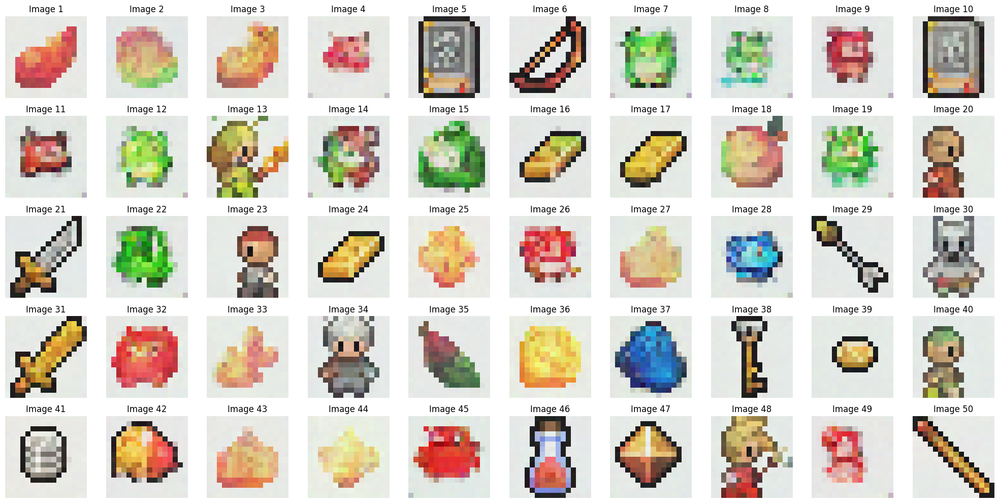

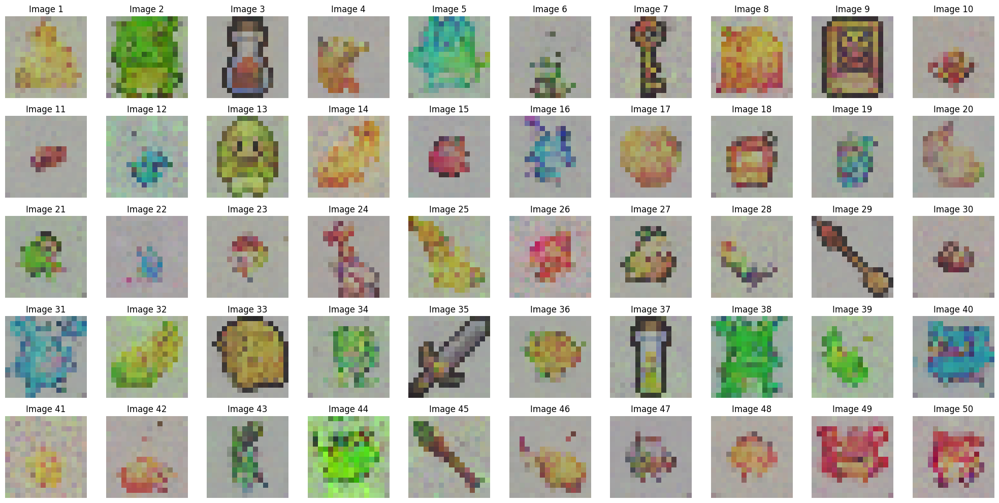

100%|██████████| 1/1 [00:00<00:00,  2.68it/s]


FID Score for DDPM at Epoch 30: 162.6924921697937


100%|██████████| 1/1 [00:00<00:00,  3.09it/s]


FID Score for DDIM at Epoch 30: 243.8025303875371

Epoch 31/40


Training: 100%|██████████| 716/716 [00:34<00:00, 20.81it/s]


Average Loss: 0.039159


DDPM Sampling: 1000it [00:07, 140.43it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 11it [00:00, 104.56it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step

DDIM Sampling: 34it [00:00, 108.93it/s]


Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step
Step 474/500: Deterministic step
Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step


DDIM Sampling: 56it [00:00, 107.02it/s]

Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step


DDIM Sampling: 78it [00:00, 103.56it/s]

Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step


DDIM Sampling: 103it [00:00, 114.45it/s]

Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step


DDIM Sampling: 128it [00:01, 111.49it/s]

Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step


DDIM Sampling: 151it [00:01, 102.22it/s]

Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step


DDIM Sampling: 178it [00:01, 115.17it/s]

Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step


DDIM Sampling: 203it [00:01, 118.27it/s]

Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step


DDIM Sampling: 230it [00:02, 124.77it/s]

Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step


DDIM Sampling: 256it [00:02, 126.32it/s]

Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step


DDIM Sampling: 282it [00:02, 125.34it/s]

Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step


DDIM Sampling: 309it [00:02, 128.16it/s]

Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step


DDIM Sampling: 336it [00:02, 127.02it/s]

Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step


DDIM Sampling: 363it [00:03, 129.38it/s]

Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step


DDIM Sampling: 389it [00:03, 128.78it/s]

Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step


DDIM Sampling: 416it [00:03, 128.73it/s]

Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step


DDIM Sampling: 443it [00:03, 128.83it/s]

Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step

DDIM Sampling: 469it [00:03, 125.78it/s]


Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step


DDIM Sampling: 496it [00:04, 128.26it/s]

Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step


DDIM Sampling: 500it [00:04, 120.45it/s]


Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


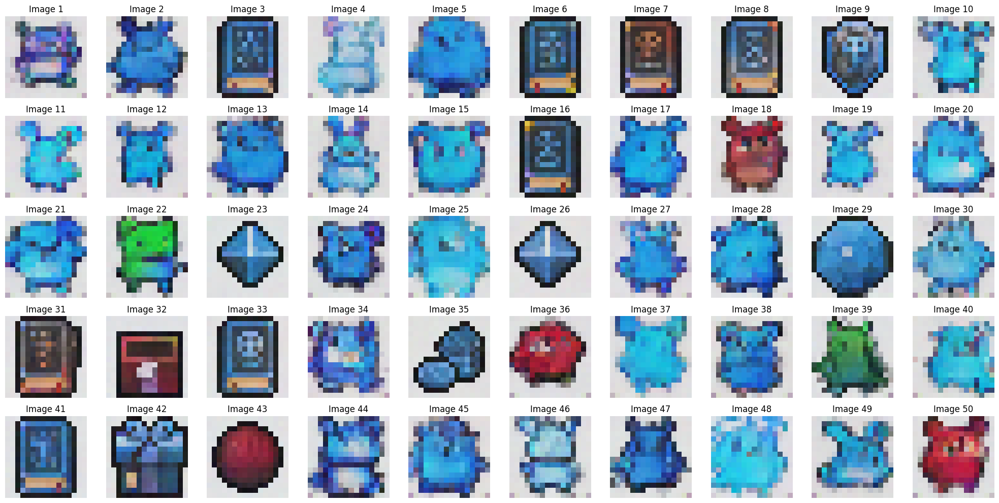

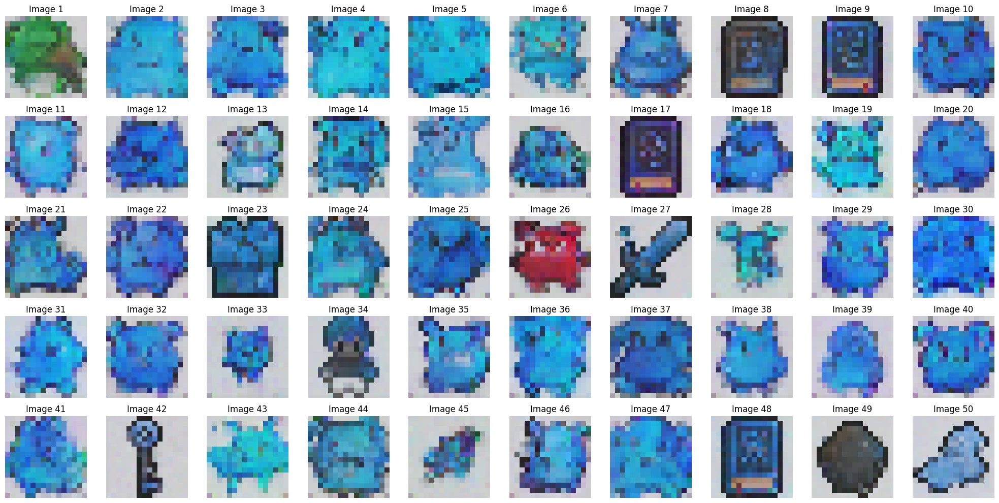

100%|██████████| 1/1 [00:00<00:00,  2.68it/s]


FID Score for DDPM at Epoch 31: 180.8201228953906


100%|██████████| 1/1 [00:00<00:00,  3.00it/s]


FID Score for DDIM at Epoch 31: 209.7991231613765

Epoch 32/40


Training: 100%|██████████| 716/716 [00:35<00:00, 20.45it/s]


Average Loss: 0.037968


DDPM Sampling: 1000it [00:07, 133.60it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 14it [00:00, 135.05it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step
Step 474/500: Deterministic step


DDIM Sampling: 42it [00:00, 130.13it/s]

Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step


DDIM Sampling: 70it [00:00, 131.83it/s]

Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step


DDIM Sampling: 98it [00:00, 127.41it/s]

Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step


DDIM Sampling: 124it [00:00, 126.45it/s]

Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step


DDIM Sampling: 151it [00:01, 127.49it/s]

Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step


DDIM Sampling: 178it [00:01, 129.22it/s]

Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step


DDIM Sampling: 205it [00:01, 128.82it/s]

Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step


DDIM Sampling: 231it [00:01, 119.78it/s]

Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step


DDIM Sampling: 244it [00:01, 117.06it/s]

Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step


DDIM Sampling: 257it [00:02, 120.38it/s]

Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step

DDIM Sampling: 270it [00:02, 122.88it/s]


Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step


DDIM Sampling: 284it [00:02, 125.41it/s]

Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step

DDIM Sampling: 298it [00:02, 126.93it/s]


Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step


DDIM Sampling: 311it [00:02, 127.72it/s]

Step 190/500: Deterministic step
Step 189/500: Deterministic step


DDIM Sampling: 325it [00:02, 128.66it/s]

Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step


DDIM Sampling: 338it [00:02, 127.69it/s]

Step 163/500: Deterministic step


DDIM Sampling: 351it [00:02, 124.91it/s]

Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step


DDIM Sampling: 364it [00:02, 125.42it/s]

Step 138/500: Deterministic step
Step 137/500: Deterministic step


DDIM Sampling: 377it [00:02, 124.06it/s]

Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step


DDIM Sampling: 390it [00:03, 124.99it/s]

Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step


DDIM Sampling: 403it [00:03, 125.40it/s]

Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step


DDIM Sampling: 417it [00:03, 127.59it/s]

Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step


DDIM Sampling: 431it [00:03, 129.09it/s]

Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step


DDIM Sampling: 459it [00:03, 131.18it/s]

Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step


DDIM Sampling: 486it [00:03, 129.52it/s]

Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step


DDIM Sampling: 500it [00:03, 126.69it/s]


Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


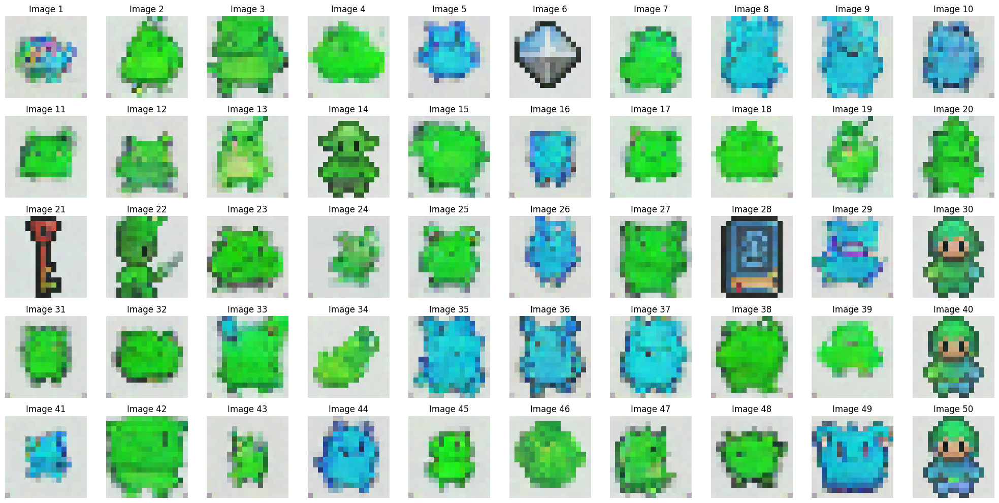

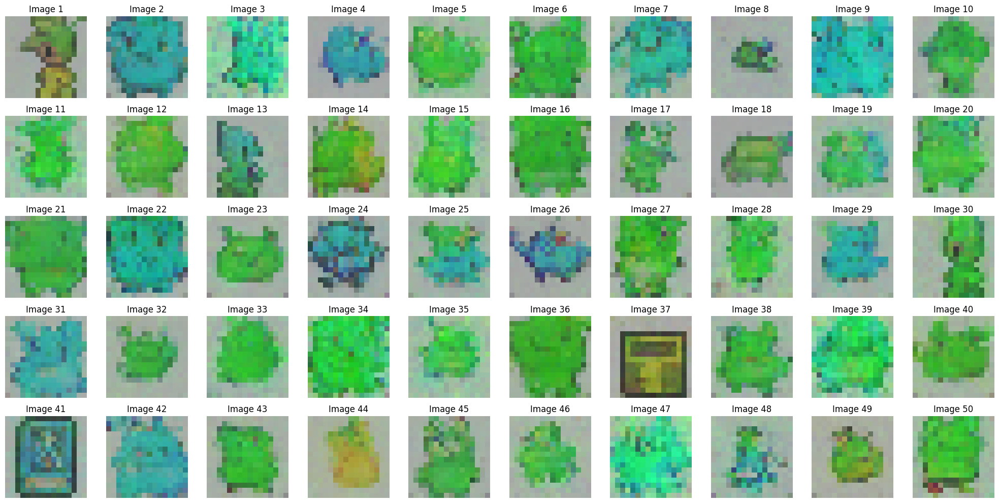

100%|██████████| 1/1 [00:00<00:00,  2.67it/s]


FID Score for DDPM at Epoch 32: 179.39225753218545


100%|██████████| 1/1 [00:00<00:00,  3.15it/s]


FID Score for DDIM at Epoch 32: 301.41868722186655

Epoch 33/40


Training: 100%|██████████| 716/716 [00:35<00:00, 20.16it/s]


Average Loss: 0.038000


DDPM Sampling: 1000it [00:07, 142.40it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 14it [00:00, 128.66it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step
Step 474/500: Deterministic step

DDIM Sampling: 40it [00:00, 126.02it/s]


Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step


DDIM Sampling: 67it [00:00, 123.48it/s]

Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step

DDIM Sampling: 94it [00:00, 123.55it/s]


Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step


DDIM Sampling: 121it [00:00, 127.34it/s]

Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step


DDIM Sampling: 147it [00:01, 125.83it/s]

Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step


DDIM Sampling: 173it [00:01, 125.74it/s]

Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step

DDIM Sampling: 200it [00:01, 126.77it/s]


Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step


DDIM Sampling: 227it [00:01, 125.54it/s]

Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step


DDIM Sampling: 254it [00:02, 128.08it/s]

Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step


DDIM Sampling: 280it [00:02, 127.94it/s]

Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step

DDIM Sampling: 307it [00:02, 127.87it/s]


Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step


DDIM Sampling: 333it [00:02, 126.98it/s]

Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step


DDIM Sampling: 360it [00:02, 124.74it/s]

Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step


DDIM Sampling: 386it [00:03, 126.74it/s]

Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step


DDIM Sampling: 412it [00:03, 127.83it/s]

Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step


DDIM Sampling: 425it [00:03, 113.79it/s]

Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step

DDIM Sampling: 449it [00:03, 111.82it/s]


Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step

DDIM Sampling: 474it [00:03, 111.36it/s]


Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step

DDIM Sampling: 500it [00:04, 122.37it/s]


Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


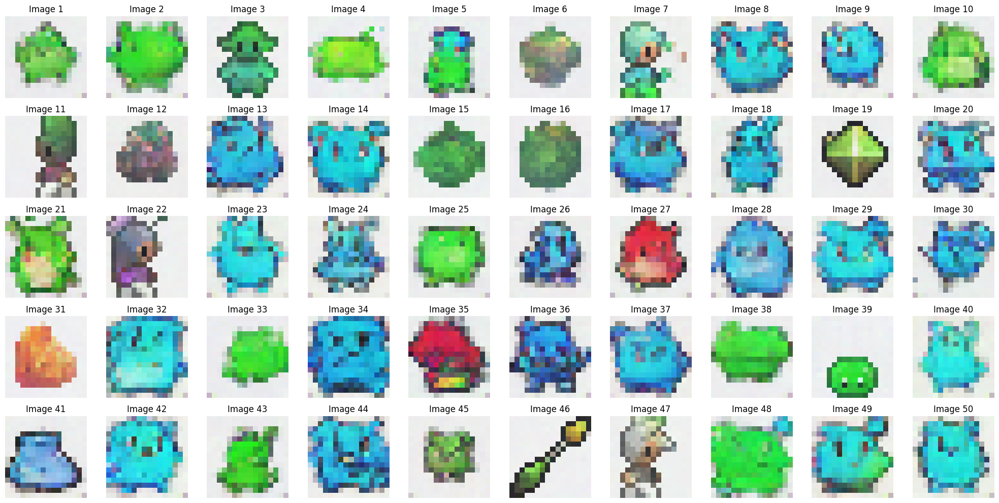

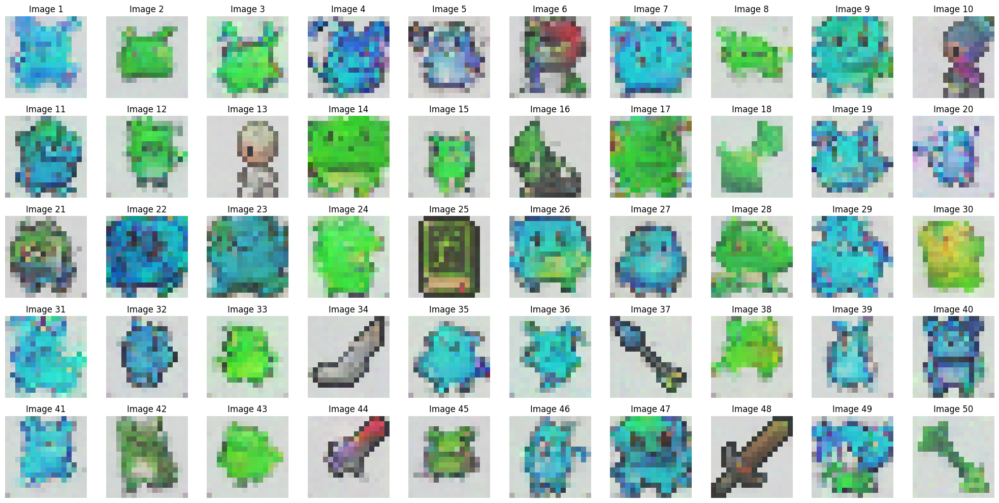

100%|██████████| 1/1 [00:00<00:00,  2.99it/s]


FID Score for DDPM at Epoch 33: 164.08642614283747


100%|██████████| 1/1 [00:00<00:00,  2.55it/s]


FID Score for DDIM at Epoch 33: 185.91804118880412

Epoch 34/40


Training: 100%|██████████| 716/716 [00:35<00:00, 20.42it/s]


Average Loss: 0.036916


DDPM Sampling: 1000it [00:06, 145.17it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 14it [00:00, 131.44it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step


DDIM Sampling: 41it [00:00, 109.56it/s]

Step 475/500: Deterministic step
Step 474/500: Deterministic step
Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step


DDIM Sampling: 64it [00:00, 102.46it/s]

Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step


DDIM Sampling: 86it [00:00, 101.14it/s]

Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step


DDIM Sampling: 98it [00:00, 103.62it/s]

Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step

DDIM Sampling: 120it [00:01, 99.10it/s]


Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step


DDIM Sampling: 145it [00:01, 109.63it/s]

Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step


DDIM Sampling: 171it [00:01, 116.99it/s]

Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step


DDIM Sampling: 197it [00:01, 121.95it/s]

Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step


DDIM Sampling: 210it [00:01, 112.34it/s]

Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step


DDIM Sampling: 233it [00:02, 104.93it/s]

Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step

DDIM Sampling: 259it [00:02, 113.96it/s]


Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step


DDIM Sampling: 283it [00:02, 109.10it/s]

Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step


DDIM Sampling: 305it [00:02, 106.80it/s]

Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step


DDIM Sampling: 327it [00:03, 99.85it/s] 

Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step


DDIM Sampling: 348it [00:03, 98.33it/s]

Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step


DDIM Sampling: 368it [00:03, 91.50it/s]

Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step


DDIM Sampling: 394it [00:03, 108.95it/s]

Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step


DDIM Sampling: 419it [00:03, 115.47it/s]

Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step


DDIM Sampling: 431it [00:04, 112.04it/s]

Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step


DDIM Sampling: 458it [00:04, 120.57it/s]

Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step


DDIM Sampling: 485it [00:04, 123.18it/s]

Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step


DDIM Sampling: 500it [00:04, 109.13it/s]


Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


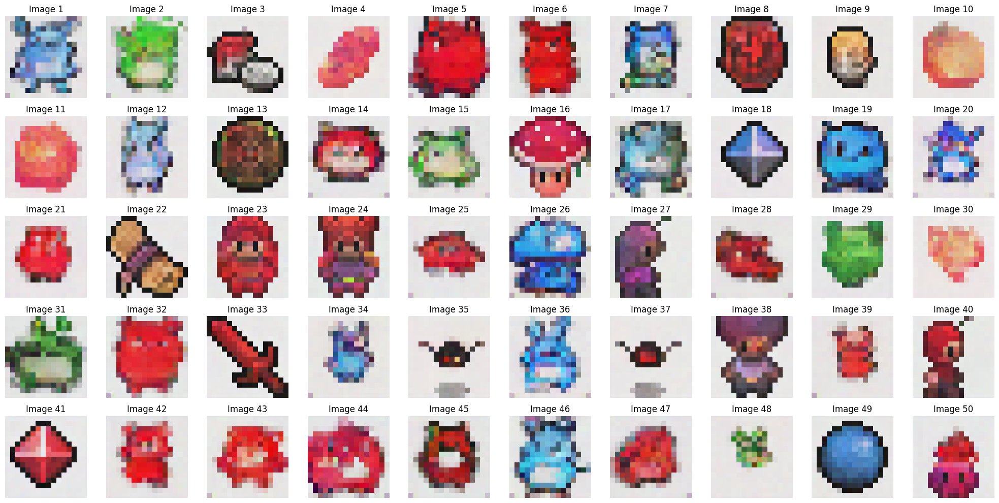

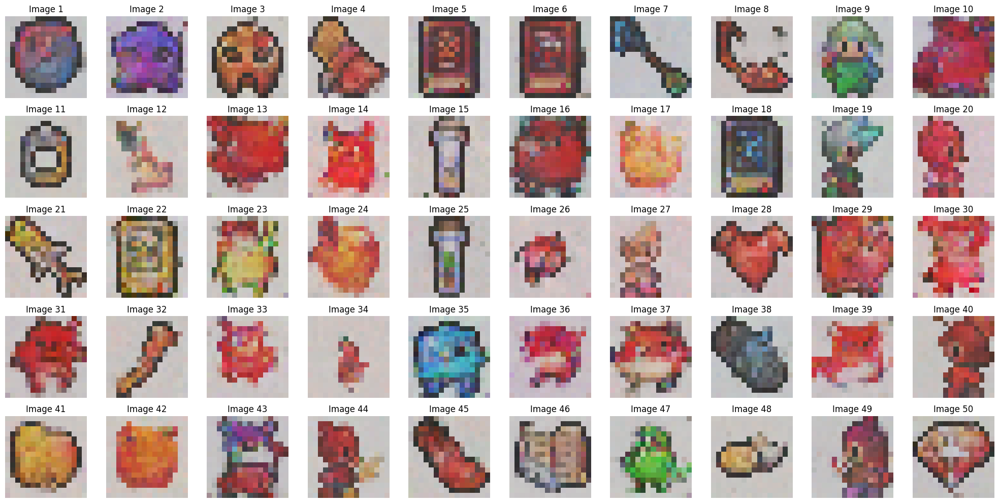

100%|██████████| 1/1 [00:00<00:00,  2.92it/s]


FID Score for DDPM at Epoch 34: 155.29109557261262


100%|██████████| 1/1 [00:00<00:00,  3.09it/s]


FID Score for DDIM at Epoch 34: 164.47114578042275

Epoch 35/40


Training: 100%|██████████| 716/716 [00:34<00:00, 20.59it/s]


Average Loss: 0.036714


DDPM Sampling: 1000it [00:07, 132.72it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 14it [00:00, 136.49it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step


DDIM Sampling: 42it [00:00, 126.26it/s]

Step 474/500: Deterministic step
Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step


DDIM Sampling: 68it [00:00, 126.13it/s]

Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step


DDIM Sampling: 94it [00:00, 124.97it/s]

Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step


DDIM Sampling: 120it [00:00, 121.74it/s]

Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step


DDIM Sampling: 146it [00:01, 117.91it/s]

Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step


DDIM Sampling: 172it [00:01, 122.66it/s]

Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step


DDIM Sampling: 198it [00:01, 124.95it/s]

Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step


DDIM Sampling: 225it [00:01, 125.18it/s]

Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step


DDIM Sampling: 251it [00:02, 124.98it/s]

Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step


DDIM Sampling: 277it [00:02, 123.09it/s]

Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step


DDIM Sampling: 304it [00:02, 126.33it/s]

Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step


DDIM Sampling: 331it [00:02, 126.09it/s]

Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step


DDIM Sampling: 358it [00:02, 127.83it/s]

Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step


DDIM Sampling: 371it [00:02, 127.83it/s]

Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step

DDIM Sampling: 398it [00:03, 124.74it/s]


Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step


DDIM Sampling: 424it [00:03, 125.93it/s]

Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step


DDIM Sampling: 450it [00:03, 125.50it/s]

Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step


DDIM Sampling: 477it [00:03, 128.31it/s]

Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step


DDIM Sampling: 500it [00:03, 125.02it/s]


Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


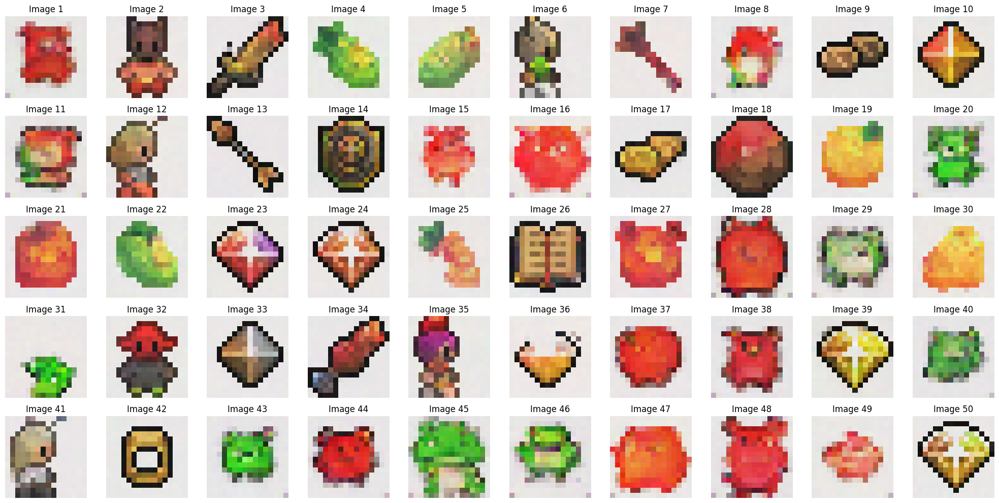

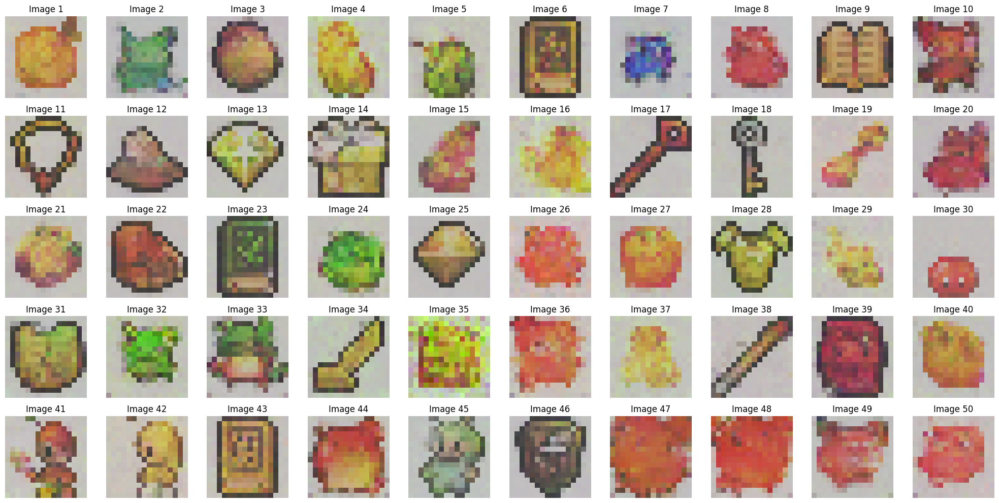

100%|██████████| 1/1 [00:00<00:00,  2.92it/s]


FID Score for DDPM at Epoch 35: 156.280875103053


100%|██████████| 1/1 [00:00<00:00,  2.71it/s]


FID Score for DDIM at Epoch 35: 189.74983870955106

Epoch 36/40


Training: 100%|██████████| 716/716 [00:35<00:00, 20.38it/s]


Average Loss: 0.036941


DDPM Sampling: 1000it [00:07, 142.42it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 14it [00:00, 131.34it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step
Step 474/500: Deterministic step


DDIM Sampling: 42it [00:00, 129.91it/s]

Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step


DDIM Sampling: 68it [00:00, 124.19it/s]

Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step


DDIM Sampling: 94it [00:00, 117.68it/s]

Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step


DDIM Sampling: 120it [00:00, 121.19it/s]

Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step

DDIM Sampling: 145it [00:01, 111.78it/s]


Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step

DDIM Sampling: 169it [00:01, 112.71it/s]


Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step


DDIM Sampling: 181it [00:01, 109.46it/s]

Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step


DDIM Sampling: 203it [00:01, 102.96it/s]

Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step


DDIM Sampling: 228it [00:01, 112.51it/s]

Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step


DDIM Sampling: 253it [00:02, 110.03it/s]

Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step


DDIM Sampling: 277it [00:02, 109.67it/s]

Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step


DDIM Sampling: 301it [00:02, 110.37it/s]

Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step


DDIM Sampling: 326it [00:02, 113.40it/s]

Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step


DDIM Sampling: 339it [00:02, 116.24it/s]

Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step

DDIM Sampling: 366it [00:03, 122.05it/s]


Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step


DDIM Sampling: 391it [00:03, 111.79it/s]

Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step


DDIM Sampling: 414it [00:03, 106.77it/s]

Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step


DDIM Sampling: 441it [00:03, 117.83it/s]

Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step


DDIM Sampling: 468it [00:04, 124.83it/s]

Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step


DDIM Sampling: 496it [00:04, 126.98it/s]

Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step


DDIM Sampling: 500it [00:04, 115.53it/s]


Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


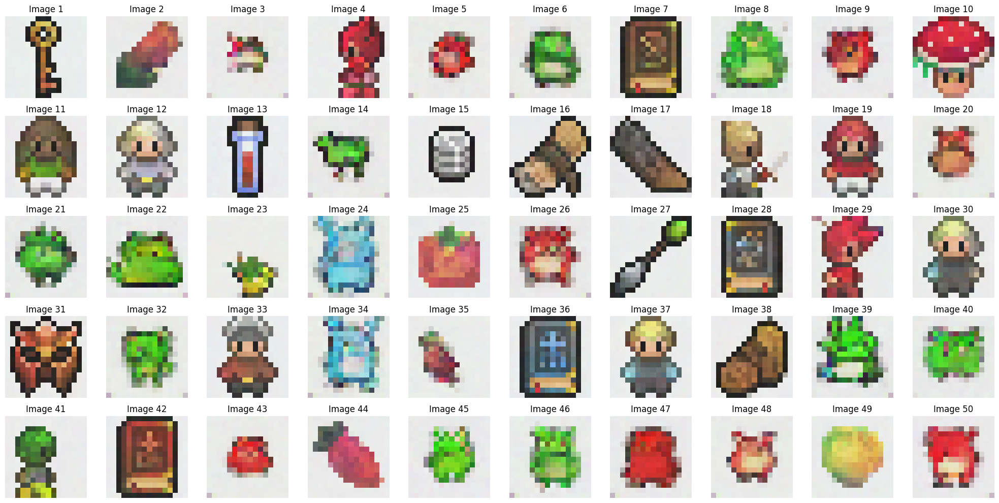

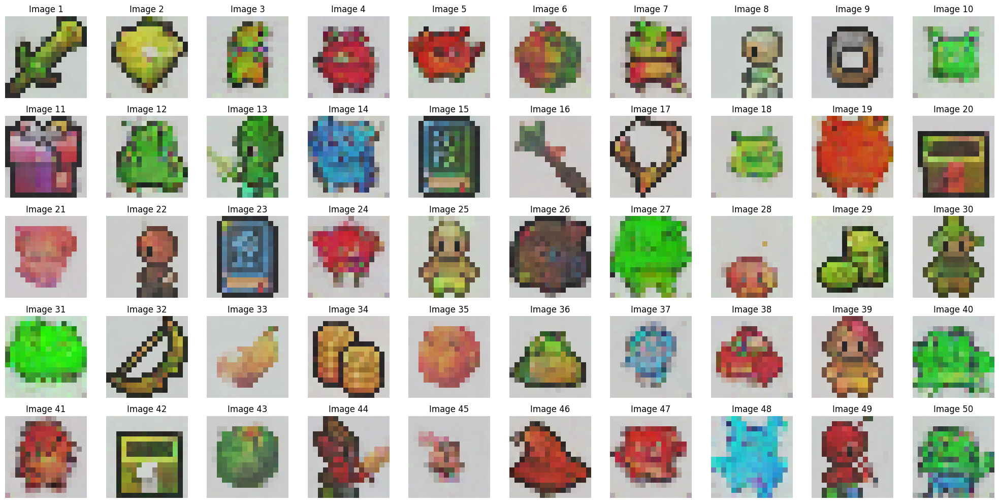

100%|██████████| 1/1 [00:00<00:00,  2.84it/s]


FID Score for DDPM at Epoch 36: 132.95097382072376


100%|██████████| 1/1 [00:00<00:00,  3.03it/s]


FID Score for DDIM at Epoch 36: 149.1759892028158

Epoch 37/40


Training: 100%|██████████| 716/716 [00:35<00:00, 20.28it/s]


Average Loss: 0.036330


DDPM Sampling: 1000it [00:07, 139.31it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 14it [00:00, 132.03it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step
Step 474/500: Deterministic step


DDIM Sampling: 42it [00:00, 132.78it/s]

Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step


DDIM Sampling: 70it [00:00, 131.69it/s]

Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step


DDIM Sampling: 98it [00:00, 131.22it/s]

Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step


DDIM Sampling: 125it [00:00, 119.83it/s]

Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step


DDIM Sampling: 152it [00:01, 125.46it/s]

Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step


DDIM Sampling: 179it [00:01, 129.25it/s]

Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step

DDIM Sampling: 207it [00:01, 131.63it/s]


Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step


DDIM Sampling: 235it [00:01, 130.57it/s]

Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step


DDIM Sampling: 249it [00:01, 124.69it/s]

Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step

DDIM Sampling: 262it [00:02, 121.98it/s]


Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step


DDIM Sampling: 275it [00:02, 123.53it/s]

Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step


DDIM Sampling: 288it [00:02, 125.30it/s]

Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step


DDIM Sampling: 302it [00:02, 127.07it/s]

Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step


DDIM Sampling: 315it [00:02, 126.83it/s]

Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step


DDIM Sampling: 329it [00:02, 128.73it/s]

Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step

DDIM Sampling: 357it [00:02, 130.64it/s]


Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step


DDIM Sampling: 384it [00:03, 124.99it/s]

Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step


DDIM Sampling: 411it [00:03, 124.63it/s]

Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step


DDIM Sampling: 439it [00:03, 128.95it/s]

Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step


DDIM Sampling: 466it [00:03, 126.38it/s]

Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step


DDIM Sampling: 479it [00:03, 120.66it/s]

Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step


DDIM Sampling: 492it [00:03, 116.56it/s]

Step 10/500: Deterministic step
Step 9/500: Deterministic step


DDIM Sampling: 500it [00:03, 125.02it/s]

Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


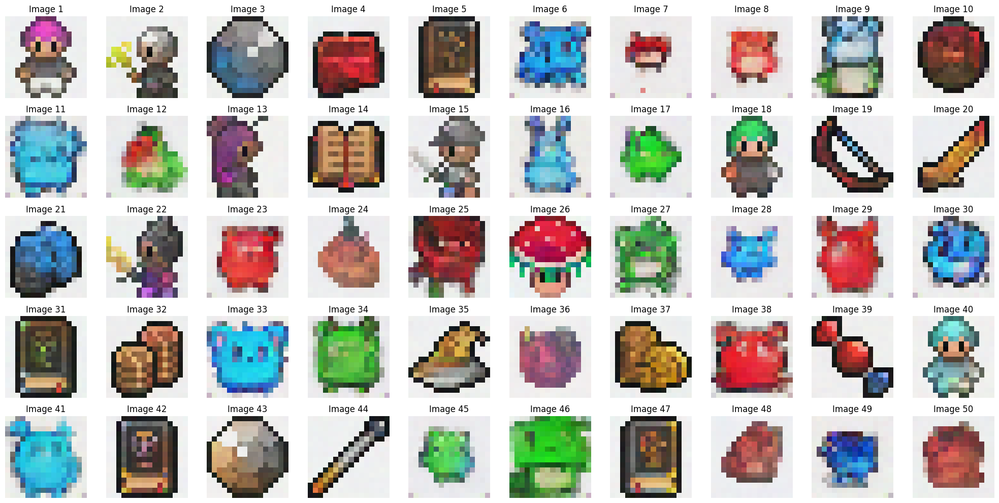

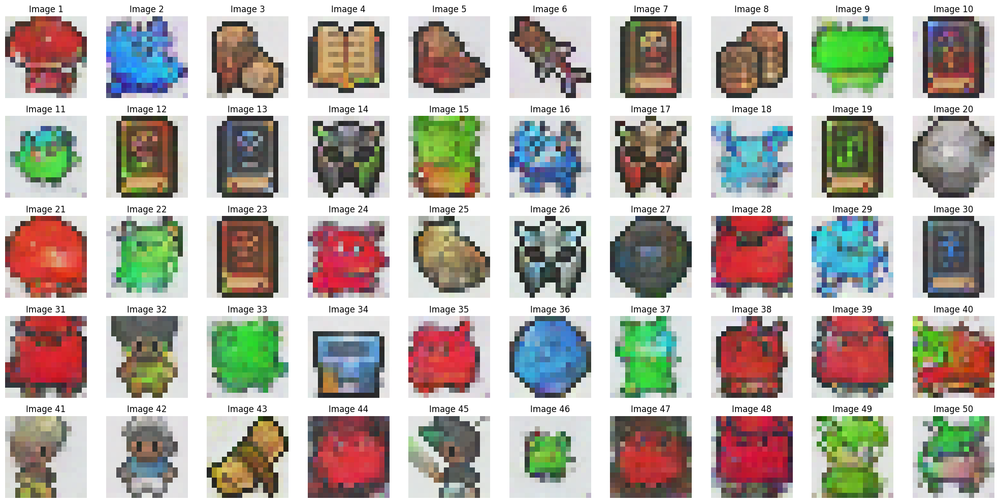

100%|██████████| 1/1 [00:00<00:00,  2.83it/s]


FID Score for DDPM at Epoch 37: 139.83931175363827


100%|██████████| 1/1 [00:00<00:00,  2.97it/s]


FID Score for DDIM at Epoch 37: 172.32155816795864

Epoch 38/40


Training: 100%|██████████| 716/716 [00:34<00:00, 20.74it/s]


Average Loss: 0.036909


DDPM Sampling: 1000it [00:07, 137.16it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 14it [00:00, 134.84it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step
Step 474/500: Deterministic step


DDIM Sampling: 42it [00:00, 130.88it/s]

Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step

DDIM Sampling: 69it [00:00, 126.35it/s]


Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step


DDIM Sampling: 96it [00:00, 128.02it/s]

Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step


DDIM Sampling: 122it [00:00, 117.96it/s]

Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step


DDIM Sampling: 149it [00:01, 124.61it/s]

Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step


DDIM Sampling: 176it [00:01, 126.72it/s]

Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step


DDIM Sampling: 202it [00:01, 123.15it/s]

Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step


DDIM Sampling: 228it [00:01, 125.76it/s]

Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step


DDIM Sampling: 254it [00:02, 125.88it/s]

Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step


DDIM Sampling: 281it [00:02, 128.73it/s]

Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step


DDIM Sampling: 308it [00:02, 129.70it/s]

Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step


DDIM Sampling: 321it [00:02, 125.96it/s]

Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step


DDIM Sampling: 348it [00:02, 125.42it/s]

Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step


DDIM Sampling: 375it [00:02, 125.80it/s]

Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step


DDIM Sampling: 401it [00:03, 126.65it/s]

Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step


DDIM Sampling: 428it [00:03, 128.56it/s]

Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step


DDIM Sampling: 455it [00:03, 127.95it/s]

Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step

DDIM Sampling: 481it [00:03, 127.11it/s]


Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step


DDIM Sampling: 500it [00:03, 125.94it/s]


Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


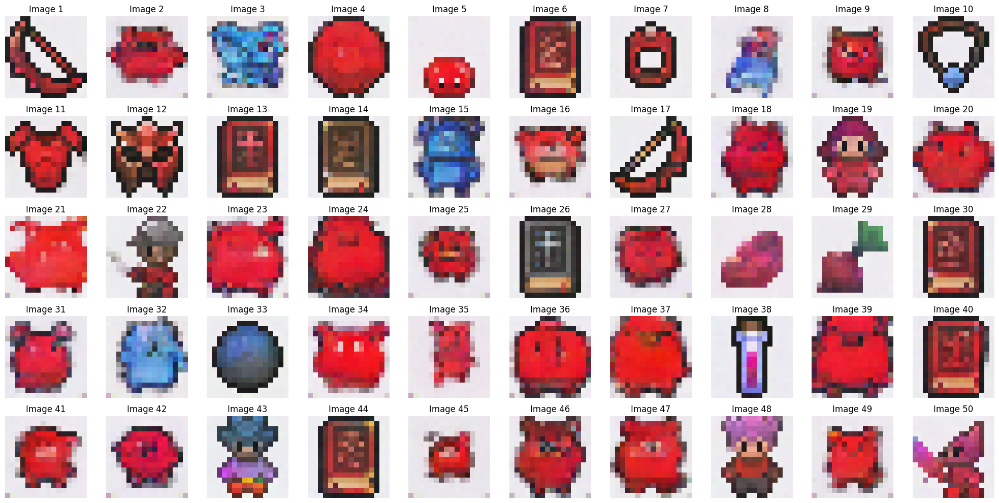

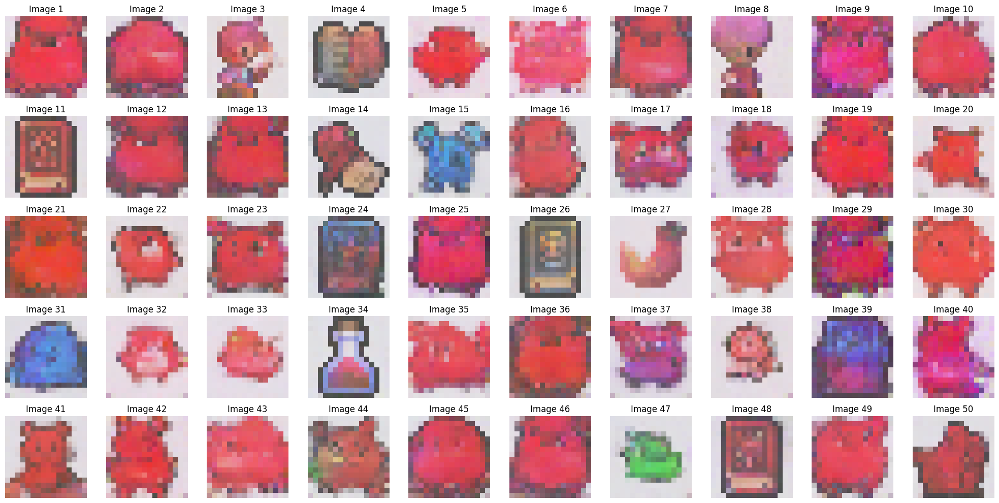

100%|██████████| 1/1 [00:00<00:00,  3.03it/s]


FID Score for DDPM at Epoch 38: 164.07094371576648


100%|██████████| 1/1 [00:00<00:00,  3.00it/s]


FID Score for DDIM at Epoch 38: 219.77584471747997

Epoch 39/40


Training: 100%|██████████| 716/716 [00:34<00:00, 20.92it/s]


Average Loss: 0.035625


DDPM Sampling: 1000it [00:07, 133.67it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 13it [00:00, 127.71it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step


DDIM Sampling: 27it [00:00, 131.27it/s]

Step 475/500: Deterministic step
Step 474/500: Deterministic step


DDIM Sampling: 41it [00:00, 130.90it/s]

Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step


DDIM Sampling: 69it [00:00, 128.42it/s]

Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step


DDIM Sampling: 96it [00:00, 129.69it/s]

Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step


DDIM Sampling: 122it [00:00, 126.98it/s]

Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step


DDIM Sampling: 149it [00:01, 121.86it/s]

Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step


DDIM Sampling: 176it [00:01, 124.00it/s]

Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step


DDIM Sampling: 203it [00:01, 124.56it/s]

Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step


DDIM Sampling: 229it [00:01, 125.78it/s]

Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step


DDIM Sampling: 255it [00:02, 123.49it/s]

Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step


DDIM Sampling: 281it [00:02, 125.07it/s]

Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step


DDIM Sampling: 308it [00:02, 127.84it/s]

Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step


DDIM Sampling: 321it [00:02, 124.04it/s]

Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step


DDIM Sampling: 335it [00:02, 127.11it/s]

Step 166/500: Deterministic step
Step 165/500: Deterministic step


DDIM Sampling: 348it [00:02, 125.42it/s]

Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step


DDIM Sampling: 361it [00:02, 125.61it/s]

Step 141/500: Deterministic step
Step 140/500: Deterministic step


DDIM Sampling: 374it [00:02, 125.95it/s]

Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step


DDIM Sampling: 400it [00:03, 125.55it/s]

Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step


DDIM Sampling: 413it [00:03, 124.24it/s]

Step 89/500: Deterministic step
Step 88/500: Deterministic step


DDIM Sampling: 426it [00:03, 124.45it/s]

Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step


DDIM Sampling: 439it [00:03, 124.77it/s]

Step 63/500: Deterministic step
Step 62/500: Deterministic step


DDIM Sampling: 452it [00:03, 120.76it/s]

Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step


DDIM Sampling: 479it [00:03, 121.63it/s]

Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step


DDIM Sampling: 500it [00:04, 124.38it/s]


Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


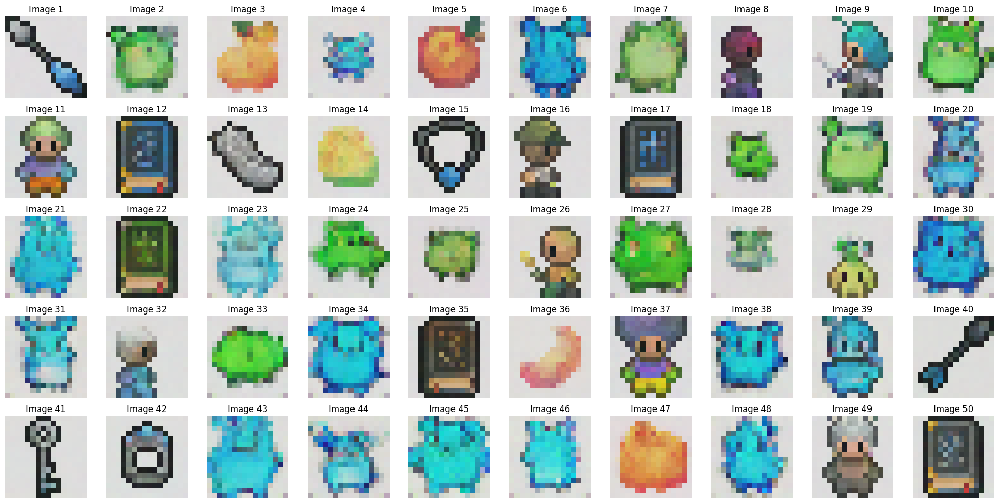

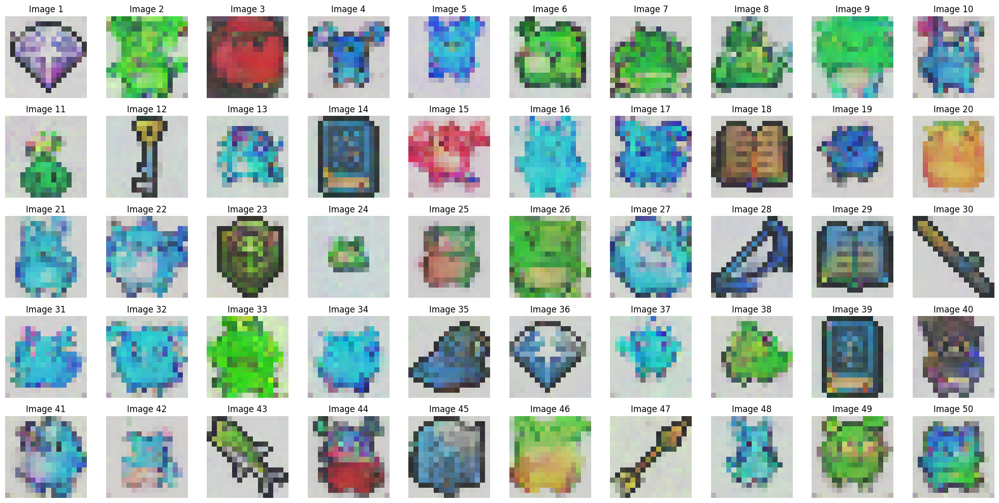

100%|██████████| 1/1 [00:00<00:00,  2.97it/s]


FID Score for DDPM at Epoch 39: 160.57762650949908


100%|██████████| 1/1 [00:00<00:00,  2.96it/s]


FID Score for DDIM at Epoch 39: 178.8487068526901

Epoch 40/40


Training: 100%|██████████| 716/716 [00:35<00:00, 20.01it/s]


Average Loss: 0.035344


DDPM Sampling: 1000it [00:06, 143.76it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 13it [00:00, 129.37it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step


DDIM Sampling: 26it [00:00, 127.90it/s]

Step 475/500: Deterministic step


DDIM Sampling: 39it [00:00, 118.33it/s]

Step 474/500: Deterministic step
Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step


DDIM Sampling: 66it [00:00, 126.03it/s]

Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step


DDIM Sampling: 94it [00:00, 129.98it/s]

Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step


DDIM Sampling: 121it [00:00, 121.49it/s]

Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step


DDIM Sampling: 148it [00:01, 125.63it/s]

Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step


DDIM Sampling: 174it [00:01, 124.33it/s]

Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step

DDIM Sampling: 201it [00:01, 128.05it/s]


Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step


DDIM Sampling: 227it [00:01, 125.76it/s]

Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step


DDIM Sampling: 255it [00:02, 128.59it/s]

Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step


DDIM Sampling: 283it [00:02, 130.42it/s]

Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step


DDIM Sampling: 310it [00:02, 126.25it/s]

Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step


DDIM Sampling: 337it [00:02, 128.65it/s]

Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step


DDIM Sampling: 350it [00:02, 126.97it/s]

Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step


DDIM Sampling: 390it [00:03, 127.17it/s]

Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step


DDIM Sampling: 418it [00:03, 129.89it/s]

Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step


DDIM Sampling: 431it [00:03, 128.51it/s]

Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step


DDIM Sampling: 457it [00:03, 118.37it/s]

Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step


DDIM Sampling: 481it [00:03, 112.08it/s]

Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step


DDIM Sampling: 500it [00:04, 123.86it/s]


Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


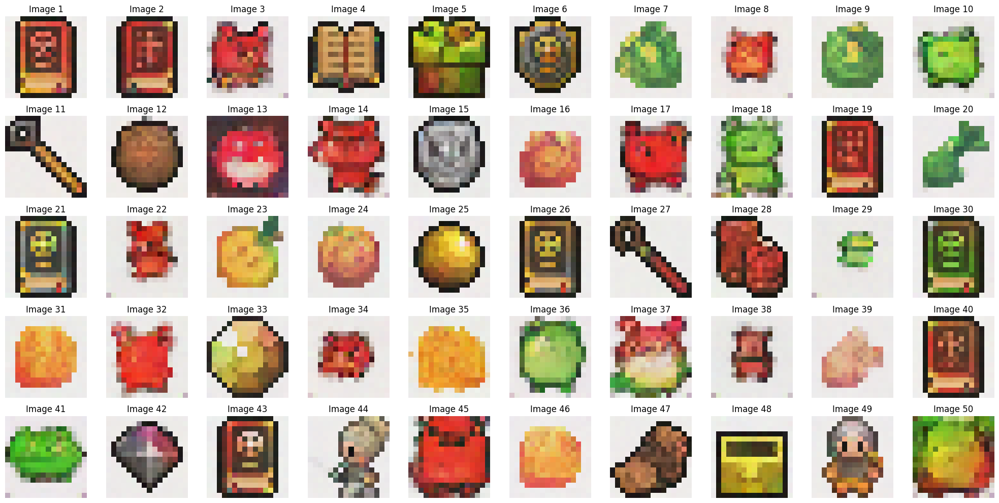

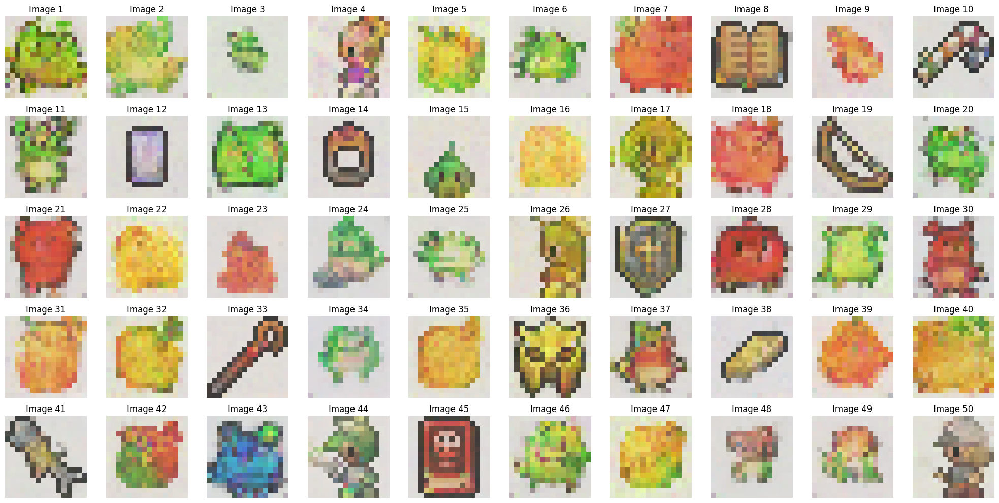

100%|██████████| 1/1 [00:00<00:00,  3.09it/s]


FID Score for DDPM at Epoch 40: 161.85769883524122


100%|██████████| 1/1 [00:00<00:00,  2.57it/s]


FID Score for DDIM at Epoch 40: 194.07722617842623


ValueError: x and y must have same first dimension, but have shapes (40,) and (43,)

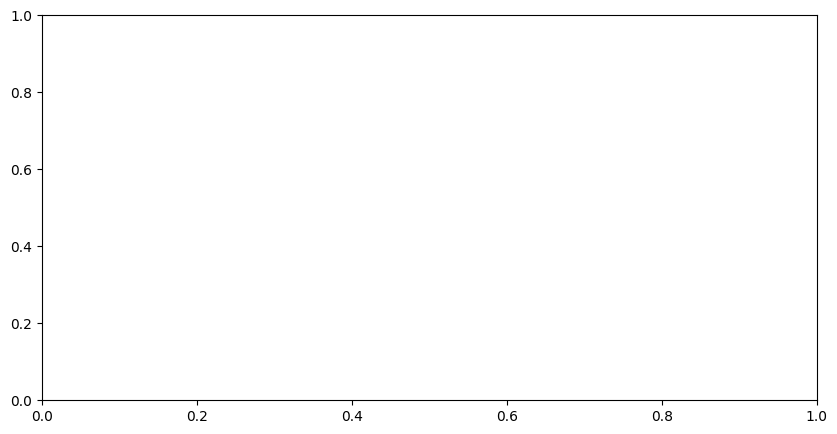

In [ ]:
for ep in range(n_epoch):
    print(f"\nEpoch {ep+1}/{n_epoch}")
    epoch_loss = 0.0
    nn_model.train()

    for batch_idx, (x0, _) in enumerate(tqdm(train_dataloader, desc="Training")):
        x0 = x0.to(device)
        batch_size_current = x0.size(0)
        t = torch.randint(0, timesteps, (batch_size_current,), device=device).long()
        xt, noise = perturb_input(x0, t, alpha_bar)
        t_normalized = t.float() / timesteps
        noise_pred = nn_model(xt, t_normalized)
        loss = F.mse_loss(noise_pred, noise)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()

    avg_loss = epoch_loss / len(train_dataloader)
    loss_history.append(avg_loss)
    print(f"Average Loss: {avg_loss:.6f}")

    n_sample = 50
    nn_model.eval()

    samples_ddpm = sample_ddpm(
        nn_model, n_sample, timesteps, beta, alpha, alpha_bar, device, height=height
    ).cpu()
    samples_ddim = sample_ddim(
        nn_model,
        n_sample,
        timesteps,
        beta,
        alpha,
        alpha_bar,
        device,
        height=height,
        eta=0.0,
        n_steps=500,
    ).cpu()

    ddpm_epoch_dir = os.path.join(save_dir_ddpm, f"epoch_{ep+1}")
    ddim_epoch_dir = os.path.join(save_dir_ddim, f"epoch_{ep+1}")
    os.makedirs(ddpm_epoch_dir, exist_ok=True)
    os.makedirs(ddim_epoch_dir, exist_ok=True)

    for i in range(n_sample):
        save_image(samples_ddpm[i], os.path.join(ddpm_epoch_dir, f"ddpm_{i}.png"))
    plot_sample(samples_ddpm, n_sample, nrows=5)
    plt.savefig(os.path.join(ddpm_epoch_dir, "ddpm_samples.png"))
    plt.close()

    for i in range(n_sample):
        save_image(samples_ddim[i], os.path.join(ddim_epoch_dir, f"ddim_{i}.png"))
    plot_sample(samples_ddim, n_sample, nrows=5)
    plt.savefig(os.path.join(ddim_epoch_dir, "ddim_samples.png"))
    plt.close()

    real_batch, _ = next(iter(val_dataloader))
    real_batch = real_batch[:n_sample].to(device)

    fid_ddpm = compute_fid(real_batch.cpu(), samples_ddpm)
    fid_history_ddpm.append(fid_ddpm)
    print(f"FID Score for DDPM at Epoch {ep+1}: {fid_ddpm}")

    fid_ddim = compute_fid(real_batch.cpu(), samples_ddim)
    fid_history_ddim.append(fid_ddim)
    print(f"FID Score for DDIM at Epoch {ep+1}: {fid_ddim}")
    assert len(fid_history_ddpm) == len(
        fid_history_ddim
    ), f"FID history mismatch: {len(fid_history_ddpm)} != {len(fid_history_ddim)}"


plt.figure(figsize=(10, 5))
plt.plot(range(1, ep + 2), fid_history_ddpm, label="FID DDPM")
plt.plot(range(1, ep + 2), fid_history_ddim, label="FID DDIM")
plt.xlabel("Epoch")
plt.ylabel("FID Score")
plt.title("FID Scores over Epochs")
plt.legend()
plt.savefig(os.path.join(save_dir, "fid_scores.png"))
plt.close()

## Training Loop

This cell contains the main training loop for the diffusion model. It iterates over epochs, perturbs images with noise, trains the U-Net to predict the noise, generates samples using DDPM and DDIM, computes FID scores, and saves results.

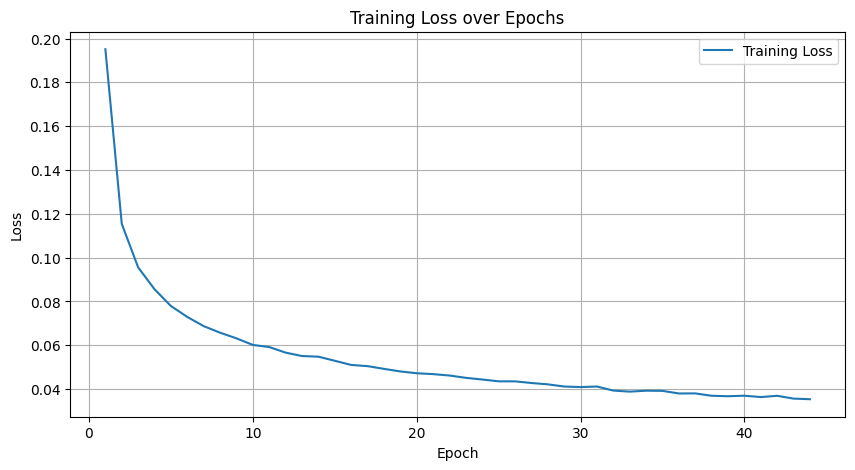


Generating final samples using DDPM and DDIM...


DDPM Sampling: 1000it [00:06, 162.66it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 15it [00:00, 144.92it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step
Step 474/500: Deterministic step
Step 473/500: Deterministic step


DDIM Sampling: 30it [00:00, 144.17it/s]

Step 472/500: Deterministic step
Step 471/500: Deterministic step


DDIM Sampling: 45it [00:00, 136.47it/s]

Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step


DDIM Sampling: 74it [00:00, 139.10it/s]

Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step


DDIM Sampling: 103it [00:00, 142.02it/s]

Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step


DDIM Sampling: 133it [00:00, 139.69it/s]

Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step


DDIM Sampling: 161it [00:01, 128.87it/s]

Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step

DDIM Sampling: 187it [00:01, 124.49it/s]


Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step


DDIM Sampling: 213it [00:01, 123.51it/s]

Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step


DDIM Sampling: 240it [00:01, 126.21it/s]

Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step


DDIM Sampling: 267it [00:02, 128.51it/s]

Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step


DDIM Sampling: 294it [00:02, 130.10it/s]

Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step


DDIM Sampling: 308it [00:02, 126.60it/s]

Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step


DDIM Sampling: 321it [00:02, 118.93it/s]

Step 180/500: Deterministic step


DDIM Sampling: 333it [00:02, 116.71it/s]

Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step


DDIM Sampling: 359it [00:02, 118.26it/s]

Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step


DDIM Sampling: 383it [00:03, 115.13it/s]

Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step


DDIM Sampling: 408it [00:03, 117.93it/s]

Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step


DDIM Sampling: 432it [00:03, 110.90it/s]

Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step


DDIM Sampling: 459it [00:03, 119.75it/s]

Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step


DDIM Sampling: 488it [00:03, 130.67it/s]

Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step


DDIM Sampling: 500it [00:03, 126.28it/s]


Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


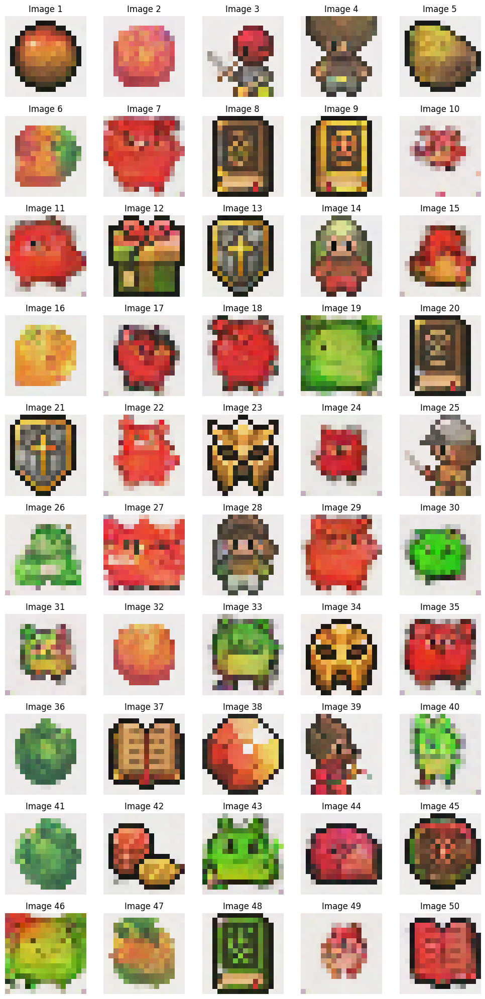

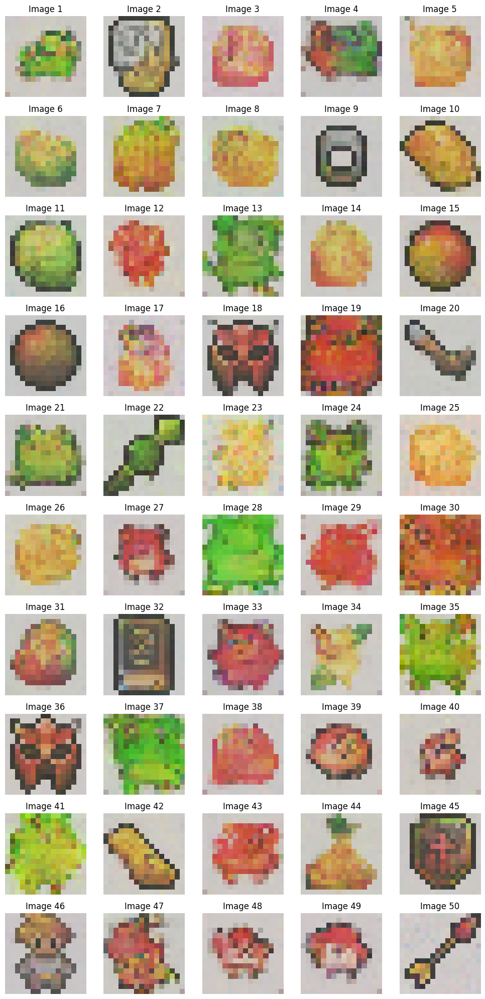

100%|██████████| 1/1 [00:00<00:00,  3.21it/s]


Final FID Score for DDPM: 162.0255772645357


100%|██████████| 1/1 [00:00<00:00,  2.81it/s]


Final FID Score for DDIM: 200.27266581052746

Training and sampling completed successfully.


In [ ]:
plt.figure(figsize=(10, 5))
plt.plot(range(1, len(loss_history) + 1), loss_history, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss over Epochs')
plt.legend()
plt.grid(True)
plt.show()


print("\nGenerating final samples using DDPM and DDIM...")

final_samples_ddpm = sample_ddpm(nn_model, n_sample=50, timesteps=timesteps, beta=beta, alpha=alpha, alpha_bar=alpha_bar, device=device, height=height).cpu()
final_samples_ddim = sample_ddim(nn_model, n_sample=50, timesteps=timesteps, beta=beta, alpha=alpha, alpha_bar=alpha_bar, device=device, height=height, eta=0.0, n_steps=500).cpu()

final_ddpm_dir = os.path.join(save_dir_ddpm, 'final')
final_ddim_dir = os.path.join(save_dir_ddim, 'final')
os.makedirs(final_ddpm_dir, exist_ok=True)
os.makedirs(final_ddim_dir, exist_ok=True)

for i in range(50):
    save_image(final_samples_ddpm[i], os.path.join(final_ddpm_dir, f'ddpm_final_{i}.png'))
plot_sample(final_samples_ddpm, 50, nrows=10)
plt.savefig(os.path.join(final_ddpm_dir, 'ddpm_final_samples.png'))
plt.close()

for i in range(50):
    save_image(final_samples_ddim[i], os.path.join(final_ddim_dir, f'ddim_final_{i}.png'))
plot_sample(final_samples_ddim, 50, nrows=10)
plt.savefig(os.path.join(final_ddim_dir, 'ddim_final_samples.png'))
plt.close()

real_final_batch, _ = next(iter(val_dataloader))
real_final_batch = real_final_batch[:50].to(device)

final_fid_ddpm = compute_fid(real_final_batch.cpu(), final_samples_ddpm)
print(f"Final FID Score for DDPM: {final_fid_ddpm}")

final_fid_ddim = compute_fid(real_final_batch.cpu(), final_samples_ddim)
print(f"Final FID Score for DDIM: {final_fid_ddim}")

print("\nTraining and sampling completed successfully.")





## Training Results Visualization

This cell plots the training loss over epochs and generates final samples using both DDPM and DDIM methods. It computes final FID scores and saves the results.

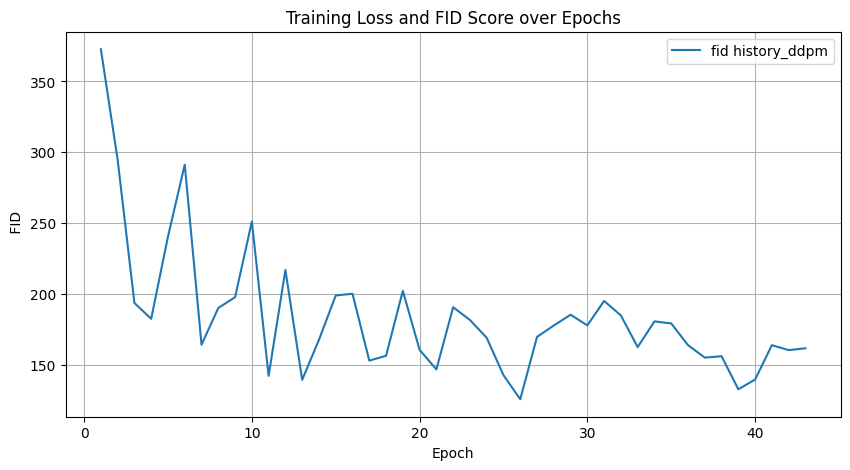

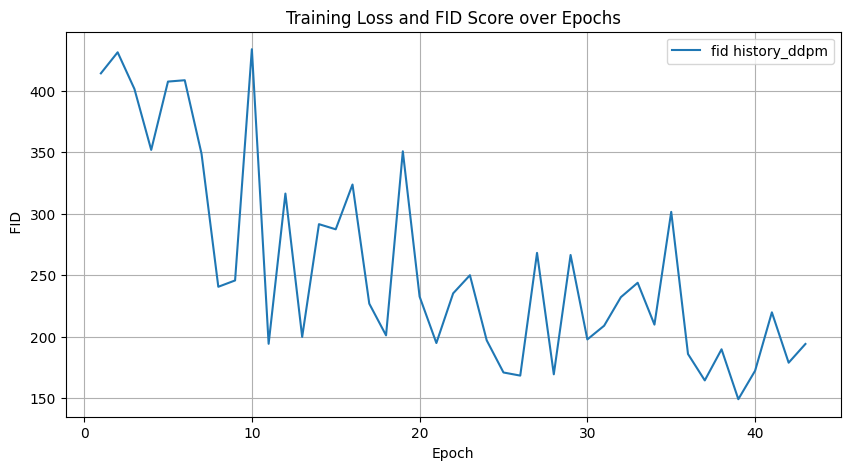

In [ ]:

import os
import time
import numpy as np
import matplotlib.pyplot as plt
from typing import Tuple
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torchvision.utils import save_image
from tqdm import tqdm
from pytorch_fid import fid_score


plt.figure(figsize=(10, 5))
plt.plot(range(1, len(fid_history_ddpm) + 1), fid_history_ddpm, label='fid history_ddpm')
plt.xlabel('Epoch')
plt.ylabel(' FID')
plt.title('Training Loss and FID Score over Epochs')
plt.legend()
plt.grid(True)
plt.show()




plt.figure(figsize=(10, 5))
plt.plot(range(1, len(fid_history_ddim) + 1), fid_history_ddim, label='fid history_ddpm')
plt.xlabel('Epoch')
plt.ylabel(' FID')
plt.title('Training Loss and FID Score over Epochs')
plt.legend()
plt.grid(True)
plt.show()




Generating final samples using DDPM and DDIM...


DDPM Sampling: 1000it [00:06, 162.67it/s]


Starting DDIM sampling with 400 steps (step size: 2)


DDIM Sampling: 16it [00:00, 151.13it/s]

Step 400/400: Deterministic step
Step 399/400: Deterministic step
Step 398/400: Deterministic step
Step 397/400: Deterministic step
Step 396/400: Deterministic step
Step 395/400: Deterministic step
Step 394/400: Deterministic step
Step 393/400: Deterministic step
Step 392/400: Deterministic step
Step 391/400: Deterministic step
Step 390/400: Deterministic step
Step 389/400: Deterministic step
Step 388/400: Deterministic step
Step 387/400: Deterministic step
Step 386/400: Deterministic step
Step 385/400: Deterministic step
Step 384/400: Deterministic step
Step 383/400: Deterministic step
Step 382/400: Deterministic step
Step 381/400: Deterministic step
Step 380/400: Deterministic step
Step 379/400: Deterministic step
Step 378/400: Deterministic step
Step 377/400: Deterministic step
Step 376/400: Deterministic step
Step 375/400: Deterministic step
Step 374/400: Deterministic step
Step 373/400: Deterministic step
Step 372/400: Deterministic step
Step 371/400: Deterministic step


DDIM Sampling: 47it [00:00, 145.14it/s]

Step 370/400: Deterministic step
Step 369/400: Deterministic step
Step 368/400: Deterministic step
Step 367/400: Deterministic step
Step 366/400: Deterministic step
Step 365/400: Deterministic step
Step 364/400: Deterministic step
Step 363/400: Deterministic step
Step 362/400: Deterministic step
Step 361/400: Deterministic step
Step 360/400: Deterministic step
Step 359/400: Deterministic step
Step 358/400: Deterministic step
Step 357/400: Deterministic step
Step 356/400: Deterministic step
Step 355/400: Deterministic step
Step 354/400: Deterministic step
Step 353/400: Deterministic step
Step 352/400: Deterministic step
Step 351/400: Deterministic step
Step 350/400: Deterministic step
Step 349/400: Deterministic step
Step 348/400: Deterministic step
Step 347/400: Deterministic step
Step 346/400: Deterministic step
Step 345/400: Deterministic step
Step 344/400: Deterministic step
Step 343/400: Deterministic step
Step 342/400: Deterministic step


DDIM Sampling: 77it [00:00, 143.19it/s]

Step 341/400: Deterministic step
Step 340/400: Deterministic step
Step 339/400: Deterministic step
Step 338/400: Deterministic step
Step 337/400: Deterministic step
Step 336/400: Deterministic step
Step 335/400: Deterministic step
Step 334/400: Deterministic step
Step 333/400: Deterministic step
Step 332/400: Deterministic step
Step 331/400: Deterministic step
Step 330/400: Deterministic step
Step 329/400: Deterministic step
Step 328/400: Deterministic step
Step 327/400: Deterministic step
Step 326/400: Deterministic step
Step 325/400: Deterministic step
Step 324/400: Deterministic step
Step 323/400: Deterministic step
Step 322/400: Deterministic step
Step 321/400: Deterministic step
Step 320/400: Deterministic step
Step 319/400: Deterministic step
Step 318/400: Deterministic step
Step 317/400: Deterministic step
Step 316/400: Deterministic step
Step 315/400: Deterministic step
Step 314/400: Deterministic step
Step 313/400: Deterministic step


DDIM Sampling: 107it [00:00, 140.00it/s]

Step 312/400: Deterministic step
Step 311/400: Deterministic step
Step 310/400: Deterministic step
Step 309/400: Deterministic step
Step 308/400: Deterministic step
Step 307/400: Deterministic step
Step 306/400: Deterministic step
Step 305/400: Deterministic step
Step 304/400: Deterministic step
Step 303/400: Deterministic step
Step 302/400: Deterministic step
Step 301/400: Deterministic step
Step 300/400: Deterministic step
Step 299/400: Deterministic step
Step 298/400: Deterministic step
Step 297/400: Deterministic step
Step 296/400: Deterministic step
Step 295/400: Deterministic step
Step 294/400: Deterministic step
Step 293/400: Deterministic step
Step 292/400: Deterministic step
Step 291/400: Deterministic step
Step 290/400: Deterministic step
Step 289/400: Deterministic step
Step 288/400: Deterministic step
Step 287/400: Deterministic step
Step 286/400: Deterministic step
Step 285/400: Deterministic step
Step 284/400: Deterministic step


DDIM Sampling: 137it [00:00, 139.61it/s]

Step 283/400: Deterministic step
Step 282/400: Deterministic step
Step 281/400: Deterministic step
Step 280/400: Deterministic step
Step 279/400: Deterministic step
Step 278/400: Deterministic step
Step 277/400: Deterministic step
Step 276/400: Deterministic step
Step 275/400: Deterministic step
Step 274/400: Deterministic step
Step 273/400: Deterministic step
Step 272/400: Deterministic step
Step 271/400: Deterministic step
Step 270/400: Deterministic step
Step 269/400: Deterministic step
Step 268/400: Deterministic step
Step 267/400: Deterministic step
Step 266/400: Deterministic step
Step 265/400: Deterministic step
Step 264/400: Deterministic step
Step 263/400: Deterministic step
Step 262/400: Deterministic step
Step 261/400: Deterministic step
Step 260/400: Deterministic step
Step 259/400: Deterministic step
Step 258/400: Deterministic step
Step 257/400: Deterministic step
Step 256/400: Deterministic step
Step 255/400: Deterministic step


DDIM Sampling: 167it [00:01, 141.12it/s]

Step 254/400: Deterministic step
Step 253/400: Deterministic step
Step 252/400: Deterministic step
Step 251/400: Deterministic step
Step 250/400: Deterministic step
Step 249/400: Deterministic step
Step 248/400: Deterministic step
Step 247/400: Deterministic step
Step 246/400: Deterministic step
Step 245/400: Deterministic step
Step 244/400: Deterministic step
Step 243/400: Deterministic step
Step 242/400: Deterministic step
Step 241/400: Deterministic step
Step 240/400: Deterministic step
Step 239/400: Deterministic step
Step 238/400: Deterministic step
Step 237/400: Deterministic step
Step 236/400: Deterministic step
Step 235/400: Deterministic step
Step 234/400: Deterministic step
Step 233/400: Deterministic step
Step 232/400: Deterministic step
Step 231/400: Deterministic step
Step 230/400: Deterministic step
Step 229/400: Deterministic step
Step 228/400: Deterministic step
Step 227/400: Deterministic step
Step 226/400: Deterministic step


DDIM Sampling: 197it [00:01, 143.20it/s]

Step 225/400: Deterministic step
Step 224/400: Deterministic step
Step 223/400: Deterministic step
Step 222/400: Deterministic step
Step 221/400: Deterministic step
Step 220/400: Deterministic step
Step 219/400: Deterministic step
Step 218/400: Deterministic step
Step 217/400: Deterministic step
Step 216/400: Deterministic step
Step 215/400: Deterministic step
Step 214/400: Deterministic step
Step 213/400: Deterministic step
Step 212/400: Deterministic step
Step 211/400: Deterministic step
Step 210/400: Deterministic step
Step 209/400: Deterministic step
Step 208/400: Deterministic step
Step 207/400: Deterministic step
Step 206/400: Deterministic step
Step 205/400: Deterministic step
Step 204/400: Deterministic step
Step 203/400: Deterministic step
Step 202/400: Deterministic step
Step 201/400: Deterministic step
Step 200/400: Deterministic step
Step 199/400: Deterministic step
Step 198/400: Deterministic step
Step 197/400: Deterministic step


DDIM Sampling: 227it [00:01, 143.06it/s]

Step 196/400: Deterministic step
Step 195/400: Deterministic step
Step 194/400: Deterministic step
Step 193/400: Deterministic step
Step 192/400: Deterministic step
Step 191/400: Deterministic step
Step 190/400: Deterministic step
Step 189/400: Deterministic step
Step 188/400: Deterministic step
Step 187/400: Deterministic step
Step 186/400: Deterministic step
Step 185/400: Deterministic step
Step 184/400: Deterministic step
Step 183/400: Deterministic step
Step 182/400: Deterministic step
Step 181/400: Deterministic step
Step 180/400: Deterministic step
Step 179/400: Deterministic step
Step 178/400: Deterministic step
Step 177/400: Deterministic step
Step 176/400: Deterministic step
Step 175/400: Deterministic step
Step 174/400: Deterministic step
Step 173/400: Deterministic step
Step 172/400: Deterministic step
Step 171/400: Deterministic step
Step 170/400: Deterministic step
Step 169/400: Deterministic step
Step 168/400: Deterministic step


DDIM Sampling: 257it [00:01, 141.87it/s]

Step 167/400: Deterministic step
Step 166/400: Deterministic step
Step 165/400: Deterministic step
Step 164/400: Deterministic step
Step 163/400: Deterministic step
Step 162/400: Deterministic step
Step 161/400: Deterministic step
Step 160/400: Deterministic step
Step 159/400: Deterministic step
Step 158/400: Deterministic step
Step 157/400: Deterministic step
Step 156/400: Deterministic step
Step 155/400: Deterministic step
Step 154/400: Deterministic step
Step 153/400: Deterministic step
Step 152/400: Deterministic step
Step 151/400: Deterministic step
Step 150/400: Deterministic step
Step 149/400: Deterministic step
Step 148/400: Deterministic step
Step 147/400: Deterministic step
Step 146/400: Deterministic step
Step 145/400: Deterministic step
Step 144/400: Deterministic step
Step 143/400: Deterministic step
Step 142/400: Deterministic step
Step 141/400: Deterministic step
Step 140/400: Deterministic step
Step 139/400: Deterministic step
Step 138/400: Deterministic step


DDIM Sampling: 287it [00:02, 142.07it/s]

Step 137/400: Deterministic step
Step 136/400: Deterministic step
Step 135/400: Deterministic step
Step 134/400: Deterministic step
Step 133/400: Deterministic step
Step 132/400: Deterministic step
Step 131/400: Deterministic step
Step 130/400: Deterministic step
Step 129/400: Deterministic step
Step 128/400: Deterministic step
Step 127/400: Deterministic step
Step 126/400: Deterministic step
Step 125/400: Deterministic step
Step 124/400: Deterministic step
Step 123/400: Deterministic step
Step 122/400: Deterministic step
Step 121/400: Deterministic step
Step 120/400: Deterministic step
Step 119/400: Deterministic step
Step 118/400: Deterministic step
Step 117/400: Deterministic step
Step 116/400: Deterministic step
Step 115/400: Deterministic step
Step 114/400: Deterministic step
Step 113/400: Deterministic step
Step 112/400: Deterministic step
Step 111/400: Deterministic step
Step 110/400: Deterministic step
Step 109/400: Deterministic step


DDIM Sampling: 317it [00:02, 145.07it/s]

Step 108/400: Deterministic step
Step 107/400: Deterministic step
Step 106/400: Deterministic step
Step 105/400: Deterministic step
Step 104/400: Deterministic step
Step 103/400: Deterministic step
Step 102/400: Deterministic step
Step 101/400: Deterministic step
Step 100/400: Deterministic step
Step 99/400: Deterministic step
Step 98/400: Deterministic step
Step 97/400: Deterministic step
Step 96/400: Deterministic step
Step 95/400: Deterministic step
Step 94/400: Deterministic step
Step 93/400: Deterministic step
Step 92/400: Deterministic step
Step 91/400: Deterministic step
Step 90/400: Deterministic step
Step 89/400: Deterministic step
Step 88/400: Deterministic step
Step 87/400: Deterministic step
Step 86/400: Deterministic step
Step 85/400: Deterministic step
Step 84/400: Deterministic step
Step 83/400: Deterministic step
Step 82/400: Deterministic step
Step 81/400: Deterministic step
Step 80/400: Deterministic step
Step 79/400: Deterministic step


DDIM Sampling: 347it [00:02, 144.18it/s]

Step 78/400: Deterministic step
Step 77/400: Deterministic step
Step 76/400: Deterministic step
Step 75/400: Deterministic step
Step 74/400: Deterministic step
Step 73/400: Deterministic step
Step 72/400: Deterministic step
Step 71/400: Deterministic step
Step 70/400: Deterministic step
Step 69/400: Deterministic step
Step 68/400: Deterministic step
Step 67/400: Deterministic step
Step 66/400: Deterministic step
Step 65/400: Deterministic step
Step 64/400: Deterministic step
Step 63/400: Deterministic step
Step 62/400: Deterministic step
Step 61/400: Deterministic step
Step 60/400: Deterministic step
Step 59/400: Deterministic step
Step 58/400: Deterministic step
Step 57/400: Deterministic step
Step 56/400: Deterministic step
Step 55/400: Deterministic step
Step 54/400: Deterministic step
Step 53/400: Deterministic step
Step 52/400: Deterministic step
Step 51/400: Deterministic step
Step 50/400: Deterministic step
Step 49/400: Deterministic step


DDIM Sampling: 377it [00:02, 141.68it/s]

Step 48/400: Deterministic step
Step 47/400: Deterministic step
Step 46/400: Deterministic step
Step 45/400: Deterministic step
Step 44/400: Deterministic step
Step 43/400: Deterministic step
Step 42/400: Deterministic step
Step 41/400: Deterministic step
Step 40/400: Deterministic step
Step 39/400: Deterministic step
Step 38/400: Deterministic step
Step 37/400: Deterministic step
Step 36/400: Deterministic step
Step 35/400: Deterministic step
Step 34/400: Deterministic step
Step 33/400: Deterministic step
Step 32/400: Deterministic step
Step 31/400: Deterministic step
Step 30/400: Deterministic step
Step 29/400: Deterministic step
Step 28/400: Deterministic step
Step 27/400: Deterministic step
Step 26/400: Deterministic step
Step 25/400: Deterministic step
Step 24/400: Deterministic step
Step 23/400: Deterministic step
Step 22/400: Deterministic step
Step 21/400: Deterministic step


DDIM Sampling: 400it [00:02, 142.11it/s]


Step 20/400: Deterministic step
Step 19/400: Deterministic step
Step 18/400: Deterministic step
Step 17/400: Deterministic step
Step 16/400: Deterministic step
Step 15/400: Deterministic step
Step 14/400: Deterministic step
Step 13/400: Deterministic step
Step 12/400: Deterministic step
Step 11/400: Deterministic step
Step 10/400: Deterministic step
Step 9/400: Deterministic step
Step 8/400: Deterministic step
Step 7/400: Deterministic step
Step 6/400: Deterministic step
Step 5/400: Deterministic step
Step 4/400: Deterministic step
Step 3/400: Deterministic step
Step 2/400: Deterministic step
Step 1/400: Deterministic step
DDIM sampling completed.


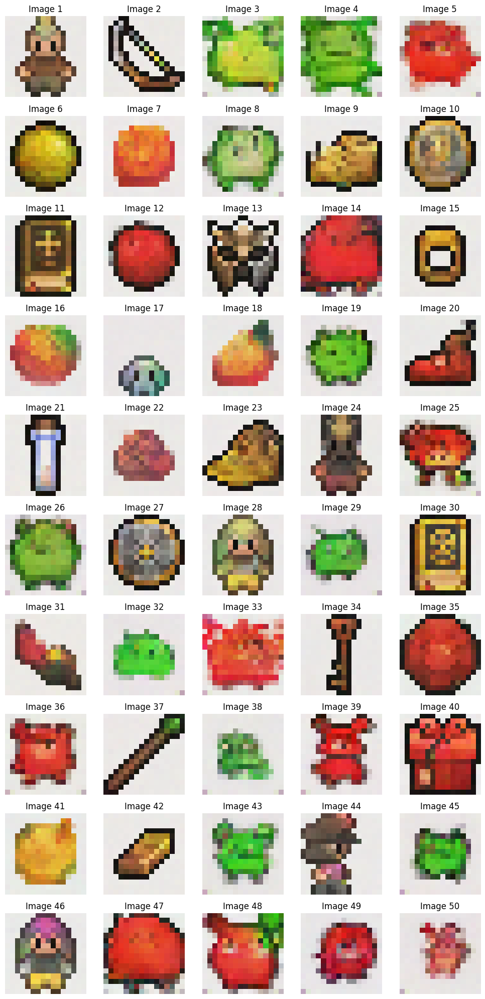

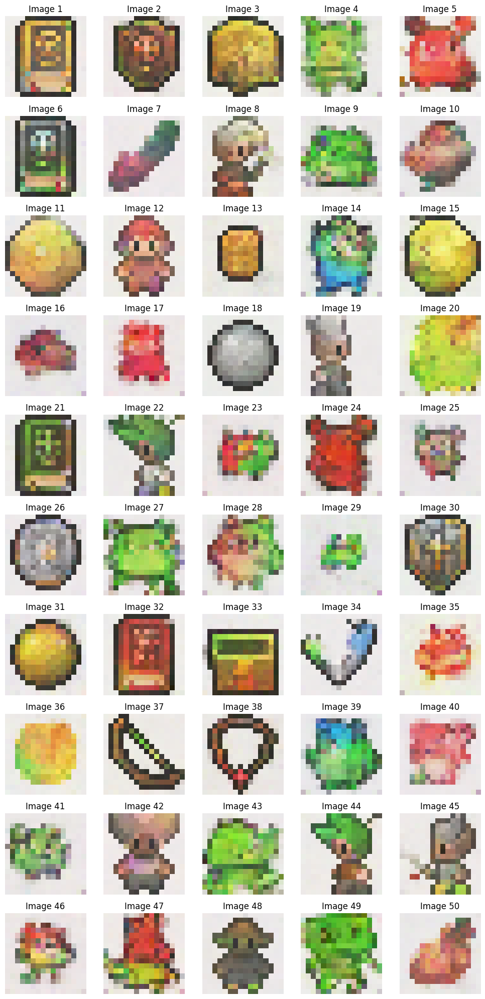

In [35]:
print("\nGenerating final samples using DDPM and DDIM...")

final_samples_ddpm = sample_ddpm(nn_model, n_sample=50, timesteps=timesteps, beta=beta, alpha=alpha, alpha_bar=alpha_bar, device=device, height=height).cpu()
final_samples_ddim = sample_ddim(nn_model, n_sample=50, timesteps=timesteps, beta=beta, alpha=alpha, alpha_bar=alpha_bar, device=device, height=height, eta=  0, n_steps=400).cpu()

plot_sample(final_samples_ddpm, 50, nrows=10)
plt.savefig(os.path.join(final_ddpm_dir, 'ddpm_final_samples.png'))
plt.close()

plot_sample(final_samples_ddim, 50, nrows=10)
plt.savefig(os.path.join(final_ddim_dir, 'ddim_final_samples.png'))
plt.close()



Generating final samples using DDPM and DDIM...


DDPM Sampling: 1000it [00:06, 143.59it/s]


Starting DDIM sampling with 600 steps (step size: 1)


DDIM Sampling: 15it [00:00, 143.29it/s]

Step 600/600: Added noise with sigma_t=0.10969061404466629
Step 599/600: Added noise with sigma_t=0.10959978401660919
Step 598/600: Added noise with sigma_t=0.10950886458158493
Step 597/600: Added noise with sigma_t=0.1094178780913353
Step 596/600: Added noise with sigma_t=0.1093268096446991
Step 595/600: Added noise with sigma_t=0.10923567414283752
Step 594/600: Added noise with sigma_t=0.10914445668458939
Step 593/600: Added noise with sigma_t=0.10905315726995468
Step 592/600: Added noise with sigma_t=0.1089617908000946
Step 591/600: Added noise with sigma_t=0.10887034982442856
Step 590/600: Added noise with sigma_t=0.10877881944179535
Step 589/600: Added noise with sigma_t=0.10868722200393677
Step 588/600: Added noise with sigma_t=0.10859554260969162
Step 587/600: Added noise with sigma_t=0.1085037887096405
Step 586/600: Added noise with sigma_t=0.10841195285320282
Step 585/600: Added noise with sigma_t=0.10832004994153976
Step 584/600: Added noise with sigma_t=0.10822805762290955
S

DDIM Sampling: 45it [00:00, 139.13it/s]

Step 571/600: Added noise with sigma_t=0.10702501237392426
Step 570/600: Added noise with sigma_t=0.1069319099187851
Step 569/600: Added noise with sigma_t=0.10683872550725937
Step 568/600: Added noise with sigma_t=0.10674546658992767
Step 567/600: Added noise with sigma_t=0.10665211826562881
Step 566/600: Added noise with sigma_t=0.10655868798494339
Step 565/600: Added noise with sigma_t=0.106465183198452
Step 564/600: Added noise with sigma_t=0.10637158900499344
Step 563/600: Added noise with sigma_t=0.10627791285514832
Step 562/600: Added noise with sigma_t=0.10618415474891663
Step 561/600: Added noise with sigma_t=0.10609031468629837
Step 560/600: Added noise with sigma_t=0.10599638521671295
Step 559/600: Added noise with sigma_t=0.10590238124132156
Step 558/600: Added noise with sigma_t=0.10580829530954361
Step 557/600: Added noise with sigma_t=0.10571411997079849
Step 556/600: Added noise with sigma_t=0.10561986267566681
Step 555/600: Added noise with sigma_t=0.10552551597356796


DDIM Sampling: 74it [00:00, 141.35it/s]

Step 542/600: Added noise with sigma_t=0.10429130494594574
Step 541/600: Added noise with sigma_t=0.10419575870037079
Step 540/600: Added noise with sigma_t=0.10410012304782867
Step 539/600: Added noise with sigma_t=0.1040044054389
Step 538/600: Added noise with sigma_t=0.10390859842300415
Step 537/600: Added noise with sigma_t=0.10381270200014114
Step 536/600: Added noise with sigma_t=0.10371671617031097
Step 535/600: Added noise with sigma_t=0.10362064093351364
Step 534/600: Added noise with sigma_t=0.10352447628974915
Step 533/600: Added noise with sigma_t=0.10342822223901749
Step 532/600: Added noise with sigma_t=0.10333187878131866
Step 531/600: Added noise with sigma_t=0.10323544591665268
Step 530/600: Added noise with sigma_t=0.10313892364501953
Step 529/600: Added noise with sigma_t=0.10304230451583862
Step 528/600: Added noise with sigma_t=0.10294560343027115
Step 527/600: Added noise with sigma_t=0.10284880548715591
Step 526/600: Added noise with sigma_t=0.10275191813707352
S

DDIM Sampling: 104it [00:00, 142.35it/s]

Step 513/600: Added noise with sigma_t=0.10148397833108902
Step 512/600: Added noise with sigma_t=0.10138578712940216
Step 511/600: Added noise with sigma_t=0.10128750652074814
Step 510/600: Added noise with sigma_t=0.10118912160396576
Step 509/600: Added noise with sigma_t=0.10109064728021622
Step 508/600: Added noise with sigma_t=0.10099207609891891
Step 507/600: Added noise with sigma_t=0.10089340060949326
Step 506/600: Added noise with sigma_t=0.10079463571310043
Step 505/600: Added noise with sigma_t=0.10069577395915985
Step 504/600: Added noise with sigma_t=0.10059681534767151
Step 503/600: Added noise with sigma_t=0.1004977598786354
Step 502/600: Added noise with sigma_t=0.10039860010147095
Step 501/600: Added noise with sigma_t=0.10029935091733932
Step 500/600: Added noise with sigma_t=0.10019999742507935
Step 499/600: Added noise with sigma_t=0.1001005470752716
Step 498/600: Added noise with sigma_t=0.10000099986791611
Step 497/600: Added noise with sigma_t=0.09990135580301285

DDIM Sampling: 134it [00:00, 139.26it/s]

Step 484/600: Added noise with sigma_t=0.09859675914049149
Step 483/600: Added noise with sigma_t=0.09849569201469421
Step 482/600: Added noise with sigma_t=0.09839452058076859
Step 481/600: Added noise with sigma_t=0.0982932448387146
Step 480/600: Added noise with sigma_t=0.09819186478853226
Step 479/600: Added noise with sigma_t=0.09809037297964096
Step 478/600: Added noise with sigma_t=0.0979887843132019
Step 477/600: Added noise with sigma_t=0.09788709133863449
Step 476/600: Added noise with sigma_t=0.09778528660535812
Step 475/600: Added noise with sigma_t=0.0976833775639534
Step 474/600: Added noise with sigma_t=0.09758136421442032
Step 473/600: Added noise with sigma_t=0.09747923910617828
Step 472/600: Added noise with sigma_t=0.09737700968980789
Step 471/600: Added noise with sigma_t=0.09727467596530914
Step 470/600: Added noise with sigma_t=0.09717223048210144
Step 469/600: Added noise with sigma_t=0.09706968069076538
Step 468/600: Added noise with sigma_t=0.09696701914072037


DDIM Sampling: 163it [00:01, 136.28it/s]

Step 458/600: Added noise with sigma_t=0.09593436866998672
Step 457/600: Added noise with sigma_t=0.09583049267530441
Step 456/600: Added noise with sigma_t=0.09572650492191315
Step 455/600: Added noise with sigma_t=0.09562240540981293
Step 454/600: Added noise with sigma_t=0.09551818668842316
Step 453/600: Added noise with sigma_t=0.09541385620832443
Step 452/600: Added noise with sigma_t=0.09530941396951675
Step 451/600: Added noise with sigma_t=0.09520485252141953
Step 450/600: Added noise with sigma_t=0.09510017931461334
Step 449/600: Added noise with sigma_t=0.0949953943490982
Step 448/600: Added noise with sigma_t=0.09489049017429352
Step 447/600: Added noise with sigma_t=0.09478546679019928
Step 446/600: Added noise with sigma_t=0.09468032419681549
Step 445/600: Added noise with sigma_t=0.09457506984472275
Step 444/600: Added noise with sigma_t=0.09446970373392105
Step 443/600: Added noise with sigma_t=0.0943642184138298
Step 442/600: Added noise with sigma_t=0.09425860643386841

DDIM Sampling: 192it [00:01, 139.06it/s]

Step 429/600: Added noise with sigma_t=0.09287478774785995
Step 428/600: Added noise with sigma_t=0.09276748448610306
Step 427/600: Added noise with sigma_t=0.09266005456447601
Step 426/600: Added noise with sigma_t=0.09255250543355942
Step 425/600: Added noise with sigma_t=0.09244482964277267
Step 424/600: Added noise with sigma_t=0.09233702719211578
Step 423/600: Added noise with sigma_t=0.09222909808158875
Step 422/600: Added noise with sigma_t=0.09212104231119156
Step 421/600: Added noise with sigma_t=0.09201285988092422
Step 420/600: Added noise with sigma_t=0.09190455079078674
Step 419/600: Added noise with sigma_t=0.09179611504077911
Step 418/600: Added noise with sigma_t=0.09168754518032074
Step 417/600: Added noise with sigma_t=0.09157885611057281
Step 416/600: Added noise with sigma_t=0.09147003293037415
Step 415/600: Added noise with sigma_t=0.09136108309030533
Step 414/600: Added noise with sigma_t=0.09125199913978577
Step 413/600: Added noise with sigma_t=0.091142781078815

DDIM Sampling: 221it [00:01, 138.25it/s]

Step 400/600: Added noise with sigma_t=0.08971091359853745
Step 399/600: Added noise with sigma_t=0.08959982544183731
Step 398/600: Added noise with sigma_t=0.08948859572410583
Step 397/600: Added noise with sigma_t=0.08937722444534302
Step 396/600: Added noise with sigma_t=0.08926571905612946
Step 395/600: Added noise with sigma_t=0.08915407210588455
Step 394/600: Added noise with sigma_t=0.0890422835946083
Step 393/600: Added noise with sigma_t=0.08893036097288132
Step 392/600: Added noise with sigma_t=0.08881828933954239
Step 391/600: Added noise with sigma_t=0.08870608359575272
Step 390/600: Added noise with sigma_t=0.0885937288403511
Step 389/600: Added noise with sigma_t=0.08848123997449875
Step 388/600: Added noise with sigma_t=0.08836859464645386
Step 387/600: Added noise with sigma_t=0.08825581520795822
Step 386/600: Added noise with sigma_t=0.08814289420843124
Step 385/600: Added noise with sigma_t=0.08802981674671173
Step 384/600: Added noise with sigma_t=0.08791660517454147

DDIM Sampling: 250it [00:01, 140.12it/s]

Step 371/600: Added noise with sigma_t=0.08643130958080292
Step 370/600: Added noise with sigma_t=0.08631598949432373
Step 369/600: Added noise with sigma_t=0.0862005278468132
Step 368/600: Added noise with sigma_t=0.08608490228652954
Step 367/600: Added noise with sigma_t=0.08596912771463394
Step 366/600: Added noise with sigma_t=0.0858531966805458
Step 365/600: Added noise with sigma_t=0.08573710173368454
Step 364/600: Added noise with sigma_t=0.08562085777521133
Step 363/600: Added noise with sigma_t=0.085504449903965
Step 362/600: Added noise with sigma_t=0.08538788557052612
Step 361/600: Added noise with sigma_t=0.08527116477489471
Step 360/600: Added noise with sigma_t=0.08515428006649017
Step 359/600: Added noise with sigma_t=0.0850372388958931
Step 358/600: Added noise with sigma_t=0.08492002636194229
Step 357/600: Added noise with sigma_t=0.08480266481637955
Step 356/600: Added noise with sigma_t=0.08468513190746307
Step 355/600: Added noise with sigma_t=0.08456743508577347
St

DDIM Sampling: 279it [00:02, 133.95it/s]

Step 342/600: Added noise with sigma_t=0.08302224427461624
Step 341/600: Added noise with sigma_t=0.08290218561887741
Step 340/600: Added noise with sigma_t=0.08278196305036545
Step 339/600: Added noise with sigma_t=0.08266155421733856
Step 338/600: Added noise with sigma_t=0.08254097402095795
Step 337/600: Added noise with sigma_t=0.0824202224612236
Step 336/600: Added noise with sigma_t=0.08229929208755493
Step 335/600: Added noise with sigma_t=0.08217818289995193
Step 334/600: Added noise with sigma_t=0.08205689489841461
Step 333/600: Added noise with sigma_t=0.08193542063236237
Step 332/600: Added noise with sigma_t=0.08181377500295639
Step 331/600: Added noise with sigma_t=0.08169194310903549
Step 330/600: Added noise with sigma_t=0.08156993240118027
Step 329/600: Added noise with sigma_t=0.08144773542881012
Step 328/600: Added noise with sigma_t=0.08132535964250565
Step 327/600: Added noise with sigma_t=0.08120279759168625
Step 326/600: Added noise with sigma_t=0.0810800492763519

DDIM Sampling: 308it [00:02, 136.54it/s]

Step 316/600: Added noise with sigma_t=0.07984218746423721
Step 315/600: Added noise with sigma_t=0.07971734553575516
Step 314/600: Added noise with sigma_t=0.07959230244159698
Step 313/600: Added noise with sigma_t=0.07946707308292389
Step 312/600: Added noise with sigma_t=0.07934163510799408
Step 311/600: Added noise with sigma_t=0.07921600341796875
Step 310/600: Added noise with sigma_t=0.0790901705622673
Step 309/600: Added noise with sigma_t=0.07896414399147034
Step 308/600: Added noise with sigma_t=0.07883790880441666
Step 307/600: Added noise with sigma_t=0.07871147245168686
Step 306/600: Added noise with sigma_t=0.07858483493328094
Step 305/600: Added noise with sigma_t=0.07845798879861832
Step 304/600: Added noise with sigma_t=0.07833093404769897
Step 303/600: Added noise with sigma_t=0.07820368558168411
Step 302/600: Added noise with sigma_t=0.07807622104883194
Step 301/600: Added noise with sigma_t=0.07794854789972305
Step 300/600: Added noise with sigma_t=0.0778206661343574

DDIM Sampling: 337it [00:02, 138.16it/s]

Step 287/600: Added noise with sigma_t=0.07613866776227951
Step 286/600: Added noise with sigma_t=0.07600774616003036
Step 285/600: Added noise with sigma_t=0.07587659358978271
Step 284/600: Added noise with sigma_t=0.07574521005153656
Step 283/600: Added noise with sigma_t=0.0756136104464531
Step 282/600: Added noise with sigma_t=0.07548177242279053
Step 281/600: Added noise with sigma_t=0.07534970343112946
Step 280/600: Added noise with sigma_t=0.07521740347146988
Step 279/600: Added noise with sigma_t=0.0750848725438118
Step 278/600: Added noise with sigma_t=0.07495210319757462
Step 277/600: Added noise with sigma_t=0.07481910288333893
Step 276/600: Added noise with sigma_t=0.07468586415052414
Step 275/600: Added noise with sigma_t=0.07455238699913025
Step 274/600: Added noise with sigma_t=0.07441866397857666
Step 273/600: Added noise with sigma_t=0.07428470999002457
Step 272/600: Added noise with sigma_t=0.07415051013231277
Step 271/600: Added noise with sigma_t=0.07401607185602188

DDIM Sampling: 366it [00:02, 139.28it/s]

Step 258/600: Added noise with sigma_t=0.07224555313587189
Step 257/600: Added noise with sigma_t=0.07210755348205566
Step 256/600: Added noise with sigma_t=0.07196930050849915
Step 255/600: Added noise with sigma_t=0.07183077186346054
Step 254/600: Added noise with sigma_t=0.07169197499752045
Step 253/600: Added noise with sigma_t=0.07155291736125946
Step 252/600: Added noise with sigma_t=0.07141358405351639
Step 251/600: Added noise with sigma_t=0.07127397507429123
Step 250/600: Added noise with sigma_t=0.07113409787416458
Step 249/600: Added noise with sigma_t=0.07099394500255585
Step 248/600: Added noise with sigma_t=0.07085351645946503
Step 247/600: Added noise with sigma_t=0.07071280479431152
Step 246/600: Added noise with sigma_t=0.07057181000709534
Step 245/600: Added noise with sigma_t=0.07043053954839706
Step 244/600: Added noise with sigma_t=0.07028897851705551
Step 243/600: Added noise with sigma_t=0.07014713436365128
Step 242/600: Added noise with sigma_t=0.070005007088184

DDIM Sampling: 395it [00:02, 139.17it/s]

Step 229/600: Added noise with sigma_t=0.06813032925128937
Step 228/600: Added noise with sigma_t=0.06798398494720459
Step 227/600: Added noise with sigma_t=0.06783732026815414
Step 226/600: Added noise with sigma_t=0.06769034266471863
Step 225/600: Added noise with sigma_t=0.06754303723573685
Step 224/600: Added noise with sigma_t=0.06739541888237
Step 223/600: Added noise with sigma_t=0.06724747270345688
Step 222/600: Added noise with sigma_t=0.0670991986989975
Step 221/600: Added noise with sigma_t=0.06695059686899185
Step 220/600: Added noise with sigma_t=0.06680166721343994
Step 219/600: Added noise with sigma_t=0.06665240228176117
Step 218/600: Added noise with sigma_t=0.06650280207395554
Step 217/600: Added noise with sigma_t=0.06635286659002304
Step 216/600: Added noise with sigma_t=0.06620258837938309
Step 215/600: Added noise with sigma_t=0.06605197489261627
Step 214/600: Added noise with sigma_t=0.0659010112285614
Step 213/600: Added noise with sigma_t=0.06574969738721848
St

DDIM Sampling: 409it [00:02, 137.38it/s]

Step 200/600: Added noise with sigma_t=0.0637500137090683
Step 199/600: Added noise with sigma_t=0.06359358876943588
Step 198/600: Added noise with sigma_t=0.06343677639961243
Step 197/600: Added noise with sigma_t=0.06327956914901733
Step 196/600: Added noise with sigma_t=0.0631219819188118
Step 195/600: Added noise with sigma_t=0.06296399235725403
Step 194/600: Added noise with sigma_t=0.06280560791492462
Step 193/600: Added noise with sigma_t=0.06264682114124298
Step 192/600: Added noise with sigma_t=0.062487635761499405
Step 191/600: Added noise with sigma_t=0.062328044325113297
Step 190/600: Added noise with sigma_t=0.06216803565621376
Step 189/600: Added noise with sigma_t=0.06200762093067169
Step 188/600: Added noise with sigma_t=0.061846788972616196
Step 187/600: Added noise with sigma_t=0.061685532331466675
Step 186/600: Added noise with sigma_t=0.061523858457803726
Step 185/600: Added noise with sigma_t=0.061361756175756454
Step 184/600: Added noise with sigma_t=0.06119922548

DDIM Sampling: 423it [00:03, 130.04it/s]

Step 178/600: Added noise with sigma_t=0.06021483242511749
Step 177/600: Added noise with sigma_t=0.06004919484257698
Step 176/600: Added noise with sigma_t=0.059883102774620056
Step 175/600: Added noise with sigma_t=0.05971654877066612


DDIM Sampling: 437it [00:03, 132.08it/s]

Step 174/600: Added noise with sigma_t=0.05954952910542488
Step 173/600: Added noise with sigma_t=0.059382036328315735
Step 172/600: Added noise with sigma_t=0.059214070439338684
Step 171/600: Added noise with sigma_t=0.05904563143849373
Step 170/600: Added noise with sigma_t=0.058876704424619675
Step 169/600: Added noise with sigma_t=0.05870729684829712
Step 168/600: Added noise with sigma_t=0.05853739753365517
Step 167/600: Added noise with sigma_t=0.05836699903011322
Step 166/600: Added noise with sigma_t=0.05819610878825188
Step 165/600: Added noise with sigma_t=0.058024708181619644
Step 164/600: Added noise with sigma_t=0.05785280466079712
Step 163/600: Added noise with sigma_t=0.057680387049913406
Step 162/600: Added noise with sigma_t=0.05750745162367821
Step 161/600: Added noise with sigma_t=0.05733399838209152
Step 160/600: Added noise with sigma_t=0.057160016149282455
Step 159/600: Added noise with sigma_t=0.05698550119996071
Step 158/600: Added noise with sigma_t=0.056810453

DDIM Sampling: 452it [00:03, 135.00it/s]

Step 149/600: Added noise with sigma_t=0.055210039019584656
Step 148/600: Added noise with sigma_t=0.05502934008836746
Step 147/600: Added noise with sigma_t=0.05484804883599281
Step 146/600: Added noise with sigma_t=0.05466615408658981


DDIM Sampling: 466it [00:03, 135.70it/s]

Step 145/600: Added noise with sigma_t=0.054483652114868164
Step 144/600: Added noise with sigma_t=0.05430053919553757
Step 143/600: Added noise with sigma_t=0.05411680415272713
Step 142/600: Added noise with sigma_t=0.053932446986436844
Step 141/600: Added noise with sigma_t=0.05374745652079582
Step 140/600: Added noise with sigma_t=0.053561821579933167
Step 139/600: Added noise with sigma_t=0.053375545889139175
Step 138/600: Added noise with sigma_t=0.053188618272542953
Step 137/600: Added noise with sigma_t=0.053001031279563904
Step 136/600: Added noise with sigma_t=0.05281277745962143
Step 135/600: Added noise with sigma_t=0.052623845636844635
Step 134/600: Added noise with sigma_t=0.05243423953652382
Step 133/600: Added noise with sigma_t=0.05224394053220749
Step 132/600: Added noise with sigma_t=0.052052948623895645
Step 131/600: Added noise with sigma_t=0.05186125636100769
Step 130/600: Added noise with sigma_t=0.05166884511709213
Step 129/600: Added noise with sigma_t=0.0514757

DDIM Sampling: 481it [00:03, 137.71it/s]

Step 120/600: Added noise with sigma_t=0.04970382899045944
Step 119/600: Added noise with sigma_t=0.049503035843372345
Step 118/600: Added noise with sigma_t=0.049301426857709885
Step 117/600: Added noise with sigma_t=0.049098990857601166


DDIM Sampling: 495it [00:03, 138.31it/s]

Step 116/600: Added noise with sigma_t=0.048895712941884995
Step 115/600: Added noise with sigma_t=0.04869158938527107
Step 114/600: Added noise with sigma_t=0.048486609011888504
Step 113/600: Added noise with sigma_t=0.0482807531952858
Step 112/600: Added noise with sigma_t=0.04807401821017265
Step 111/600: Added noise with sigma_t=0.04786638915538788
Step 110/600: Added noise with sigma_t=0.047657858580350876
Step 109/600: Added noise with sigma_t=0.04744840785861015
Step 108/600: Added noise with sigma_t=0.047238029539585114
Step 107/600: Added noise with sigma_t=0.04702671244740486
Step 106/600: Added noise with sigma_t=0.046814437955617905
Step 105/600: Added noise with sigma_t=0.046601198613643646
Step 104/600: Added noise with sigma_t=0.04638697952032089
Step 103/600: Added noise with sigma_t=0.04617176577448845
Step 102/600: Added noise with sigma_t=0.04595554247498512
Step 101/600: Added noise with sigma_t=0.04573829844594002
Step 100/600: Added noise with sigma_t=0.0455200187

DDIM Sampling: 510it [00:03, 137.97it/s]

Step 91/600: Added noise with sigma_t=0.04350623860955238
Step 90/600: Added noise with sigma_t=0.043276701122522354
Step 89/600: Added noise with sigma_t=0.04304594174027443


DDIM Sampling: 524it [00:03, 138.35it/s]

Step 88/600: Added noise with sigma_t=0.04281393438577652
Step 87/600: Added noise with sigma_t=0.04258066415786743
Step 86/600: Added noise with sigma_t=0.04234611243009567
Step 85/600: Added noise with sigma_t=0.04211025312542915
Step 84/600: Added noise with sigma_t=0.04187306389212608
Step 83/600: Added noise with sigma_t=0.04163452237844467
Step 82/600: Added noise with sigma_t=0.04139460623264313
Step 81/600: Added noise with sigma_t=0.04115329310297966
Step 80/600: Added noise with sigma_t=0.04091055691242218
Step 79/600: Added noise with sigma_t=0.0406663715839386
Step 78/600: Added noise with sigma_t=0.040420711040496826
Step 77/600: Added noise with sigma_t=0.040173549205064774
Step 76/600: Added noise with sigma_t=0.039924852550029755
Step 75/600: Added noise with sigma_t=0.03967460244894028
Step 74/600: Added noise with sigma_t=0.039422761648893356
Step 73/600: Added noise with sigma_t=0.0391693040728569
Step 72/600: Added noise with sigma_t=0.03891419246792793
Step 71/600:

DDIM Sampling: 539it [00:03, 138.37it/s]

Step 62/600: Added noise with sigma_t=0.03626451641321182
Step 61/600: Added noise with sigma_t=0.03598881885409355


DDIM Sampling: 553it [00:04, 134.34it/s]

Step 60/600: Added noise with sigma_t=0.03571099787950516
Step 59/600: Added noise with sigma_t=0.035430993884801865
Step 58/600: Added noise with sigma_t=0.03514876216650009
Step 57/600: Added noise with sigma_t=0.03486424311995506
Step 56/600: Added noise with sigma_t=0.0345773845911026
Step 55/600: Added noise with sigma_t=0.03428812697529793
Step 54/600: Added noise with sigma_t=0.03399640694260597
Step 53/600: Added noise with sigma_t=0.03370216488838196
Step 52/600: Added noise with sigma_t=0.033405326306819916
Step 51/600: Added noise with sigma_t=0.03310583159327507
Step 50/600: Added noise with sigma_t=0.032803598791360855
Step 49/600: Added noise with sigma_t=0.0324985571205616
Step 48/600: Added noise with sigma_t=0.03219062462449074
Step 47/600: Added noise with sigma_t=0.031879715621471405
Step 46/600: Added noise with sigma_t=0.031565748155117035
Step 45/600: Added noise with sigma_t=0.03124862350523472
Step 44/600: Added noise with sigma_t=0.030928248539566994
Step 43/60

DDIM Sampling: 567it [00:04, 132.99it/s]

Step 36/600: Added noise with sigma_t=0.028234681114554405
Step 35/600: Added noise with sigma_t=0.02787969261407852
Step 34/600: Added noise with sigma_t=0.02752012573182583


DDIM Sampling: 581it [00:04, 134.81it/s]

Step 33/600: Added noise with sigma_t=0.02715579979121685
Step 32/600: Added noise with sigma_t=0.02678651735186577
Step 31/600: Added noise with sigma_t=0.026412073522806168
Step 30/600: Added noise with sigma_t=0.02603224292397499
Step 29/600: Added noise with sigma_t=0.025646788999438286
Step 28/600: Added noise with sigma_t=0.02525545284152031
Step 27/600: Added noise with sigma_t=0.024857955053448677
Step 26/600: Added noise with sigma_t=0.02445399761199951
Step 25/600: Added noise with sigma_t=0.024043254554271698
Step 24/600: Added noise with sigma_t=0.023625370115041733
Step 23/600: Added noise with sigma_t=0.023199962452054024
Step 22/600: Added noise with sigma_t=0.022766605019569397
Step 21/600: Added noise with sigma_t=0.022324837744235992
Step 20/600: Added noise with sigma_t=0.02187415212392807
Step 19/600: Added noise with sigma_t=0.021413980051875114
Step 18/600: Added noise with sigma_t=0.02094370126724243
Step 17/600: Added noise with sigma_t=0.02046261727809906
Step 

DDIM Sampling: 595it [00:04, 133.95it/s]

Step 7/600: Added noise with sigma_t=0.014816191047430038
Step 6/600: Added noise with sigma_t=0.014127972535789013


DDIM Sampling: 600it [00:04, 136.75it/s]


Step 5/600: Added noise with sigma_t=0.013404465280473232
Step 4/600: Added noise with sigma_t=0.012639611028134823
Step 3/600: Added noise with sigma_t=0.011825389228761196
Step 2/600: Added noise with sigma_t=0.010950795374810696
Step 1/600: Deterministic step
DDIM sampling completed.


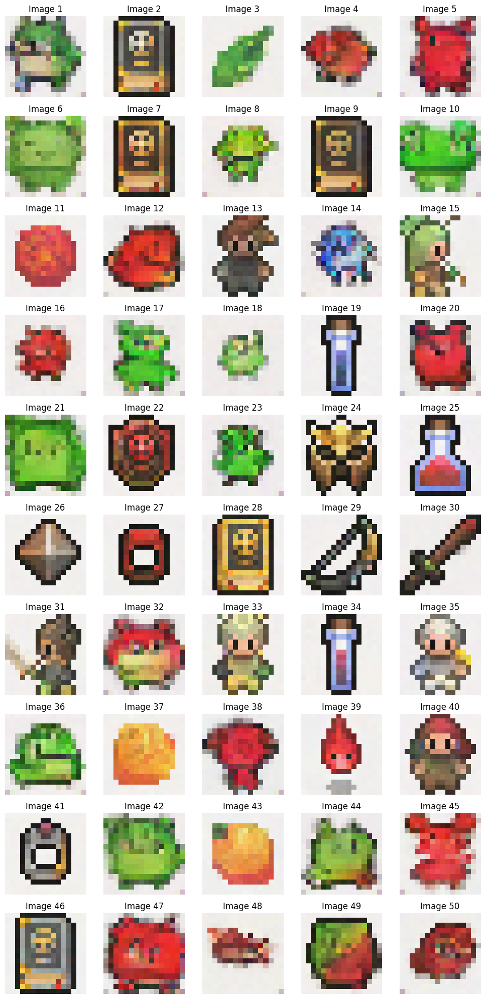

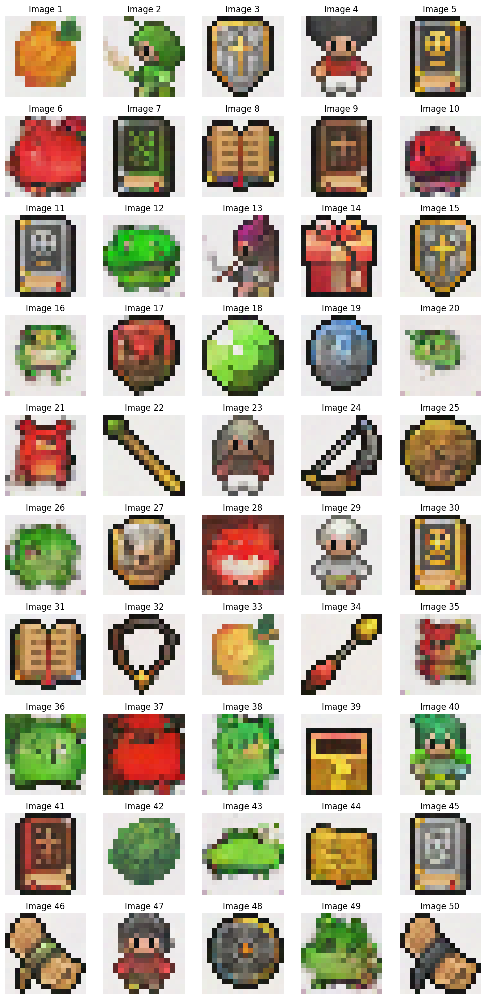

In [37]:
print("\nGenerating final samples using DDPM and DDIM...")

final_samples_ddpm = sample_ddpm(nn_model, n_sample=50, timesteps=timesteps, beta=beta, alpha=alpha, alpha_bar=alpha_bar, device=device, height=height).cpu()
final_samples_ddim = sample_ddim(nn_model, n_sample=50, timesteps=timesteps, beta=beta, alpha=alpha, alpha_bar=alpha_bar, device=device, height=height, eta=  1, n_steps=600).cpu()

plot_sample(final_samples_ddpm, 50, nrows=10)
plt.savefig(os.path.join(final_ddpm_dir, 'ddpm_final_samples.png'))
plt.close()

plot_sample(final_samples_ddim, 50, nrows=10)
plt.savefig(os.path.join(final_ddim_dir, 'ddim_final_samples.png'))
plt.close()



Generating final samples using DDPM and DDIM...


DDPM Sampling: 1000it [00:06, 149.73it/s]


Starting DDIM sampling with 600 steps (step size: 1)


DDIM Sampling: 11it [00:00, 104.52it/s]

Step 600/600: Added noise with sigma_t=0.010969061404466629
Step 599/600: Added noise with sigma_t=0.010959978215396404
Step 598/600: Added noise with sigma_t=0.010950886644423008
Step 597/600: Added noise with sigma_t=0.010941787622869015
Step 596/600: Added noise with sigma_t=0.010932681150734425
Step 595/600: Added noise with sigma_t=0.010923567228019238
Step 594/600: Added noise with sigma_t=0.010914445854723454
Step 593/600: Added noise with sigma_t=0.010905316099524498
Step 592/600: Added noise with sigma_t=0.010896178893744946
Step 591/600: Added noise with sigma_t=0.01088703516870737
Step 590/600: Added noise with sigma_t=0.01087788213044405
Step 589/600: Added noise with sigma_t=0.010868722572922707
Step 588/600: Added noise with sigma_t=0.010859554633498192
Step 587/600: Added noise with sigma_t=0.01085037924349308
Step 586/600: Added noise with sigma_t=0.010841195471584797
Step 585/600: Added noise with sigma_t=0.010832005180418491
Step 584/600: Added noise with sigma_t=0.01

DDIM Sampling: 34it [00:00, 108.34it/s]


Step 578/600: Added noise with sigma_t=0.010767447762191296
Step 577/600: Added noise with sigma_t=0.010758194141089916
Step 576/600: Added noise with sigma_t=0.010748932138085365
Step 575/600: Added noise with sigma_t=0.010739661753177643
Step 574/600: Added noise with sigma_t=0.010730383917689323
Step 573/600: Added noise with sigma_t=0.010721097700297832
Step 572/600: Added noise with sigma_t=0.010711804032325745
Step 571/600: Added noise with sigma_t=0.01070250105112791
Step 570/600: Added noise with sigma_t=0.010693191550672054
Step 569/600: Added noise with sigma_t=0.010683872736990452
Step 568/600: Added noise with sigma_t=0.010674546472728252
Step 567/600: Added noise with sigma_t=0.010665211826562881
Step 566/600: Added noise with sigma_t=0.010655868798494339
Step 565/600: Added noise with sigma_t=0.0106465183198452
Step 564/600: Added noise with sigma_t=0.010637159459292889
Step 563/600: Added noise with sigma_t=0.010627791285514832
Step 562/600: Added noise with sigma_t=0.0

DDIM Sampling: 58it [00:00, 111.48it/s]

Step 555/600: Added noise with sigma_t=0.010552551597356796
Step 554/600: Added noise with sigma_t=0.01054310891777277
Step 553/600: Added noise with sigma_t=0.010533657856285572
Step 552/600: Added noise with sigma_t=0.010524198412895203
Step 551/600: Added noise with sigma_t=0.010514730587601662
Step 550/600: Added noise with sigma_t=0.01050525438040495
Step 549/600: Added noise with sigma_t=0.01049576885998249
Step 548/600: Added noise with sigma_t=0.01048627495765686
Step 547/600: Added noise with sigma_t=0.010476772673428059
Step 546/600: Added noise with sigma_t=0.01046726107597351
Step 545/600: Added noise with sigma_t=0.010457742027938366
Step 544/600: Added noise with sigma_t=0.010448213666677475
Step 543/600: Added noise with sigma_t=0.010438675992190838
Step 542/600: Added noise with sigma_t=0.010429130867123604
Step 541/600: Added noise with sigma_t=0.010419576428830624
Step 540/600: Added noise with sigma_t=0.010410012677311897
Step 539/600: Added noise with sigma_t=0.0104

DDIM Sampling: 82it [00:00, 110.04it/s]

Step 532/600: Added noise with sigma_t=0.010333187878131866
Step 531/600: Added noise with sigma_t=0.010323544964194298
Step 530/600: Added noise with sigma_t=0.010313892737030983
Step 529/600: Added noise with sigma_t=0.010304230265319347
Step 528/600: Added noise with sigma_t=0.010294560343027115
Step 527/600: Added noise with sigma_t=0.010284881107509136
Step 526/600: Added noise with sigma_t=0.010275191627442837
Step 525/600: Added noise with sigma_t=0.01026549469679594
Step 524/600: Added noise with sigma_t=0.010255787521600723
Step 523/600: Added noise with sigma_t=0.01024607103317976
Step 522/600: Added noise with sigma_t=0.010236346162855625
Step 521/600: Added noise with sigma_t=0.01022661104798317
Step 520/600: Added noise with sigma_t=0.010216867551207542
Step 519/600: Added noise with sigma_t=0.010207113809883595
Step 518/600: Added noise with sigma_t=0.010197351686656475
Step 517/600: Added noise with sigma_t=0.01018758025020361
Step 516/600: Added noise with sigma_t=0.010

DDIM Sampling: 106it [00:00, 113.60it/s]

Step 509/600: Added noise with sigma_t=0.010109065100550652
Step 508/600: Added noise with sigma_t=0.010099207982420921
Step 507/600: Added noise with sigma_t=0.01008934061974287
Step 506/600: Added noise with sigma_t=0.010079463943839073
Step 505/600: Added noise with sigma_t=0.01006957795470953
Step 504/600: Added noise with sigma_t=0.010059681721031666
Step 503/600: Added noise with sigma_t=0.010049776174128056
Step 502/600: Added noise with sigma_t=0.010039860382676125
Step 501/600: Added noise with sigma_t=0.010029935277998447
Step 500/600: Added noise with sigma_t=0.01001999992877245
Step 499/600: Added noise with sigma_t=0.010010055266320705
Step 498/600: Added noise with sigma_t=0.01000010035932064
Step 497/600: Added noise with sigma_t=0.00999013613909483
Step 496/600: Added noise with sigma_t=0.009980160742998123
Step 495/600: Added noise with sigma_t=0.00997017603367567
Step 494/600: Added noise with sigma_t=0.009960181079804897
Step 493/600: Added noise with sigma_t=0.00995

DDIM Sampling: 130it [00:01, 110.49it/s]

Step 486/600: Added noise with sigma_t=0.009879859164357185
Step 485/600: Added noise with sigma_t=0.0098697729408741
Step 484/600: Added noise with sigma_t=0.009859676472842693
Step 483/600: Added noise with sigma_t=0.009849569760262966
Step 482/600: Added noise with sigma_t=0.009839451871812344
Step 481/600: Added noise with sigma_t=0.009829324670135975
Step 480/600: Added noise with sigma_t=0.00981918629258871
Step 479/600: Added noise with sigma_t=0.009809037670493126
Step 478/600: Added noise with sigma_t=0.00979887880384922
Step 477/600: Added noise with sigma_t=0.009788709692656994
Step 476/600: Added noise with sigma_t=0.009778528474271297
Step 475/600: Added noise with sigma_t=0.009768337942659855
Step 474/600: Added noise with sigma_t=0.009758136235177517
Step 473/600: Added noise with sigma_t=0.009747924283146858
Step 472/600: Added noise with sigma_t=0.009737701155245304
Step 471/600: Added noise with sigma_t=0.00972746778279543
Step 470/600: Added noise with sigma_t=0.0097

DDIM Sampling: 158it [00:01, 122.83it/s]

Step 462/600: Added noise with sigma_t=0.009634876623749733
Step 461/600: Added noise with sigma_t=0.009624532423913479
Step 460/600: Added noise with sigma_t=0.009614178910851479
Step 459/600: Added noise with sigma_t=0.009603813290596008
Step 458/600: Added noise with sigma_t=0.009593437425792217
Step 457/600: Added noise with sigma_t=0.009583049453794956
Step 456/600: Added noise with sigma_t=0.0095726503059268
Step 455/600: Added noise with sigma_t=0.009562240913510323
Step 454/600: Added noise with sigma_t=0.0095518184825778
Step 453/600: Added noise with sigma_t=0.009541385807096958
Step 452/600: Added noise with sigma_t=0.00953094195574522
Step 451/600: Added noise with sigma_t=0.009520485065877438
Step 450/600: Added noise with sigma_t=0.009510017931461334
Step 449/600: Added noise with sigma_t=0.009499539621174335
Step 448/600: Added noise with sigma_t=0.009489049203693867
Step 447/600: Added noise with sigma_t=0.009478546679019928
Step 446/600: Added noise with sigma_t=0.0094

DDIM Sampling: 186it [00:01, 130.37it/s]

Step 435/600: Added noise with sigma_t=0.00935160182416439
Step 434/600: Added noise with sigma_t=0.009340944699943066
Step 433/600: Added noise with sigma_t=0.009330276399850845
Step 432/600: Added noise with sigma_t=0.00931959506124258
Step 431/600: Added noise with sigma_t=0.00930890254676342
Step 430/600: Added noise with sigma_t=0.009298196993768215
Step 429/600: Added noise with sigma_t=0.00928747933357954
Step 428/600: Added noise with sigma_t=0.00927674863487482
Step 427/600: Added noise with sigma_t=0.009266005828976631
Step 426/600: Added noise with sigma_t=0.009255250915884972
Step 425/600: Added noise with sigma_t=0.009244482964277267
Step 424/600: Added noise with sigma_t=0.009233702905476093
Step 423/600: Added noise with sigma_t=0.009222909808158875
Step 422/600: Added noise with sigma_t=0.009212104603648186
Step 421/600: Added noise with sigma_t=0.009201286360621452
Step 420/600: Added noise with sigma_t=0.009190455079078674
Step 419/600: Added noise with sigma_t=0.0091

DDIM Sampling: 215it [00:01, 133.87it/s]

Step 406/600: Added noise with sigma_t=0.009037460200488567
Step 405/600: Added noise with sigma_t=0.009026432409882545
Step 404/600: Added noise with sigma_t=0.009015391580760479
Step 403/600: Added noise with sigma_t=0.009004336781799793
Step 402/600: Added noise with sigma_t=0.008993268944323063
Step 401/600: Added noise with sigma_t=0.008982187137007713
Step 400/600: Added noise with sigma_t=0.008971091359853745
Step 399/600: Added noise with sigma_t=0.008959982544183731
Step 398/600: Added noise with sigma_t=0.008948859758675098
Step 397/600: Added noise with sigma_t=0.008937723003327847
Step 396/600: Added noise with sigma_t=0.008926572278141975
Step 395/600: Added noise with sigma_t=0.008915407583117485
Step 394/600: Added noise with sigma_t=0.008904228918254375
Step 393/600: Added noise with sigma_t=0.008893036283552647
Step 392/600: Added noise with sigma_t=0.008881828747689724
Step 391/600: Added noise with sigma_t=0.008870608173310757
Step 390/600: Added noise with sigma_t=0

DDIM Sampling: 244it [00:02, 136.57it/s]

Step 378/600: Added noise with sigma_t=0.008723421953618526
Step 377/600: Added noise with sigma_t=0.008711997419595718
Step 376/600: Added noise with sigma_t=0.008700557984411716
Step 375/600: Added noise with sigma_t=0.008689102716743946
Step 374/600: Added noise with sigma_t=0.008677632547914982
Step 373/600: Added noise with sigma_t=0.008666147477924824
Step 372/600: Added noise with sigma_t=0.008654646575450897
Step 371/600: Added noise with sigma_t=0.008643130771815777
Step 370/600: Added noise with sigma_t=0.008631599135696888
Step 369/600: Added noise with sigma_t=0.008620052598416805
Step 368/600: Added noise with sigma_t=0.008608490228652954
Step 367/600: Added noise with sigma_t=0.008596912957727909
Step 366/600: Added noise with sigma_t=0.008585319854319096
Step 365/600: Added noise with sigma_t=0.008573709987103939
Step 364/600: Added noise with sigma_t=0.008562086150050163
Step 363/600: Added noise with sigma_t=0.008550445549190044
Step 362/600: Added noise with sigma_t=0

DDIM Sampling: 272it [00:02, 137.30it/s]

Step 349/600: Added noise with sigma_t=0.008385781198740005
Step 348/600: Added noise with sigma_t=0.008373895660042763
Step 347/600: Added noise with sigma_t=0.008361993357539177
Step 346/600: Added noise with sigma_t=0.008350073359906673
Step 345/600: Added noise with sigma_t=0.008338137529790401
Step 344/600: Added noise with sigma_t=0.008326183073222637
Step 343/600: Added noise with sigma_t=0.008314212784171104
Step 342/600: Added noise with sigma_t=0.008302224799990654
Step 341/600: Added noise with sigma_t=0.008290219120681286
Step 340/600: Added noise with sigma_t=0.008278196677565575
Step 339/600: Added noise with sigma_t=0.008266155607998371
Step 338/600: Added noise with sigma_t=0.008254097774624825
Step 337/600: Added noise with sigma_t=0.00824202224612236
Step 336/600: Added noise with sigma_t=0.008229929022490978
Step 335/600: Added noise with sigma_t=0.008217818103730679
Step 334/600: Added noise with sigma_t=0.008205689489841461
Step 333/600: Added noise with sigma_t=0.

DDIM Sampling: 300it [00:02, 135.74it/s]

Step 321/600: Added noise with sigma_t=0.008046350441873074
Step 320/600: Added noise with sigma_t=0.008033961988985538
Step 319/600: Added noise with sigma_t=0.008021554909646511
Step 318/600: Added noise with sigma_t=0.008009129203855991
Step 317/600: Added noise with sigma_t=0.007996683940291405
Step 316/600: Added noise with sigma_t=0.007984219118952751
Step 315/600: Added noise with sigma_t=0.00797173473984003
Step 314/600: Added noise with sigma_t=0.007959230802953243
Step 313/600: Added noise with sigma_t=0.007946707308292389
Step 312/600: Added noise with sigma_t=0.007934163324534893
Step 311/600: Added noise with sigma_t=0.007921600714325905
Step 310/600: Added noise with sigma_t=0.007909017615020275
Step 309/600: Added noise with sigma_t=0.007896414957940578
Step 308/600: Added noise with sigma_t=0.007883790880441666
Step 307/600: Added noise with sigma_t=0.007871147245168686
Step 306/600: Added noise with sigma_t=0.00785848405212164
Step 305/600: Added noise with sigma_t=0.0

DDIM Sampling: 330it [00:02, 138.57it/s]

Step 293/600: Added noise with sigma_t=0.007691954728215933
Step 292/600: Added noise with sigma_t=0.0076789953745901585
Step 291/600: Added noise with sigma_t=0.007666014134883881
Step 290/600: Added noise with sigma_t=0.007653010543435812
Step 289/600: Added noise with sigma_t=0.00763998506590724
Step 288/600: Added noise with sigma_t=0.007626937236636877
Step 287/600: Added noise with sigma_t=0.0076138670556247234
Step 286/600: Added noise with sigma_t=0.007600774522870779
Step 285/600: Added noise with sigma_t=0.007587659638375044
Step 284/600: Added noise with sigma_t=0.007574521005153656
Step 283/600: Added noise with sigma_t=0.007561360951513052
Step 282/600: Added noise with sigma_t=0.007548177149146795
Step 281/600: Added noise with sigma_t=0.0075349705293774605
Step 280/600: Added noise with sigma_t=0.00752174062654376
Step 279/600: Added noise with sigma_t=0.007508487440645695
Step 278/600: Added noise with sigma_t=0.0074952105060219765
Step 277/600: Added noise with sigma_t

DDIM Sampling: 359it [00:02, 138.51it/s]

Step 264/600: Added noise with sigma_t=0.0073068044148385525
Step 263/600: Added noise with sigma_t=0.007293161004781723
Step 262/600: Added noise with sigma_t=0.007279491517692804
Step 261/600: Added noise with sigma_t=0.007265795953571796
Step 260/600: Added noise with sigma_t=0.007252074778079987
Step 259/600: Added noise with sigma_t=0.007238328456878662
Step 258/600: Added noise with sigma_t=0.007224555592983961
Step 257/600: Added noise with sigma_t=0.007210755255073309
Step 256/600: Added noise with sigma_t=0.0071969302371144295
Step 255/600: Added noise with sigma_t=0.0071830772794783115
Step 254/600: Added noise with sigma_t=0.007169197779148817
Step 253/600: Added noise with sigma_t=0.007155291736125946
Step 252/600: Added noise with sigma_t=0.007141358684748411
Step 251/600: Added noise with sigma_t=0.007127397693693638
Step 250/600: Added noise with sigma_t=0.007113409694284201
Step 249/600: Added noise with sigma_t=0.0070993946865201
Step 248/600: Added noise with sigma_t=

DDIM Sampling: 388it [00:03, 140.30it/s]

Step 236/600: Added noise with sigma_t=0.006914609111845493
Step 235/600: Added noise with sigma_t=0.0069001889787614346
Step 234/600: Added noise with sigma_t=0.00688574044033885
Step 233/600: Added noise with sigma_t=0.0068712602369487286
Step 232/600: Added noise with sigma_t=0.006856750231236219
Step 231/600: Added noise with sigma_t=0.006842208560556173
Step 230/600: Added noise with sigma_t=0.006827636156231165
Step 229/600: Added noise with sigma_t=0.006813033018261194
Step 228/600: Added noise with sigma_t=0.006798398680984974
Step 227/600: Added noise with sigma_t=0.006783732213079929
Step 226/600: Added noise with sigma_t=0.006769034545868635
Step 225/600: Added noise with sigma_t=0.006754303816705942
Step 224/600: Added noise with sigma_t=0.0067395418882369995
Step 223/600: Added noise with sigma_t=0.006724747363477945
Step 222/600: Added noise with sigma_t=0.006709919776767492
Step 221/600: Added noise with sigma_t=0.006695059593766928
Step 220/600: Added noise with sigma_t

DDIM Sampling: 418it [00:03, 139.56it/s]

Step 207/600: Added noise with sigma_t=0.006483443081378937
Step 206/600: Added noise with sigma_t=0.0064680627547204494
Step 205/600: Added noise with sigma_t=0.006452646106481552
Step 204/600: Added noise with sigma_t=0.00643719220533967
Step 203/600: Added noise with sigma_t=0.006421700119972229
Step 202/600: Added noise with sigma_t=0.0064061726443469524
Step 201/600: Added noise with sigma_t=0.006390606053173542
Step 200/600: Added noise with sigma_t=0.006375001277774572
Step 199/600: Added noise with sigma_t=0.006359358783811331
Step 198/600: Added noise with sigma_t=0.006343677639961243
Step 197/600: Added noise with sigma_t=0.006327956914901733
Step 196/600: Added noise with sigma_t=0.006312198471277952
Step 195/600: Added noise with sigma_t=0.006296399515122175
Step 194/600: Added noise with sigma_t=0.006280560977756977
Step 193/600: Added noise with sigma_t=0.0062646823935210705
Step 192/600: Added noise with sigma_t=0.006248763762414455
Step 191/600: Added noise with sigma_t

DDIM Sampling: 446it [00:03, 135.96it/s]

Step 179/600: Added noise with sigma_t=0.006038001272827387
Step 178/600: Added noise with sigma_t=0.006021483335644007
Step 177/600: Added noise with sigma_t=0.0060049197636544704
Step 176/600: Added noise with sigma_t=0.005988310556858778
Step 175/600: Added noise with sigma_t=0.005971654783934355
Step 174/600: Added noise with sigma_t=0.005954952910542488
Step 173/600: Added noise with sigma_t=0.005938203539699316
Step 172/600: Added noise with sigma_t=0.005921407137066126
Step 171/600: Added noise with sigma_t=0.00590456323698163
Step 170/600: Added noise with sigma_t=0.0058876704424619675
Step 169/600: Added noise with sigma_t=0.005870729684829712
Step 168/600: Added noise with sigma_t=0.005853740032762289
Step 167/600: Added noise with sigma_t=0.005836700089275837
Step 166/600: Added noise with sigma_t=0.00581961078569293
Step 165/600: Added noise with sigma_t=0.005802470725029707
Step 164/600: Added noise with sigma_t=0.0057852803729474545
Step 163/600: Added noise with sigma_t=

DDIM Sampling: 476it [00:03, 140.04it/s]

Step 152/600: Added noise with sigma_t=0.005574861541390419
Step 151/600: Added noise with sigma_t=0.00555696664378047
Step 150/600: Added noise with sigma_t=0.005539014469832182
Step 149/600: Added noise with sigma_t=0.0055210040882229805
Step 148/600: Added noise with sigma_t=0.005502934101969004
Step 147/600: Added noise with sigma_t=0.005484804976731539
Step 146/600: Added noise with sigma_t=0.005466615315526724
Step 145/600: Added noise with sigma_t=0.005448365118354559
Step 144/600: Added noise with sigma_t=0.005430053919553757
Step 143/600: Added noise with sigma_t=0.005411680322140455
Step 142/600: Added noise with sigma_t=0.005393244791775942
Step 141/600: Added noise with sigma_t=0.005374745931476355
Step 140/600: Added noise with sigma_t=0.005356182344257832
Step 139/600: Added noise with sigma_t=0.00533755449578166
Step 138/600: Added noise with sigma_t=0.005318861920386553
Step 137/600: Added noise with sigma_t=0.005300103221088648
Step 136/600: Added noise with sigma_t=0.

DDIM Sampling: 491it [00:03, 137.51it/s]

Step 123/600: Added noise with sigma_t=0.0050301398150622845
Step 122/600: Added noise with sigma_t=0.005010299850255251
Step 121/600: Added noise with sigma_t=0.004990381188690662
Step 120/600: Added noise with sigma_t=0.004970382899045944
Step 119/600: Added noise with sigma_t=0.0049503035843372345
Step 118/600: Added noise with sigma_t=0.004930142778903246
Step 117/600: Added noise with sigma_t=0.004909899085760117
Step 116/600: Added noise with sigma_t=0.004889571573585272
Step 115/600: Added noise with sigma_t=0.00486915884539485
Step 114/600: Added noise with sigma_t=0.00484866090118885
Step 113/600: Added noise with sigma_t=0.004828075412660837
Step 112/600: Added noise with sigma_t=0.004807401914149523
Step 111/600: Added noise with sigma_t=0.004786639008671045
Step 110/600: Added noise with sigma_t=0.00476578576490283
Step 109/600: Added noise with sigma_t=0.004744840785861015
Step 108/600: Added noise with sigma_t=0.004723803140223026
Step 107/600: Added noise with sigma_t=0.

DDIM Sampling: 521it [00:04, 139.49it/s]

Step 95/600: Added noise with sigma_t=0.004441252909600735
Step 94/600: Added noise with sigma_t=0.0044187698513269424
Step 93/600: Added noise with sigma_t=0.004396171774715185
Step 92/600: Added noise with sigma_t=0.004373457282781601
Step 91/600: Added noise with sigma_t=0.004350624047219753
Step 90/600: Added noise with sigma_t=0.004327670205384493
Step 89/600: Added noise with sigma_t=0.004304594360291958
Step 88/600: Added noise with sigma_t=0.004281393717974424
Step 87/600: Added noise with sigma_t=0.004258066415786743
Step 86/600: Added noise with sigma_t=0.00423461152240634
Step 85/600: Added noise with sigma_t=0.004211025312542915
Step 84/600: Added noise with sigma_t=0.004187306389212608
Step 83/600: Added noise with sigma_t=0.004163452424108982
Step 82/600: Added noise with sigma_t=0.004139460623264313
Step 81/600: Added noise with sigma_t=0.004115329589694738
Step 80/600: Added noise with sigma_t=0.0040910555981099606
Step 79/600: Added noise with sigma_t=0.004066637251526

DDIM Sampling: 550it [00:04, 139.09it/s]

Step 67/600: Added noise with sigma_t=0.0037612696178257465
Step 66/600: Added noise with sigma_t=0.0037346952594816685
Step 65/600: Added noise with sigma_t=0.0037079304456710815
Step 64/600: Added noise with sigma_t=0.0036809712182730436
Step 63/600: Added noise with sigma_t=0.0036538131535053253
Step 62/600: Added noise with sigma_t=0.0036264515947550535
Step 61/600: Added noise with sigma_t=0.003598881885409355
Step 60/600: Added noise with sigma_t=0.0035710998345166445
Step 59/600: Added noise with sigma_t=0.0035430993884801865
Step 58/600: Added noise with sigma_t=0.0035148763563483953
Step 57/600: Added noise with sigma_t=0.0034864244516938925
Step 56/600: Added noise with sigma_t=0.0034577385522425175
Step 55/600: Added noise with sigma_t=0.003428812837228179
Step 54/600: Added noise with sigma_t=0.0033996407873928547
Step 53/600: Added noise with sigma_t=0.0033702165819704533
Step 52/600: Added noise with sigma_t=0.0033405327703803778
Step 51/600: Added noise with sigma_t=0.00

DDIM Sampling: 579it [00:04, 137.47it/s]

Step 38/600: Added noise with sigma_t=0.0028931591659784317
Step 37/600: Added noise with sigma_t=0.002858526073396206
Step 36/600: Added noise with sigma_t=0.002823468064889312
Step 35/600: Added noise with sigma_t=0.002787969307973981
Step 34/600: Added noise with sigma_t=0.002752012573182583
Step 33/600: Added noise with sigma_t=0.0027155799325555563
Step 32/600: Added noise with sigma_t=0.0026786518283188343
Step 31/600: Added noise with sigma_t=0.002641207305714488
Step 30/600: Added noise with sigma_t=0.0026032242458313704
Step 29/600: Added noise with sigma_t=0.0025646788999438286
Step 28/600: Added noise with sigma_t=0.002525545423850417
Step 27/600: Added noise with sigma_t=0.002485795645043254
Step 26/600: Added noise with sigma_t=0.002445399761199951
Step 25/600: Added noise with sigma_t=0.002404325408861041
Step 24/600: Added noise with sigma_t=0.0023625369649380445
Step 23/600: Added noise with sigma_t=0.0023199962452054024
Step 22/600: Added noise with sigma_t=0.002276660

DDIM Sampling: 600it [00:04, 130.71it/s]


Step 10/600: Added noise with sigma_t=0.0016711651114746928
Step 9/600: Added noise with sigma_t=0.0016104638343676925
Step 8/600: Added noise with sigma_t=0.0015473830280825496
Step 7/600: Added noise with sigma_t=0.0014816190814599395
Step 6/600: Added noise with sigma_t=0.0014127972535789013
Step 5/600: Added noise with sigma_t=0.0013404465280473232
Step 4/600: Added noise with sigma_t=0.001263961079530418
Step 3/600: Added noise with sigma_t=0.0011825389228761196
Step 2/600: Added noise with sigma_t=0.0010950795840471983
Step 1/600: Deterministic step
DDIM sampling completed.


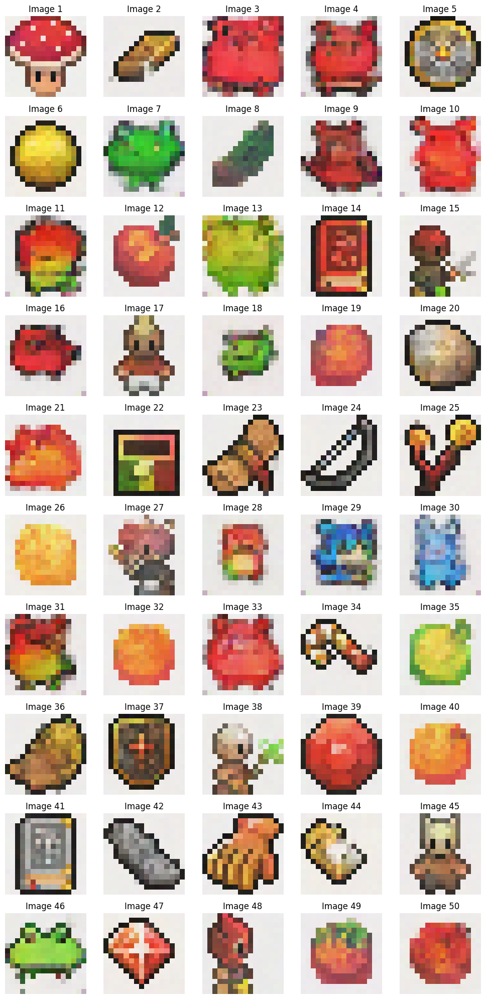

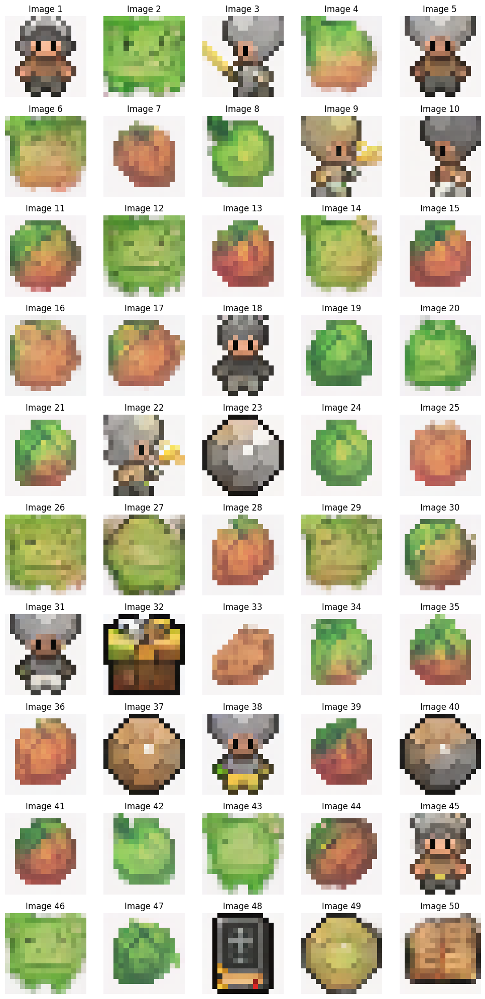

In [38]:
print("\nGenerating final samples using DDPM and DDIM...")

final_samples_ddpm = sample_ddpm(nn_model, n_sample=50, timesteps=timesteps, beta=beta, alpha=alpha, alpha_bar=alpha_bar, device=device, height=height).cpu()
final_samples_ddim = sample_ddim(nn_model, n_sample=50, timesteps=timesteps, beta=beta, alpha=alpha, alpha_bar=alpha_bar, device=device, height=height, eta=  0.1, n_steps=600).cpu()

plot_sample(final_samples_ddpm, 50, nrows=10)
plt.savefig(os.path.join(final_ddpm_dir, 'ddpm_final_samples.png'))
plt.close()

plot_sample(final_samples_ddim, 50, nrows=10)
plt.savefig(os.path.join(final_ddim_dir, 'ddim_final_samples.png'))
plt.close()



Timing the generation of samples using DDPM and DDIM...


DDPM Sampling: 1000it [00:06, 150.13it/s]


Time taken for DDPM sampling: 6.68 seconds
Starting DDIM sampling with 400 steps (step size: 2)


DDIM Sampling: 11it [00:00, 108.64it/s]

Step 400/400: Deterministic step
Step 399/400: Deterministic step
Step 398/400: Deterministic step
Step 397/400: Deterministic step
Step 396/400: Deterministic step
Step 395/400: Deterministic step
Step 394/400: Deterministic step
Step 393/400: Deterministic step
Step 392/400: Deterministic step
Step 391/400: Deterministic step
Step 390/400: Deterministic step
Step 389/400: Deterministic step
Step 388/400: Deterministic step
Step 387/400: Deterministic step
Step 386/400: Deterministic step
Step 385/400: Deterministic step
Step 384/400: Deterministic step
Step 383/400: Deterministic step
Step 382/400: Deterministic step
Step 381/400: Deterministic step
Step 380/400: Deterministic step
Step 379/400: Deterministic step


DDIM Sampling: 23it [00:00, 113.30it/s]

Step 378/400: Deterministic step


DDIM Sampling: 36it [00:00, 118.72it/s]

Step 377/400: Deterministic step
Step 376/400: Deterministic step
Step 375/400: Deterministic step
Step 374/400: Deterministic step
Step 373/400: Deterministic step
Step 372/400: Deterministic step
Step 371/400: Deterministic step
Step 370/400: Deterministic step
Step 369/400: Deterministic step
Step 368/400: Deterministic step
Step 367/400: Deterministic step
Step 366/400: Deterministic step
Step 365/400: Deterministic step
Step 364/400: Deterministic step
Step 363/400: Deterministic step
Step 362/400: Deterministic step
Step 361/400: Deterministic step
Step 360/400: Deterministic step
Step 359/400: Deterministic step
Step 358/400: Deterministic step
Step 357/400: Deterministic step
Step 356/400: Deterministic step
Step 355/400: Deterministic step
Step 354/400: Deterministic step
Step 353/400: Deterministic step


DDIM Sampling: 49it [00:00, 121.67it/s]

Step 352/400: Deterministic step


DDIM Sampling: 62it [00:00, 123.31it/s]

Step 351/400: Deterministic step
Step 350/400: Deterministic step
Step 349/400: Deterministic step
Step 348/400: Deterministic step
Step 347/400: Deterministic step
Step 346/400: Deterministic step
Step 345/400: Deterministic step
Step 344/400: Deterministic step
Step 343/400: Deterministic step
Step 342/400: Deterministic step
Step 341/400: Deterministic step
Step 340/400: Deterministic step
Step 339/400: Deterministic step
Step 338/400: Deterministic step
Step 337/400: Deterministic step
Step 336/400: Deterministic step
Step 335/400: Deterministic step
Step 334/400: Deterministic step
Step 333/400: Deterministic step
Step 332/400: Deterministic step
Step 331/400: Deterministic step
Step 330/400: Deterministic step
Step 329/400: Deterministic step
Step 328/400: Deterministic step
Step 327/400: Deterministic step
Step 326/400: Deterministic step

DDIM Sampling: 75it [00:00, 125.17it/s]

DDIM Sampling: 88it [00:00, 124.01it/s]

Step 325/400: Deterministic step
Step 324/400: Deterministic step
Step 323/400: Deterministic step
Step 322/400: Deterministic step
Step 321/400: Deterministic step
Step 320/400: Deterministic step
Step 319/400: Deterministic step
Step 318/400: Deterministic step
Step 317/400: Deterministic step
Step 316/400: Deterministic step
Step 315/400: Deterministic step
Step 314/400: Deterministic step
Step 313/400: Deterministic step
Step 312/400: Deterministic step
Step 311/400: Deterministic step
Step 310/400: Deterministic step
Step 309/400: Deterministic step
Step 308/400: Deterministic step
Step 307/400: Deterministic step
Step 306/400: Deterministic step
Step 305/400: Deterministic step
Step 304/400: Deterministic step
Step 303/400: Deterministic step
Step 302/400: Deterministic step
Step 301/400: Deterministic step


DDIM Sampling: 115it [00:00, 126.09it/s]

Step 300/400: Deterministic step
Step 299/400: Deterministic step
Step 298/400: Deterministic step
Step 297/400: Deterministic step
Step 296/400: Deterministic step
Step 295/400: Deterministic step
Step 294/400: Deterministic step
Step 293/400: Deterministic step
Step 292/400: Deterministic step
Step 291/400: Deterministic step
Step 290/400: Deterministic step
Step 289/400: Deterministic step
Step 288/400: Deterministic step
Step 287/400: Deterministic step
Step 286/400: Deterministic step
Step 285/400: Deterministic step
Step 284/400: Deterministic step
Step 283/400: Deterministic step
Step 282/400: Deterministic step
Step 281/400: Deterministic step
Step 280/400: Deterministic step
Step 279/400: Deterministic step
Step 278/400: Deterministic step
Step 277/400: Deterministic step
Step 276/400: Deterministic step
Step 275/400: Deterministic step
Step 274/400: Deterministic step


DDIM Sampling: 141it [00:01, 126.36it/s]

Step 273/400: Deterministic step
Step 272/400: Deterministic step
Step 271/400: Deterministic step
Step 270/400: Deterministic step
Step 269/400: Deterministic step
Step 268/400: Deterministic step
Step 267/400: Deterministic step
Step 266/400: Deterministic step
Step 265/400: Deterministic step
Step 264/400: Deterministic step
Step 263/400: Deterministic step
Step 262/400: Deterministic step
Step 261/400: Deterministic step
Step 260/400: Deterministic step
Step 259/400: Deterministic step
Step 258/400: Deterministic step
Step 257/400: Deterministic step
Step 256/400: Deterministic step
Step 255/400: Deterministic step
Step 254/400: Deterministic step
Step 253/400: Deterministic step
Step 252/400: Deterministic step
Step 251/400: Deterministic step
Step 250/400: Deterministic step


DDIM Sampling: 167it [00:01, 119.32it/s]

Step 249/400: Deterministic step
Step 248/400: Deterministic step
Step 247/400: Deterministic step
Step 246/400: Deterministic step
Step 245/400: Deterministic step
Step 244/400: Deterministic step
Step 243/400: Deterministic step
Step 242/400: Deterministic step
Step 241/400: Deterministic step
Step 240/400: Deterministic step
Step 239/400: Deterministic step
Step 238/400: Deterministic step
Step 237/400: Deterministic step
Step 236/400: Deterministic step
Step 235/400: Deterministic step
Step 234/400: Deterministic step
Step 233/400: Deterministic step
Step 232/400: Deterministic step
Step 231/400: Deterministic step
Step 230/400: Deterministic step
Step 229/400: Deterministic step
Step 228/400: Deterministic step
Step 227/400: Deterministic step


DDIM Sampling: 191it [00:01, 116.22it/s]

Step 226/400: Deterministic step
Step 225/400: Deterministic step
Step 224/400: Deterministic step
Step 223/400: Deterministic step
Step 222/400: Deterministic step
Step 221/400: Deterministic step
Step 220/400: Deterministic step
Step 219/400: Deterministic step
Step 218/400: Deterministic step
Step 217/400: Deterministic step
Step 216/400: Deterministic step
Step 215/400: Deterministic step
Step 214/400: Deterministic step
Step 213/400: Deterministic step
Step 212/400: Deterministic step
Step 211/400: Deterministic step
Step 210/400: Deterministic step
Step 209/400: Deterministic step
Step 208/400: Deterministic step
Step 207/400: Deterministic step
Step 206/400: Deterministic step
Step 205/400: Deterministic step
Step 204/400: Deterministic step


DDIM Sampling: 215it [00:01, 107.81it/s]

Step 203/400: Deterministic step
Step 202/400: Deterministic step
Step 201/400: Deterministic step
Step 200/400: Deterministic step
Step 199/400: Deterministic step
Step 198/400: Deterministic step
Step 197/400: Deterministic step
Step 196/400: Deterministic step
Step 195/400: Deterministic step
Step 194/400: Deterministic step
Step 193/400: Deterministic step
Step 192/400: Deterministic step
Step 191/400: Deterministic step
Step 190/400: Deterministic step
Step 189/400: Deterministic step
Step 188/400: Deterministic step
Step 187/400: Deterministic step
Step 186/400: Deterministic step
Step 185/400: Deterministic step
Step 184/400: Deterministic step
Step 183/400: Deterministic step


DDIM Sampling: 240it [00:02, 113.95it/s]

Step 182/400: Deterministic step
Step 181/400: Deterministic step
Step 180/400: Deterministic step
Step 179/400: Deterministic step
Step 178/400: Deterministic step
Step 177/400: Deterministic step
Step 176/400: Deterministic step
Step 175/400: Deterministic step
Step 174/400: Deterministic step
Step 173/400: Deterministic step
Step 172/400: Deterministic step
Step 171/400: Deterministic step
Step 170/400: Deterministic step
Step 169/400: Deterministic step
Step 168/400: Deterministic step
Step 167/400: Deterministic step
Step 166/400: Deterministic step
Step 165/400: Deterministic step
Step 164/400: Deterministic step
Step 163/400: Deterministic step
Step 162/400: Deterministic step
Step 161/400: Deterministic step
Step 160/400: Deterministic step
Step 159/400: Deterministic step
Step 158/400: Deterministic step


DDIM Sampling: 264it [00:02, 109.38it/s]

Step 157/400: Deterministic step
Step 156/400: Deterministic step
Step 155/400: Deterministic step
Step 154/400: Deterministic step
Step 153/400: Deterministic step
Step 152/400: Deterministic step
Step 151/400: Deterministic step
Step 150/400: Deterministic step
Step 149/400: Deterministic step
Step 148/400: Deterministic step
Step 147/400: Deterministic step
Step 146/400: Deterministic step
Step 145/400: Deterministic step
Step 144/400: Deterministic step
Step 143/400: Deterministic step
Step 142/400: Deterministic step
Step 141/400: Deterministic step
Step 140/400: Deterministic step
Step 139/400: Deterministic step
Step 138/400: Deterministic step
Step 137/400: Deterministic step


DDIM Sampling: 292it [00:02, 122.72it/s]

Step 136/400: Deterministic step
Step 135/400: Deterministic step
Step 134/400: Deterministic step
Step 133/400: Deterministic step
Step 132/400: Deterministic step
Step 131/400: Deterministic step
Step 130/400: Deterministic step
Step 129/400: Deterministic step
Step 128/400: Deterministic step
Step 127/400: Deterministic step
Step 126/400: Deterministic step
Step 125/400: Deterministic step
Step 124/400: Deterministic step
Step 123/400: Deterministic step
Step 122/400: Deterministic step
Step 121/400: Deterministic step
Step 120/400: Deterministic step
Step 119/400: Deterministic step
Step 118/400: Deterministic step
Step 117/400: Deterministic step
Step 116/400: Deterministic step
Step 115/400: Deterministic step
Step 114/400: Deterministic step
Step 113/400: Deterministic step
Step 112/400: Deterministic step
Step 111/400: Deterministic step
Step 110/400: Deterministic step
Step 109/400: Deterministic step


DDIM Sampling: 321it [00:02, 131.94it/s]

Step 108/400: Deterministic step
Step 107/400: Deterministic step
Step 106/400: Deterministic step
Step 105/400: Deterministic step
Step 104/400: Deterministic step
Step 103/400: Deterministic step
Step 102/400: Deterministic step
Step 101/400: Deterministic step
Step 100/400: Deterministic step
Step 99/400: Deterministic step
Step 98/400: Deterministic step
Step 97/400: Deterministic step
Step 96/400: Deterministic step
Step 95/400: Deterministic step
Step 94/400: Deterministic step
Step 93/400: Deterministic step
Step 92/400: Deterministic step
Step 91/400: Deterministic step
Step 90/400: Deterministic step
Step 89/400: Deterministic step
Step 88/400: Deterministic step
Step 87/400: Deterministic step
Step 86/400: Deterministic step
Step 85/400: Deterministic step
Step 84/400: Deterministic step
Step 83/400: Deterministic step
Step 82/400: Deterministic step
Step 81/400: Deterministic step
Step 80/400: Deterministic step
Step 79/400: Deterministic step


DDIM Sampling: 350it [00:02, 134.45it/s]

Step 78/400: Deterministic step
Step 77/400: Deterministic step
Step 76/400: Deterministic step
Step 75/400: Deterministic step
Step 74/400: Deterministic step
Step 73/400: Deterministic step
Step 72/400: Deterministic step
Step 71/400: Deterministic step
Step 70/400: Deterministic step
Step 69/400: Deterministic step
Step 68/400: Deterministic step
Step 67/400: Deterministic step
Step 66/400: Deterministic step
Step 65/400: Deterministic step
Step 64/400: Deterministic step
Step 63/400: Deterministic step
Step 62/400: Deterministic step
Step 61/400: Deterministic step
Step 60/400: Deterministic step
Step 59/400: Deterministic step
Step 58/400: Deterministic step
Step 57/400: Deterministic step
Step 56/400: Deterministic step
Step 55/400: Deterministic step
Step 54/400: Deterministic step
Step 53/400: Deterministic step
Step 52/400: Deterministic step
Step 51/400: Deterministic step


DDIM Sampling: 365it [00:02, 137.02it/s]

Step 50/400: Deterministic step
Step 49/400: Deterministic step
Step 48/400: Deterministic step
Step 47/400: Deterministic step
Step 46/400: Deterministic step
Step 45/400: Deterministic step
Step 44/400: Deterministic step
Step 43/400: Deterministic step
Step 42/400: Deterministic step
Step 41/400: Deterministic step
Step 40/400: Deterministic step
Step 39/400: Deterministic step
Step 38/400: Deterministic step
Step 37/400: Deterministic step
Step 36/400: Deterministic step
Step 35/400: Deterministic step
Step 34/400: Deterministic step
Step 33/400: Deterministic step
Step 32/400: Deterministic step
Step 31/400: Deterministic step
Step 30/400: Deterministic step
Step 29/400: Deterministic step
Step 28/400: Deterministic step
Step 27/400: Deterministic step
Step 26/400: Deterministic step
Step 25/400: Deterministic step
Step 24/400: Deterministic step
Step 23/400: Deterministic step
Step 22/400: Deterministic step


DDIM Sampling: 400it [00:03, 123.44it/s]

Step 21/400: Deterministic step
Step 20/400: Deterministic step
Step 19/400: Deterministic step
Step 18/400: Deterministic step
Step 17/400: Deterministic step
Step 16/400: Deterministic step
Step 15/400: Deterministic step
Step 14/400: Deterministic step
Step 13/400: Deterministic step
Step 12/400: Deterministic step
Step 11/400: Deterministic step
Step 10/400: Deterministic step
Step 9/400: Deterministic step
Step 8/400: Deterministic step
Step 7/400: Deterministic step
Step 6/400: Deterministic step
Step 5/400: Deterministic step
Step 4/400: Deterministic step
Step 3/400: Deterministic step
Step 2/400: Deterministic step
Step 1/400: Deterministic step
DDIM sampling completed.
Time taken for DDIM sampling: 3.25 seconds

Generating and saving DDPM samples...


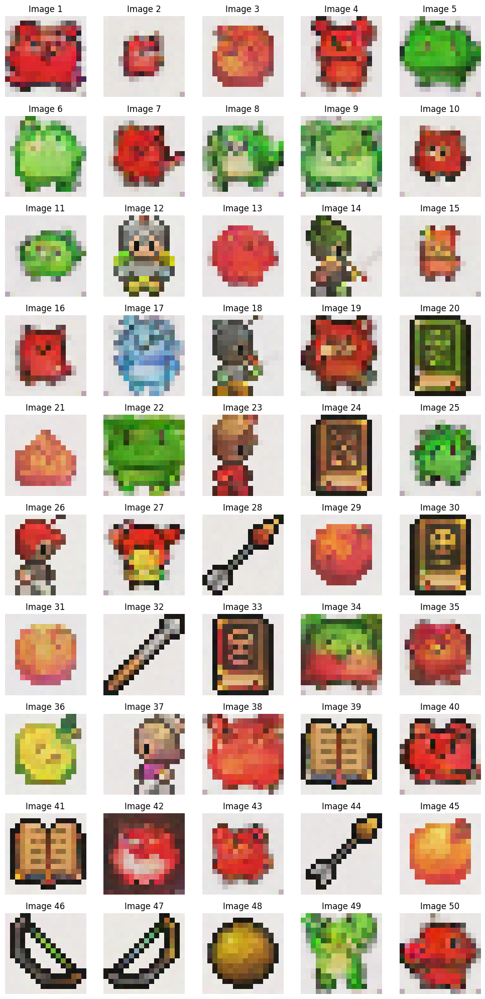


Generating and saving DDIM samples...


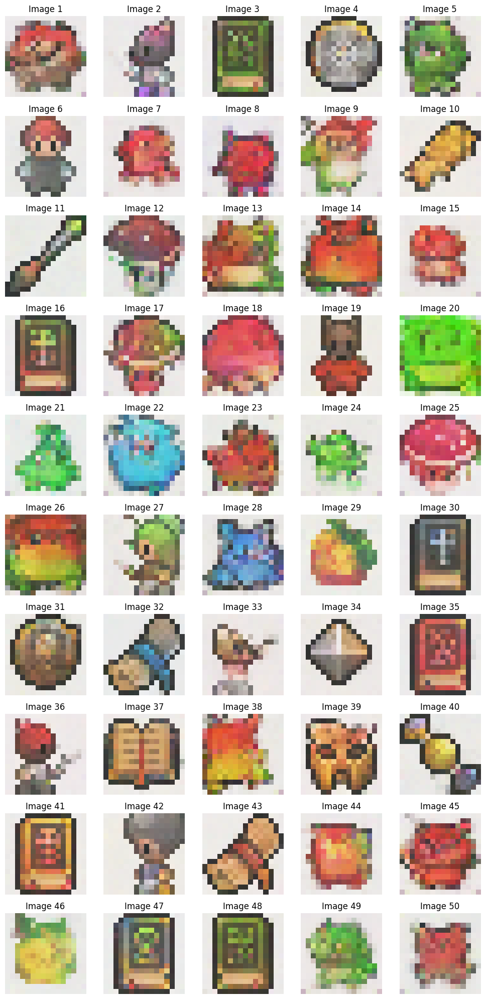


Summary:
DDPM Sampling Time: 6.68 seconds
DDIM Sampling Time: 3.25 seconds


In [39]:
import time
import os
import matplotlib.pyplot as plt

final_ddpm_dir = "results/ddpm"
final_ddim_dir = "results/ddim"
os.makedirs(final_ddpm_dir, exist_ok=True)
os.makedirs(final_ddim_dir, exist_ok=True)

print("\nTiming the generation of samples using DDPM and DDIM...")

start_ddpm = time.time()
final_samples_ddpm = sample_ddpm(
    nn_model, n_sample=50, timesteps=timesteps, beta=beta, alpha=alpha, alpha_bar=alpha_bar, device=device, height=height
).cpu()
end_ddpm = time.time()
ddpm_time = end_ddpm - start_ddpm
print(f"Time taken for DDPM sampling: {ddpm_time:.2f} seconds")

start_ddim = time.time()
final_samples_ddim = sample_ddim(
    nn_model, n_sample=50, timesteps=timesteps, beta=beta, alpha=alpha, alpha_bar=alpha_bar, device=device, height=height, eta=0.0, n_steps=400
).cpu()
end_ddim = time.time()
ddim_time = end_ddim - start_ddim
print(f"Time taken for DDIM sampling: {ddim_time:.2f} seconds")

print("\nGenerating and saving DDPM samples...")
plot_sample(final_samples_ddpm, 50, nrows=10)
plt.savefig(os.path.join(final_ddpm_dir, 'ddpm_final_samples.png'))
plt.close()

print("\nGenerating and saving DDIM samples...")
plot_sample(final_samples_ddim, 50, nrows=10)
plt.savefig(os.path.join(final_ddim_dir, 'ddim_final_samples.png'))
plt.close()

print("\nSummary:")
print(f"DDPM Sampling Time: {ddpm_time:.2f} seconds")
print(f"DDIM Sampling Time: {ddim_time:.2f} seconds")



Timing the generation of samples using DDPM and DDIM...


DDPM Sampling: 1000it [00:07, 141.32it/s]


Time taken for DDPM sampling: 7.09 seconds
Starting DDIM sampling with 600 steps (step size: 1)


DDIM Sampling: 15it [00:00, 144.63it/s]

Step 600/600: Added noise with sigma_t=0.10969061404466629
Step 599/600: Added noise with sigma_t=0.10959978401660919
Step 598/600: Added noise with sigma_t=0.10950886458158493
Step 597/600: Added noise with sigma_t=0.1094178780913353
Step 596/600: Added noise with sigma_t=0.1093268096446991
Step 595/600: Added noise with sigma_t=0.10923567414283752
Step 594/600: Added noise with sigma_t=0.10914445668458939
Step 593/600: Added noise with sigma_t=0.10905315726995468
Step 592/600: Added noise with sigma_t=0.1089617908000946
Step 591/600: Added noise with sigma_t=0.10887034982442856
Step 590/600: Added noise with sigma_t=0.10877881944179535
Step 589/600: Added noise with sigma_t=0.10868722200393677
Step 588/600: Added noise with sigma_t=0.10859554260969162
Step 587/600: Added noise with sigma_t=0.1085037887096405
Step 586/600: Added noise with sigma_t=0.10841195285320282
Step 585/600: Added noise with sigma_t=0.10832004994153976
Step 584/600: Added noise with sigma_t=0.10822805762290955
S

DDIM Sampling: 44it [00:00, 136.29it/s]

Step 572/600: Added noise with sigma_t=0.10711804032325745
Step 571/600: Added noise with sigma_t=0.10702501237392426
Step 570/600: Added noise with sigma_t=0.1069319099187851
Step 569/600: Added noise with sigma_t=0.10683872550725937
Step 568/600: Added noise with sigma_t=0.10674546658992767
Step 567/600: Added noise with sigma_t=0.10665211826562881
Step 566/600: Added noise with sigma_t=0.10655868798494339
Step 565/600: Added noise with sigma_t=0.106465183198452
Step 564/600: Added noise with sigma_t=0.10637158900499344
Step 563/600: Added noise with sigma_t=0.10627791285514832
Step 562/600: Added noise with sigma_t=0.10618415474891663
Step 561/600: Added noise with sigma_t=0.10609031468629837
Step 560/600: Added noise with sigma_t=0.10599638521671295
Step 559/600: Added noise with sigma_t=0.10590238124132156
Step 558/600: Added noise with sigma_t=0.10580829530954361
Step 557/600: Added noise with sigma_t=0.10571411997079849
Step 556/600: Added noise with sigma_t=0.10561986267566681


DDIM Sampling: 72it [00:00, 128.28it/s]

Step 544/600: Added noise with sigma_t=0.10448213666677475
Step 543/600: Added noise with sigma_t=0.10438676178455353
Step 542/600: Added noise with sigma_t=0.10429130494594574
Step 541/600: Added noise with sigma_t=0.10419575870037079
Step 540/600: Added noise with sigma_t=0.10410012304782867
Step 539/600: Added noise with sigma_t=0.1040044054389
Step 538/600: Added noise with sigma_t=0.10390859842300415
Step 537/600: Added noise with sigma_t=0.10381270200014114
Step 536/600: Added noise with sigma_t=0.10371671617031097
Step 535/600: Added noise with sigma_t=0.10362064093351364
Step 534/600: Added noise with sigma_t=0.10352447628974915
Step 533/600: Added noise with sigma_t=0.10342822223901749
Step 532/600: Added noise with sigma_t=0.10333187878131866
Step 531/600: Added noise with sigma_t=0.10323544591665268
Step 530/600: Added noise with sigma_t=0.10313892364501953
Step 529/600: Added noise with sigma_t=0.10304230451583862
Step 528/600: Added noise with sigma_t=0.10294560343027115
S

DDIM Sampling: 100it [00:00, 133.52it/s]

Step 519/600: Added noise with sigma_t=0.1020711362361908
Step 518/600: Added noise with sigma_t=0.1019735187292099
Step 517/600: Added noise with sigma_t=0.10187579691410065
Step 516/600: Added noise with sigma_t=0.10177798569202423
Step 515/600: Added noise with sigma_t=0.10168007761240005
Step 514/600: Added noise with sigma_t=0.10158207267522812
Step 513/600: Added noise with sigma_t=0.10148397833108902
Step 512/600: Added noise with sigma_t=0.10138578712940216
Step 511/600: Added noise with sigma_t=0.10128750652074814
Step 510/600: Added noise with sigma_t=0.10118912160396576
Step 509/600: Added noise with sigma_t=0.10109064728021622
Step 508/600: Added noise with sigma_t=0.10099207609891891
Step 507/600: Added noise with sigma_t=0.10089340060949326
Step 506/600: Added noise with sigma_t=0.10079463571310043
Step 505/600: Added noise with sigma_t=0.10069577395915985
Step 504/600: Added noise with sigma_t=0.10059681534767151
Step 503/600: Added noise with sigma_t=0.1004977598786354


DDIM Sampling: 129it [00:00, 136.59it/s]

Step 490/600: Added noise with sigma_t=0.0992010161280632
Step 489/600: Added noise with sigma_t=0.09910055994987488
Step 488/600: Added noise with sigma_t=0.0990000069141388
Step 487/600: Added noise with sigma_t=0.09889934957027435
Step 486/600: Added noise with sigma_t=0.09879858791828156
Step 485/600: Added noise with sigma_t=0.098697729408741
Step 484/600: Added noise with sigma_t=0.09859675914049149
Step 483/600: Added noise with sigma_t=0.09849569201469421
Step 482/600: Added noise with sigma_t=0.09839452058076859
Step 481/600: Added noise with sigma_t=0.0982932448387146
Step 480/600: Added noise with sigma_t=0.09819186478853226
Step 479/600: Added noise with sigma_t=0.09809037297964096
Step 478/600: Added noise with sigma_t=0.0979887843132019
Step 477/600: Added noise with sigma_t=0.09788709133863449
Step 476/600: Added noise with sigma_t=0.09778528660535812
Step 475/600: Added noise with sigma_t=0.0976833775639534
Step 474/600: Added noise with sigma_t=0.09758136421442032
Step

DDIM Sampling: 158it [00:01, 135.89it/s]

Step 462/600: Added noise with sigma_t=0.09634876251220703
Step 461/600: Added noise with sigma_t=0.09624532610177994
Step 460/600: Added noise with sigma_t=0.09614178538322449
Step 459/600: Added noise with sigma_t=0.09603813290596008
Step 458/600: Added noise with sigma_t=0.09593436866998672
Step 457/600: Added noise with sigma_t=0.09583049267530441
Step 456/600: Added noise with sigma_t=0.09572650492191315
Step 455/600: Added noise with sigma_t=0.09562240540981293
Step 454/600: Added noise with sigma_t=0.09551818668842316
Step 453/600: Added noise with sigma_t=0.09541385620832443
Step 452/600: Added noise with sigma_t=0.09530941396951675
Step 451/600: Added noise with sigma_t=0.09520485252141953
Step 450/600: Added noise with sigma_t=0.09510017931461334
Step 449/600: Added noise with sigma_t=0.0949953943490982
Step 448/600: Added noise with sigma_t=0.09489049017429352
Step 447/600: Added noise with sigma_t=0.09478546679019928
Step 446/600: Added noise with sigma_t=0.0946803241968154

DDIM Sampling: 186it [00:01, 132.60it/s]

Step 434/600: Added noise with sigma_t=0.0934094488620758
Step 433/600: Added noise with sigma_t=0.09330276399850845
Step 432/600: Added noise with sigma_t=0.09319595247507095
Step 431/600: Added noise with sigma_t=0.0930890217423439
Step 430/600: Added noise with sigma_t=0.0929819643497467
Step 429/600: Added noise with sigma_t=0.09287478774785995
Step 428/600: Added noise with sigma_t=0.09276748448610306
Step 427/600: Added noise with sigma_t=0.09266005456447601
Step 426/600: Added noise with sigma_t=0.09255250543355942
Step 425/600: Added noise with sigma_t=0.09244482964277267
Step 424/600: Added noise with sigma_t=0.09233702719211578
Step 423/600: Added noise with sigma_t=0.09222909808158875
Step 422/600: Added noise with sigma_t=0.09212104231119156
Step 421/600: Added noise with sigma_t=0.09201285988092422
Step 420/600: Added noise with sigma_t=0.09190455079078674
Step 419/600: Added noise with sigma_t=0.09179611504077911
Step 418/600: Added noise with sigma_t=0.09168754518032074


DDIM Sampling: 215it [00:01, 136.04it/s]

Step 408/600: Added noise with sigma_t=0.09059474617242813
Step 407/600: Added noise with sigma_t=0.09048473834991455
Step 406/600: Added noise with sigma_t=0.09037459641695023
Step 405/600: Added noise with sigma_t=0.09026432037353516
Step 404/600: Added noise with sigma_t=0.09015391021966934
Step 403/600: Added noise with sigma_t=0.09004336595535278
Step 402/600: Added noise with sigma_t=0.08993268758058548
Step 401/600: Added noise with sigma_t=0.08982186764478683
Step 400/600: Added noise with sigma_t=0.08971091359853745
Step 399/600: Added noise with sigma_t=0.08959982544183731
Step 398/600: Added noise with sigma_t=0.08948859572410583
Step 397/600: Added noise with sigma_t=0.08937722444534302
Step 396/600: Added noise with sigma_t=0.08926571905612946
Step 395/600: Added noise with sigma_t=0.08915407210588455
Step 394/600: Added noise with sigma_t=0.0890422835946083
Step 393/600: Added noise with sigma_t=0.08893036097288132
Step 392/600: Added noise with sigma_t=0.0888182893395423

DDIM Sampling: 229it [00:01, 133.78it/s]

Step 379/600: Added noise with sigma_t=0.0873483270406723
Step 378/600: Added noise with sigma_t=0.08723422139883041
Step 377/600: Added noise with sigma_t=0.08711997419595718
Step 376/600: Added noise with sigma_t=0.08700557798147202
Step 375/600: Added noise with sigma_t=0.08689102530479431
Step 374/600: Added noise with sigma_t=0.08677632361650467
Step 373/600: Added noise with sigma_t=0.08666147291660309
Step 372/600: Added noise with sigma_t=0.08654646575450897
Step 371/600: Added noise with sigma_t=0.08643130958080292
Step 370/600: Added noise with sigma_t=0.08631598949432373
Step 369/600: Added noise with sigma_t=0.0862005278468132
Step 368/600: Added noise with sigma_t=0.08608490228652954
Step 367/600: Added noise with sigma_t=0.08596912771463394
Step 366/600: Added noise with sigma_t=0.0858531966805458
Step 365/600: Added noise with sigma_t=0.08573710173368454
Step 364/600: Added noise with sigma_t=0.08562085777521133
Step 363/600: Added noise with sigma_t=0.085504449903965
St

DDIM Sampling: 255it [00:01, 111.73it/s]

Step 360/600: Added noise with sigma_t=0.08515428006649017
Step 359/600: Added noise with sigma_t=0.0850372388958931
Step 358/600: Added noise with sigma_t=0.08492002636194229
Step 357/600: Added noise with sigma_t=0.08480266481637955
Step 356/600: Added noise with sigma_t=0.08468513190746307
Step 355/600: Added noise with sigma_t=0.08456743508577347
Step 354/600: Added noise with sigma_t=0.08444958180189133
Step 353/600: Added noise with sigma_t=0.08433155715465546
Step 352/600: Added noise with sigma_t=0.08421336859464645
Step 351/600: Added noise with sigma_t=0.08409501612186432
Step 350/600: Added noise with sigma_t=0.08397649973630905
Step 349/600: Added noise with sigma_t=0.08385781198740005
Step 348/600: Added noise with sigma_t=0.08373895287513733
Step 347/600: Added noise with sigma_t=0.08361992985010147
Step 346/600: Added noise with sigma_t=0.08350073546171188
Step 345/600: Added noise with sigma_t=0.08338136970996857
Step 344/600: Added noise with sigma_t=0.0832618325948715

DDIM Sampling: 278it [00:02, 100.30it/s]

Step 341/600: Added noise with sigma_t=0.08290218561887741
Step 340/600: Added noise with sigma_t=0.08278196305036545
Step 339/600: Added noise with sigma_t=0.08266155421733856
Step 338/600: Added noise with sigma_t=0.08254097402095795
Step 337/600: Added noise with sigma_t=0.0824202224612236
Step 336/600: Added noise with sigma_t=0.08229929208755493
Step 335/600: Added noise with sigma_t=0.08217818289995193
Step 334/600: Added noise with sigma_t=0.08205689489841461
Step 333/600: Added noise with sigma_t=0.08193542063236237
Step 332/600: Added noise with sigma_t=0.08181377500295639
Step 331/600: Added noise with sigma_t=0.08169194310903549
Step 330/600: Added noise with sigma_t=0.08156993240118027
Step 329/600: Added noise with sigma_t=0.08144773542881012
Step 328/600: Added noise with sigma_t=0.08132535964250565
Step 327/600: Added noise with sigma_t=0.08120279759168625
Step 326/600: Added noise with sigma_t=0.08108004927635193
Step 325/600: Added noise with sigma_t=0.0809571146965026

DDIM Sampling: 289it [00:02, 92.85it/s] 

Step 321/600: Added noise with sigma_t=0.08046349883079529
Step 320/600: Added noise with sigma_t=0.08033961802721024
Step 319/600: Added noise with sigma_t=0.08021555095911026
Step 318/600: Added noise with sigma_t=0.08009129017591476
Step 317/600: Added noise with sigma_t=0.07996683567762375
Step 316/600: Added noise with sigma_t=0.07984218746423721
Step 315/600: Added noise with sigma_t=0.07971734553575516
Step 314/600: Added noise with sigma_t=0.07959230244159698
Step 313/600: Added noise with sigma_t=0.07946707308292389
Step 312/600: Added noise with sigma_t=0.07934163510799408
Step 311/600: Added noise with sigma_t=0.07921600341796875
Step 310/600: Added noise with sigma_t=0.0790901705622673
Step 309/600: Added noise with sigma_t=0.07896414399147034
Step 308/600: Added noise with sigma_t=0.07883790880441666
Step 307/600: Added noise with sigma_t=0.07871147245168686
Step 306/600: Added noise with sigma_t=0.07858483493328094
Step 305/600: Added noise with sigma_t=0.0784579887986183

DDIM Sampling: 309it [00:02, 91.59it/s]

Step 303/600: Added noise with sigma_t=0.07820368558168411
Step 302/600: Added noise with sigma_t=0.07807622104883194
Step 301/600: Added noise with sigma_t=0.07794854789972305
Step 300/600: Added noise with sigma_t=0.07782066613435745
Step 299/600: Added noise with sigma_t=0.07769257575273514
Step 298/600: Added noise with sigma_t=0.07756426930427551
Step 297/600: Added noise with sigma_t=0.07743575423955917
Step 296/600: Added noise with sigma_t=0.07730703055858612
Step 295/600: Added noise with sigma_t=0.07717808336019516
Step 294/600: Added noise with sigma_t=0.07704892009496689
Step 293/600: Added noise with sigma_t=0.0769195482134819
Step 292/600: Added noise with sigma_t=0.07678995281457901
Step 291/600: Added noise with sigma_t=0.0766601413488388
Step 290/600: Added noise with sigma_t=0.0765301063656807
Step 289/600: Added noise with sigma_t=0.07639984786510468
Step 288/600: Added noise with sigma_t=0.07626937329769135
Step 287/600: Added noise with sigma_t=0.07613866776227951


DDIM Sampling: 338it [00:02, 114.75it/s]

Step 281/600: Added noise with sigma_t=0.07534970343112946
Step 280/600: Added noise with sigma_t=0.07521740347146988
Step 279/600: Added noise with sigma_t=0.0750848725438118
Step 278/600: Added noise with sigma_t=0.07495210319757462
Step 277/600: Added noise with sigma_t=0.07481910288333893
Step 276/600: Added noise with sigma_t=0.07468586415052414
Step 275/600: Added noise with sigma_t=0.07455238699913025
Step 274/600: Added noise with sigma_t=0.07441866397857666
Step 273/600: Added noise with sigma_t=0.07428470999002457
Step 272/600: Added noise with sigma_t=0.07415051013231277
Step 271/600: Added noise with sigma_t=0.07401607185602188
Step 270/600: Added noise with sigma_t=0.07388138025999069
Step 269/600: Added noise with sigma_t=0.0737464502453804
Step 268/600: Added noise with sigma_t=0.07361126691102982
Step 267/600: Added noise with sigma_t=0.07347583770751953
Step 266/600: Added noise with sigma_t=0.07334016263484955
Step 265/600: Added noise with sigma_t=0.07320422679185867

DDIM Sampling: 367it [00:03, 124.74it/s]

Step 252/600: Added noise with sigma_t=0.07141358405351639
Step 251/600: Added noise with sigma_t=0.07127397507429123
Step 250/600: Added noise with sigma_t=0.07113409787416458
Step 249/600: Added noise with sigma_t=0.07099394500255585
Step 248/600: Added noise with sigma_t=0.07085351645946503
Step 247/600: Added noise with sigma_t=0.07071280479431152
Step 246/600: Added noise with sigma_t=0.07057181000709534
Step 245/600: Added noise with sigma_t=0.07043053954839706
Step 244/600: Added noise with sigma_t=0.07028897851705551
Step 243/600: Added noise with sigma_t=0.07014713436365128
Step 242/600: Added noise with sigma_t=0.07000500708818436
Step 241/600: Added noise with sigma_t=0.06986258178949356
Step 240/600: Added noise with sigma_t=0.06971987336874008
Step 239/600: Added noise with sigma_t=0.06957687437534332
Step 238/600: Added noise with sigma_t=0.06943356990814209
Step 237/600: Added noise with sigma_t=0.06928997486829758
Step 236/600: Added noise with sigma_t=0.069146089255809

DDIM Sampling: 395it [00:03, 131.08it/s]

Step 225/600: Added noise with sigma_t=0.06754303723573685
Step 224/600: Added noise with sigma_t=0.06739541888237
Step 223/600: Added noise with sigma_t=0.06724747270345688
Step 222/600: Added noise with sigma_t=0.0670991986989975
Step 221/600: Added noise with sigma_t=0.06695059686899185
Step 220/600: Added noise with sigma_t=0.06680166721343994
Step 219/600: Added noise with sigma_t=0.06665240228176117
Step 218/600: Added noise with sigma_t=0.06650280207395554
Step 217/600: Added noise with sigma_t=0.06635286659002304
Step 216/600: Added noise with sigma_t=0.06620258837938309
Step 215/600: Added noise with sigma_t=0.06605197489261627
Step 214/600: Added noise with sigma_t=0.0659010112285614
Step 213/600: Added noise with sigma_t=0.06574969738721848
Step 212/600: Added noise with sigma_t=0.06559804081916809
Step 211/600: Added noise with sigma_t=0.06544603407382965
Step 210/600: Added noise with sigma_t=0.06529366970062256
Step 209/600: Added noise with sigma_t=0.06514095515012741
St

DDIM Sampling: 409it [00:03, 112.31it/s]

Step 199/600: Added noise with sigma_t=0.06359358876943588
Step 198/600: Added noise with sigma_t=0.06343677639961243
Step 197/600: Added noise with sigma_t=0.06327956914901733
Step 196/600: Added noise with sigma_t=0.0631219819188118
Step 195/600: Added noise with sigma_t=0.06296399235725403
Step 194/600: Added noise with sigma_t=0.06280560791492462
Step 193/600: Added noise with sigma_t=0.06264682114124298
Step 192/600: Added noise with sigma_t=0.062487635761499405
Step 191/600: Added noise with sigma_t=0.062328044325113297
Step 190/600: Added noise with sigma_t=0.06216803565621376
Step 189/600: Added noise with sigma_t=0.06200762093067169
Step 188/600: Added noise with sigma_t=0.061846788972616196
Step 187/600: Added noise with sigma_t=0.061685532331466675
Step 186/600: Added noise with sigma_t=0.061523858457803726
Step 185/600: Added noise with sigma_t=0.061361756175756454
Step 184/600: Added noise with sigma_t=0.06119922548532486
Step 183/600: Added noise with sigma_t=0.0610362626

DDIM Sampling: 433it [00:03, 106.01it/s]

Step 180/600: Added noise with sigma_t=0.06054474040865898
Step 179/600: Added noise with sigma_t=0.060380011796951294
Step 178/600: Added noise with sigma_t=0.06021483242511749
Step 177/600: Added noise with sigma_t=0.06004919484257698
Step 176/600: Added noise with sigma_t=0.059883102774620056
Step 175/600: Added noise with sigma_t=0.05971654877066612
Step 174/600: Added noise with sigma_t=0.05954952910542488
Step 173/600: Added noise with sigma_t=0.059382036328315735
Step 172/600: Added noise with sigma_t=0.059214070439338684
Step 171/600: Added noise with sigma_t=0.05904563143849373
Step 170/600: Added noise with sigma_t=0.058876704424619675
Step 169/600: Added noise with sigma_t=0.05870729684829712
Step 168/600: Added noise with sigma_t=0.05853739753365517
Step 167/600: Added noise with sigma_t=0.05836699903011322
Step 166/600: Added noise with sigma_t=0.05819610878825188
Step 165/600: Added noise with sigma_t=0.058024708181619644
Step 164/600: Added noise with sigma_t=0.057852804

DDIM Sampling: 455it [00:03, 95.52it/s]

Step 161/600: Added noise with sigma_t=0.05733399838209152
Step 160/600: Added noise with sigma_t=0.057160016149282455
Step 159/600: Added noise with sigma_t=0.05698550119996071
Step 158/600: Added noise with sigma_t=0.05681045353412628
Step 157/600: Added noise with sigma_t=0.05663486197590828
Step 156/600: Added noise with sigma_t=0.0564587265253067
Step 155/600: Added noise with sigma_t=0.05628203600645065
Step 154/600: Added noise with sigma_t=0.05610479414463043
Step 153/600: Added noise with sigma_t=0.055926986038684845
Step 152/600: Added noise with sigma_t=0.05574861541390419
Step 151/600: Added noise with sigma_t=0.055569667369127274
Step 150/600: Added noise with sigma_t=0.055390145629644394
Step 149/600: Added noise with sigma_t=0.055210039019584656
Step 148/600: Added noise with sigma_t=0.05502934008836746
Step 147/600: Added noise with sigma_t=0.05484804883599281
Step 146/600: Added noise with sigma_t=0.05466615408658981
Step 145/600: Added noise with sigma_t=0.05448365211

DDIM Sampling: 475it [00:04, 89.74it/s]

Step 142/600: Added noise with sigma_t=0.053932446986436844
Step 141/600: Added noise with sigma_t=0.05374745652079582
Step 140/600: Added noise with sigma_t=0.053561821579933167
Step 139/600: Added noise with sigma_t=0.053375545889139175
Step 138/600: Added noise with sigma_t=0.053188618272542953
Step 137/600: Added noise with sigma_t=0.053001031279563904
Step 136/600: Added noise with sigma_t=0.05281277745962143
Step 135/600: Added noise with sigma_t=0.052623845636844635
Step 134/600: Added noise with sigma_t=0.05243423953652382
Step 133/600: Added noise with sigma_t=0.05224394053220749
Step 132/600: Added noise with sigma_t=0.052052948623895645
Step 131/600: Added noise with sigma_t=0.05186125636100769
Step 130/600: Added noise with sigma_t=0.05166884511709213
Step 129/600: Added noise with sigma_t=0.05147572234272957
Step 128/600: Added noise with sigma_t=0.05128186568617821
Step 127/600: Added noise with sigma_t=0.05108727887272835
Step 126/600: Added noise with sigma_t=0.05089194

DDIM Sampling: 495it [00:04, 88.93it/s]

Step 124/600: Added noise with sigma_t=0.05049901083111763
Step 123/600: Added noise with sigma_t=0.05030139535665512
Step 122/600: Added noise with sigma_t=0.050102997571229935
Step 121/600: Added noise with sigma_t=0.049903810024261475
Step 120/600: Added noise with sigma_t=0.04970382899045944
Step 119/600: Added noise with sigma_t=0.049503035843372345
Step 118/600: Added noise with sigma_t=0.049301426857709885
Step 117/600: Added noise with sigma_t=0.049098990857601166
Step 116/600: Added noise with sigma_t=0.048895712941884995
Step 115/600: Added noise with sigma_t=0.04869158938527107
Step 114/600: Added noise with sigma_t=0.048486609011888504
Step 113/600: Added noise with sigma_t=0.0482807531952858
Step 112/600: Added noise with sigma_t=0.04807401821017265
Step 111/600: Added noise with sigma_t=0.04786638915538788
Step 110/600: Added noise with sigma_t=0.047657858580350876
Step 109/600: Added noise with sigma_t=0.04744840785861015
Step 108/600: Added noise with sigma_t=0.04723802

DDIM Sampling: 519it [00:04, 102.41it/s]

Step 105/600: Added noise with sigma_t=0.046601198613643646
Step 104/600: Added noise with sigma_t=0.04638697952032089
Step 103/600: Added noise with sigma_t=0.04617176577448845
Step 102/600: Added noise with sigma_t=0.04595554247498512
Step 101/600: Added noise with sigma_t=0.04573829844594002
Step 100/600: Added noise with sigma_t=0.04552001878619194
Step 99/600: Added noise with sigma_t=0.0453006885945797
Step 98/600: Added noise with sigma_t=0.045080285519361496
Step 97/600: Added noise with sigma_t=0.04485880583524704
Step 96/600: Added noise with sigma_t=0.04463622346520424
Step 95/600: Added noise with sigma_t=0.0444125272333622
Step 94/600: Added noise with sigma_t=0.044187698513269424
Step 93/600: Added noise with sigma_t=0.043961718678474426
Step 92/600: Added noise with sigma_t=0.04373457282781601
Step 91/600: Added noise with sigma_t=0.04350623860955238
Step 90/600: Added noise with sigma_t=0.043276701122522354
Step 89/600: Added noise with sigma_t=0.04304594174027443
Step 

DDIM Sampling: 543it [00:04, 109.51it/s]

Step 81/600: Added noise with sigma_t=0.04115329310297966
Step 80/600: Added noise with sigma_t=0.04091055691242218
Step 79/600: Added noise with sigma_t=0.0406663715839386
Step 78/600: Added noise with sigma_t=0.040420711040496826
Step 77/600: Added noise with sigma_t=0.040173549205064774
Step 76/600: Added noise with sigma_t=0.039924852550029755
Step 75/600: Added noise with sigma_t=0.03967460244894028
Step 74/600: Added noise with sigma_t=0.039422761648893356
Step 73/600: Added noise with sigma_t=0.0391693040728569
Step 72/600: Added noise with sigma_t=0.03891419246792793
Step 71/600: Added noise with sigma_t=0.03865739703178406
Step 70/600: Added noise with sigma_t=0.03839888796210289
Step 69/600: Added noise with sigma_t=0.03813862428069115
Step 68/600: Added noise with sigma_t=0.03787657245993614
Step 67/600: Added noise with sigma_t=0.03761269524693489
Step 66/600: Added noise with sigma_t=0.03734695166349411
Step 65/600: Added noise with sigma_t=0.037079304456710815
Step 64/600

DDIM Sampling: 556it [00:04, 114.81it/s]

Step 57/600: Added noise with sigma_t=0.03486424311995506
Step 56/600: Added noise with sigma_t=0.0345773845911026
Step 55/600: Added noise with sigma_t=0.03428812697529793
Step 54/600: Added noise with sigma_t=0.03399640694260597
Step 53/600: Added noise with sigma_t=0.03370216488838196
Step 52/600: Added noise with sigma_t=0.033405326306819916
Step 51/600: Added noise with sigma_t=0.03310583159327507
Step 50/600: Added noise with sigma_t=0.032803598791360855
Step 49/600: Added noise with sigma_t=0.0324985571205616
Step 48/600: Added noise with sigma_t=0.03219062462449074
Step 47/600: Added noise with sigma_t=0.031879715621471405
Step 46/600: Added noise with sigma_t=0.031565748155117035
Step 45/600: Added noise with sigma_t=0.03124862350523472
Step 44/600: Added noise with sigma_t=0.030928248539566994
Step 43/600: Added noise with sigma_t=0.030604520812630653
Step 42/600: Added noise with sigma_t=0.030277330428361893
Step 41/600: Added noise with sigma_t=0.029946565628051758
Step 40/

DDIM Sampling: 568it [00:04, 110.87it/s]

Step 33/600: Added noise with sigma_t=0.02715579979121685
Step 32/600: Added noise with sigma_t=0.02678651735186577
Step 31/600: Added noise with sigma_t=0.026412073522806168
Step 30/600: Added noise with sigma_t=0.02603224292397499
Step 29/600: Added noise with sigma_t=0.025646788999438286
Step 28/600: Added noise with sigma_t=0.02525545284152031
Step 27/600: Added noise with sigma_t=0.024857955053448677
Step 26/600: Added noise with sigma_t=0.02445399761199951
Step 25/600: Added noise with sigma_t=0.024043254554271698
Step 24/600: Added noise with sigma_t=0.023625370115041733
Step 23/600: Added noise with sigma_t=0.023199962452054024


DDIM Sampling: 580it [00:05, 83.31it/s] 

Step 22/600: Added noise with sigma_t=0.022766605019569397
Step 21/600: Added noise with sigma_t=0.022324837744235992
Step 20/600: Added noise with sigma_t=0.02187415212392807
Step 19/600: Added noise with sigma_t=0.021413980051875114
Step 18/600: Added noise with sigma_t=0.02094370126724243
Step 17/600: Added noise with sigma_t=0.02046261727809906
Step 16/600: Added noise with sigma_t=0.019969947636127472
Step 15/600: Added noise with sigma_t=0.01946481131017208
Step 14/600: Added noise with sigma_t=0.01894621178507805


DDIM Sampling: 600it [00:05, 107.13it/s]

Step 13/600: Added noise with sigma_t=0.018413012847304344
Step 12/600: Added noise with sigma_t=0.017863905057311058
Step 11/600: Added noise with sigma_t=0.017297375947237015
Step 10/600: Added noise with sigma_t=0.016711650416254997
Step 9/600: Added noise with sigma_t=0.01610463857650757
Step 8/600: Added noise with sigma_t=0.01547383051365614
Step 7/600: Added noise with sigma_t=0.014816191047430038
Step 6/600: Added noise with sigma_t=0.014127972535789013
Step 5/600: Added noise with sigma_t=0.013404465280473232
Step 4/600: Added noise with sigma_t=0.012639611028134823
Step 3/600: Added noise with sigma_t=0.011825389228761196
Step 2/600: Added noise with sigma_t=0.010950795374810696
Step 1/600: Deterministic step
DDIM sampling completed.
Time taken for DDIM sampling: 5.61 seconds

Generating and saving DDPM samples...


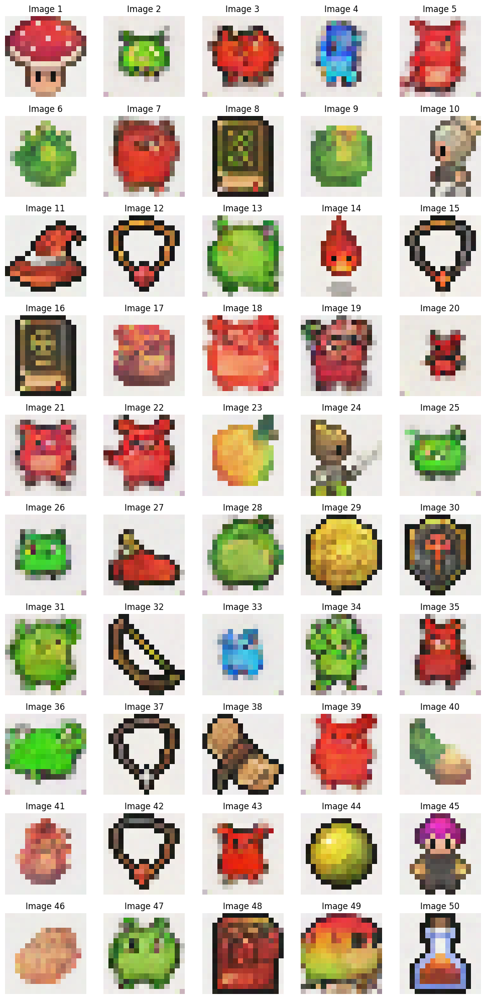


Generating and saving DDIM samples...


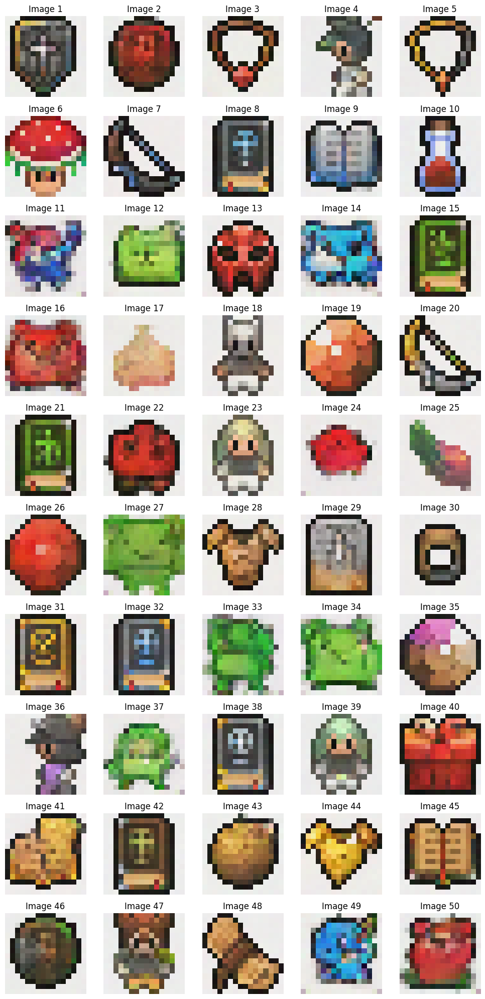


Summary:
DDPM Sampling Time: 7.09 seconds
DDIM Sampling Time: 5.61 seconds


In [41]:
import time
import os
import matplotlib.pyplot as plt

final_ddpm_dir = "results/ddpm"
final_ddim_dir = "results/ddim"
os.makedirs(final_ddpm_dir, exist_ok=True)
os.makedirs(final_ddim_dir, exist_ok=True)

print("\nTiming the generation of samples using DDPM and DDIM...")

start_ddpm = time.time()
final_samples_ddpm = sample_ddpm(
    nn_model, n_sample=50, timesteps=timesteps, beta=beta, alpha=alpha, alpha_bar=alpha_bar, device=device, height=height
).cpu()
end_ddpm = time.time()
ddpm_time = end_ddpm - start_ddpm
print(f"Time taken for DDPM sampling: {ddpm_time:.2f} seconds")

start_ddim = time.time()
final_samples_ddim = sample_ddim(
    nn_model, n_sample=50, timesteps=timesteps, beta=beta, alpha=alpha, alpha_bar=alpha_bar, device=device, height=height, eta=1, n_steps=600
).cpu()
end_ddim = time.time()
ddim_time = end_ddim - start_ddim
print(f"Time taken for DDIM sampling: {ddim_time:.2f} seconds")

print("\nGenerating and saving DDPM samples...")
plot_sample(final_samples_ddpm, 50, nrows=10)
plt.savefig(os.path.join(final_ddpm_dir, 'ddpm_final_samples.png'))
plt.close()

print("\nGenerating and saving DDIM samples...")
plot_sample(final_samples_ddim, 50, nrows=10)
plt.savefig(os.path.join(final_ddim_dir, 'ddim_final_samples.png'))
plt.close()

print("\nSummary:")
print(f"DDPM Sampling Time: {ddpm_time:.2f} seconds")
print(f"DDIM Sampling Time: {ddim_time:.2f} seconds")
